# Stock Options

In [1]:
# @title Configuration

##### Imports #####

import glob
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import math
from typing import List, Dict, Optional, Callable
from functools import partial
from scipy.stats import norm
import statistics
from dataclasses import dataclass, asdict
from sklearn.base import ClassifierMixin
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report, precision_score, accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error
import random
import logging
import copy

!pip install py_vollib
from py_vollib.black_scholes_merton.implied_volatility import implied_volatility

from tqdm.notebook import tqdm
from google.colab import drive
from importlib import reload
from IPython.display import clear_output


##### Configuration #####
drive.mount("/content/drive/")
warnings.filterwarnings("ignore")
sns.set(font_scale=2)
sns.set_palette("icefire")
sns.set_style("white")
tqdm.pandas()
tqdm.pandas()
pd.set_option('display.max_columns', None)
reload(logging)
logging.basicConfig(
    level=logging.DEBUG,
    format="%(levelname)s %(message)s"
)
random.seed(42)

##### Constants #####

## Tickers ##
PETR4_TICKER = "PETR4"
VALE3_TICKER = "VALE3"
ITUB4_TICKER = "ITUB4"
BBAS3_TICKER = "BBAS3"
ABEV3_TICKER = "ABEV3"
B3SA3_TICKER = "B3SA3"
VIVT3_TICKER = "VIVT3"
ELET3_TICKER = "ELET3"
BPAC11_TICKER = "BPAC11"
GGBR4_TICKER = "GGBR4"
BOVA11_TICKER = "BOVA11"
TICKERS_LIST = [
    PETR4_TICKER,
    VALE3_TICKER,
    ITUB4_TICKER,
    BBAS3_TICKER,
    ABEV3_TICKER,
    B3SA3_TICKER,
    VIVT3_TICKER,
    ELET3_TICKER,
    BPAC11_TICKER,
    GGBR4_TICKER,
    BOVA11_TICKER,
]
LIQUID_TICKERS_LIST = [
    PETR4_TICKER,
    VALE3_TICKER,
    ITUB4_TICKER,
    BBAS3_TICKER,
    ABEV3_TICKER,
    B3SA3_TICKER,
    GGBR4_TICKER,
    BOVA11_TICKER,
]

## Data ##
DATA_FOLDER_PATH = "/content/drive/MyDrive/UFC/TCC_STOCK_OPTIONS/stock-options/data/"
DATA_PATH = DATA_FOLDER_PATH + "COTAHIST_A*.TXT"
TICKER_PATTERN = "".join([f"({ticker})|" for ticker in [
    "PETR", # PETR4, Petrobras
    "VALE", # VALE3, Vale
    "ITUB", # ITUB4, Itaú
    "BBAS", # BBAS3, Banco do Brasil
    "ABEV", # ABEV3, Ambev
    "B3SA", # B3SA3, B3
    "VIVT", # VIVT3, Vivo
    "ELET", # ELET3, Eletrobrás
    "BPAC", # BPAC11, BTG Pactual
    "GGBR", # GGBR4, Gerdau
    "BOV", # BOVA11, IBovespa
]])[:-1]
# Market types for the column 'tipo_mercado'
STOCK_COD, CALL_COD, PUT_COD = 10, 70, 80
FIELD_WIDTHS = [
    2, 8, 2, 12, 3, 12, 10, 3, 4, 13, 13, 13, 13,
    13, 13, 13, 5, 18, 18, 13, 1, 8, 7, 13, 12, 3
]
COLUMNS = [
    "tipo_registro", "data_pregao", "cod_bdi", "cod_negociacao", "tipo_mercado",
    "nome_empresa", "especificacao_papel", "prazo_dias_merc_termo", "moeda_referencia",
    "preco_abertura", "preco_maximo", "preco_minimo", "preco_medio", "preco_ultimo_negocio",
    "preco_melhor_oferta_compra", "preco_melhor_oferta_venda", "numero_negocios",
    "quantidade_papeis_negociados", "volume_total_negociado", "preco_exercicio",
    "ìndicador_correcao_precos", "data_vencimento" , "fator_cotacao",
    "preco_exercicio_pontos", "codigo_isin", "num_distribuicao_papel"
]
USEFUL_COLUMNS = [
    "data_pregao",
    "cod_negociacao", # E.g. PETR4, VALE3
    "especificacao_papel",
    "tipo_mercado",
    "preco_ultimo_negocio",
    "preco_maximo",
    "volume_total_negociado",
    "preco_exercicio",
    "data_vencimento",
]
USEFUL_NUMERICAL_COLUMNS = [
    "preco_ultimo_negocio",
    "preco_maximo",
    "volume_total_negociado",
    "preco_exercicio",
]
USEFUL_DATE_COLUMNS = ["data_pregao", "data_vencimento"]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 8.9 MB/s eta 0:00:00
  Created wheel for py_vollib: filename=py_vollib-1.0.1-py3-none-any.whl size=62829 sha256=8f442eca4a32026aaeda73211702b04ed5590dfaf6a6ef4603e8abf0b11aa325
  Stored in directory: /root/.cache/pip/wheels/84/0c/fc/b68506eda40cccaeb0013be550ba904d253ec90eae2b156052
  Created wheel for py_lets_be_rational: filename=py_lets_be_rational-1.0.1-py3-none-any.whl size=24450 sha256=ce58a49daea8e483b548990b27909de499c0607d461b5a824058966c035a12d5
  Stored in directory: /root/.cache/pip/wheels/32/d9/4f/360d4b0b9ec7c65583ec7c8e72fd2158c97ad04fbcb932891c
Successfully built py_vollib py_lets_be_rational
Mounted at /content/drive/


## 1. Data Processing
In this section, we will prepare the data provided by B3 for stocks, calls and puts taking into account the impact of dividends. Then, we'll register the data so we don't have to go through this process again.

In [ ]:
# @title Load B3 raw data

class B3FilesFoundNotFound(Exception):
    pass

files: List[str] = glob.glob(DATA_PATH)
if len(files) == 0: raise B3FilesFoundNotFound()

assets_df = pd.DataFrame()
for f in files:
    temp_df = pd.read_fwf(
        f,
        widths=FIELD_WIDTHS,
        names=COLUMNS,
        dtype={"data_pregao": np.int64, "data_vencimento": np.int64},
        header=None,
        # The first and the last rows contain metadata, so we drop them
        skiprows=1,
        skipfooter=1,
    )[USEFUL_COLUMNS]
    temp_df = temp_df[
        (temp_df["cod_negociacao"].str.match(TICKER_PATTERN))
        & (temp_df["tipo_mercado"].isin([STOCK_COD, CALL_COD, PUT_COD]))
    ]

    assets_df = assets_df.append(temp_df)

assets_df.reset_index(drop=True, inplace=True)
# Divide all numerical columns by 100 to get the right decimal value
assets_df[USEFUL_NUMERICAL_COLUMNS] = assets_df[USEFUL_NUMERICAL_COLUMNS].div(100)

del temp_df

# Save data
assets_df.to_csv(DATA_FOLDER_PATH + "assets.csv", index=False)

In [ ]:
assets_df = pd.read_csv(DATA_FOLDER_PATH + "assets.csv")

assets_df.sample(3)

### Datasets

In [ ]:
# @title Stocks

def get_raw_stock_df(ticker: str, assest_df: pd.DataFrame) -> pd.DataFrame:
    stock_df_ = assets_df[
        (assets_df["cod_negociacao"] == ticker)
        & (assets_df["tipo_mercado"] == STOCK_COD)
    ].sort_values("data_pregao").reset_index(drop=True)
    stock_df_["data_pregao"] = pd.to_datetime(stock_df_["data_pregao"], format="%Y%m%d")
    return stock_df_

petr4_stock_df_ = get_raw_stock_df(PETR4_TICKER, assets_df)
vale3_stock_df_ = get_raw_stock_df(VALE3_TICKER, assets_df)
itub4_stock_df_ = get_raw_stock_df(ITUB4_TICKER, assets_df)
bbas3_stock_df_ = get_raw_stock_df(BBAS3_TICKER, assets_df)
abev3_stock_df_ = get_raw_stock_df(ABEV3_TICKER, assets_df)
b3sa3_stock_df_ = get_raw_stock_df(B3SA3_TICKER, assets_df)
vivt3_stock_df_ = get_raw_stock_df(VIVT3_TICKER, assets_df)
elet3_stock_df_ = get_raw_stock_df(ELET3_TICKER, assets_df)
ggbr4_stock_df_ = get_raw_stock_df(GGBR4_TICKER, assets_df)
bpac11_stock_df_ = get_raw_stock_df(BPAC11_TICKER, assets_df)
bova11_stock_df = get_raw_stock_df(BOVA11_TICKER, assets_df)

### Plot Graphs ###
plt.figure(figsize=(30,20))

plt.subplot(4,3,1)
sns.lineplot(data=petr4_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("PETR4 Price")

plt.subplot(4,3,2)
sns.lineplot(data=vale3_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("VALE3 Price")

plt.subplot(4,3,3)
sns.lineplot(data=itub4_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("ITUB4 Price")

plt.subplot(4,3,4)
sns.lineplot(data=bbas3_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("BBAS3 Price")

plt.subplot(4,3,5)
sns.lineplot(data=abev3_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("ABEV3 Price")

plt.subplot(4,3,6)
sns.lineplot(data=b3sa3_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("B3SA3 Price")

plt.subplot(4,3,7)
sns.lineplot(data=vivt3_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("VIVT3 Price")

plt.subplot(4,3,8)
sns.lineplot(data=elet3_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("ELET3 Price")

plt.subplot(4,3,9)
sns.lineplot(data=bpac11_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("BPAC11 Price")

plt.subplot(4,3,10)
sns.lineplot(data=ggbr4_stock_df_, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("GGBR4 Price")

plt.subplot(4,3,11)
sns.lineplot(data=bova11_stock_df, x="data_pregao", y="preco_ultimo_negocio")
_ = plt.title("BOVA11 Price")

In [ ]:
# @title Calls

def get_raw_call_df(ticker: str, assest_df: pd.DataFrame, stock_type: Optional[str] = None) -> pd.DataFrame:

    call_df_ = assets_df[
        (assets_df["cod_negociacao"].str.startswith(ticker))
        & (assets_df["tipo_mercado"] == CALL_COD)
    ].sort_values("data_pregao").reset_index(drop=True)
    if stock_type:
        call_df_ = call_df_[call_df_["especificacao_papel"].str.startswith(stock_type)]
    for date_col in USEFUL_DATE_COLUMNS:
        call_df_[date_col] = pd.to_datetime(call_df_[date_col], format="%Y%m%d")

    return call_df_

petr4_call_df_ = get_raw_call_df("PETR", assets_df, "PN")
vale3_call_df_ = get_raw_call_df("VALE", assets_df, "ON")
itub4_call_df_ = get_raw_call_df("ITUB", assets_df, "PN")
bbas3_call_df_ = get_raw_call_df("BBAS", assets_df, "ON")
abev3_call_df_ = get_raw_call_df("ABEV", assets_df, "ON")
b3sa3_call_df_ = get_raw_call_df("B3SA", assets_df, "ON")
vivt3_call_df_ = get_raw_call_df("VIVT", assets_df, "ON")
elet3_call_df_ = get_raw_call_df("ELET", assets_df, "ON")
bpac11_call_df_ = get_raw_call_df("BPAC", assets_df, "UNT")
ggbr4_call_df_ = get_raw_call_df("GGBR", assets_df, "PN")
bova11_call_df = get_raw_call_df("BOVA", assets_df, None)

### Handling Dividends and Stock Splits

We need to verify how the payment of dividends impacts the data provided by B3.
Since some stocks doesn't pay dividends to theirs inverstor (e.g. BOVA11), we don't need to worry about them at this point.

At the ex-dividend dates, the dividends paid by the company are taken away from both stock price and strike price.

Let's verify graphically how the dividends impact the stock and strike prices

In [ ]:
# @title The Impact of Paying Dividends

def plot_dividend_diff(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    call_code: str,
    start_date: datetime,
    ex_dividend_date: datetime,
) -> None:
    # Make the time interval symmetic around the dividend payment date
    end_date = ex_dividend_date + (ex_dividend_date - start_date)

    stock_filtered_df = stock_df[
        stock_df["data_pregao"].between(start_date, end_date)
    ]
    call_filtered_df = call_df[
        call_df["data_pregao"].between(start_date, end_date)
        & (call_df["cod_negociacao"] == call_code)
    ]

    sns.set_palette("icefire")
    sns.set_style("white")
    # Plot the graph
    _ = sns.lineplot(
        data=stock_filtered_df,
        x="data_pregao",
        y="preco_ultimo_negocio",
        label="Stock price",
        color="k"
    )
    _ = sns.lineplot(
        data=call_filtered_df,
        x="data_pregao",
        y="preco_exercicio",
        label="Strike price"
    )
    plt.title("Impact of Dividends on Prices")
    plt.axvline(
        ex_dividend_date, 0, 40, linestyle='--',
        linewidth=0.35, color="k", label="Ex-dividend date"
    ) # type: ignore
    plt.legend()
    _ = plt.xticks(rotation="vertical")

    strike_price_diff = (
        call_filtered_df[call_filtered_df['data_pregao'] == ex_dividend_date + timedelta(days=1)]['preco_exercicio'].iloc[0]
        - call_filtered_df[call_filtered_df['data_pregao'] == ex_dividend_date]['preco_exercicio'].iloc[0]
    )
    print(f"Strike price difference for {call_code} from {ex_dividend_date.date()} to {ex_dividend_date.date() + timedelta(days=1)}: {strike_price_diff:.2f} BRL")

plt.figure(figsize=(20, 7))

plt.subplot(1,2,1)
plot_dividend_diff(
    stock_df=petr4_stock_df_,
    call_df=petr4_call_df_,
    call_code="PETRH374",
    start_date=datetime(year=2022, month=7, day=27),
    ex_dividend_date=datetime(year=2022, month=8, day=11),
)
plt.title("PETR4. Impact of Dividends on Prices")

plt.subplot(1,2,2)
plot_dividend_diff(
    stock_df=vale3_stock_df_,
    call_df=vale3_call_df_,
    call_code="VALEC922",
    start_date=datetime(year=2021, month=2, day=24),
    ex_dividend_date=datetime(year=2021, month=3, day=4),
)
_ = plt.title("VALE3. Impact of Dividends on Prices")

In [ ]:
# @title Load Dividends

petr4_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/petr4_dividends.csv")
vale3_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/vale3_dividends.csv")
itub4_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/itub4_dividends.csv")
bbas3_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/bbas3_dividends.csv")
abev3_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/abev3_dividends.csv")
b3sa3_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/b3sa3_dividends.csv")
vivt3_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/vivt3_dividends.csv")
elet3_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/elet3_dividends.csv")
bpac11_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/bpac11_dividends.csv")
ggbr4_dividends_df = pd.read_csv(DATA_FOLDER_PATH + "dividends/ggbr4_dividends.csv")

for date_col in ["ex_date", "payment_date"]:
    petr4_dividends_df[date_col] = pd.to_datetime(petr4_dividends_df[date_col], format="%d/%m/%Y")
    vale3_dividends_df[date_col] = pd.to_datetime(vale3_dividends_df[date_col], format="%d/%m/%Y")
    itub4_dividends_df[date_col] = pd.to_datetime(itub4_dividends_df[date_col], format="%d/%m/%Y")
    bbas3_dividends_df[date_col] = pd.to_datetime(bbas3_dividends_df[date_col], format="%d/%m/%Y")
    abev3_dividends_df[date_col] = pd.to_datetime(abev3_dividends_df[date_col], format="%d/%m/%Y")
    b3sa3_dividends_df[date_col] = pd.to_datetime(b3sa3_dividends_df[date_col], format="%d/%m/%Y")
    vivt3_dividends_df[date_col] = pd.to_datetime(vivt3_dividends_df[date_col], format="%d/%m/%Y")
    elet3_dividends_df[date_col] = pd.to_datetime(elet3_dividends_df[date_col], format="%d/%m/%Y")
    bpac11_dividends_df[date_col] = pd.to_datetime(bpac11_dividends_df[date_col], format="%d/%m/%Y")
    ggbr4_dividends_df[date_col] = pd.to_datetime(ggbr4_dividends_df[date_col], format="%d/%m/%Y")

#### Undo Share Splits and Rectify Dividends

In [ ]:
def rectify_dividends(
    df: pd.DataFrame,
    dividend_df: pd.DataFrame,
    price_column: str,
) -> pd.DataFrame:
    """
    Add the dividends to the price_column in df
    """

    rectified_df = df.copy()
    for _, dividend_row in dividend_df.iterrows():
      rectified_df[price_column] = rectified_df.apply(
          lambda row: row[price_column] + dividend_row["net_dividend_paid"]
          # Use >, because the reduction in the price due to dividends only occurs in the next day
          if row["data_pregao"] > dividend_row["ex_date"]
          else row[price_column],
          axis=1
      )

    return rectified_df

petr4_dividends_per_ex_date_df = petr4_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()
vale3_dividends_per_ex_date_df = vale3_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()
itub4_dividends_per_ex_date_df = itub4_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()
bbas3_dividends_per_ex_date_df = bbas3_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()
abev3_dividends_per_ex_date_df = abev3_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()
b3sa3_dividends_per_ex_date_df = b3sa3_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()
vivt3_dividends_per_ex_date_df = vivt3_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()
elet3_dividends_per_ex_date_df = elet3_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()
ggbr4_dividends_per_ex_date_df = ggbr4_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()
bpac11_dividends_per_ex_date_df = bpac11_dividends_df[
    ["ex_date", "net_dividend_paid"]
].groupby("ex_date").sum().reset_index()

In [ ]:
########## Stocks ##########

petr4_stock_df = rectify_dividends(
    df=petr4_stock_df_,
    dividend_df=petr4_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
vale3_stock_df = rectify_dividends(
    df=vale3_stock_df_,
    dividend_df=vale3_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
itub4_stock_df = rectify_dividends(
    df=itub4_stock_df_,
    dividend_df=itub4_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
# Desdobramento das ações. https://www.itau.com.br/relacoes-com-investidores/itau-unibanco/nossas-acoes/historico-de-eventos/
itub4_stock_df["preco_ultimo_negocio"] = itub4_stock_df.apply(
    lambda row: (2/3)*row["preco_ultimo_negocio"] if row["data_pregao"] <= datetime(year=2018, month=11, day=19) else row["preco_ultimo_negocio"],
    axis=1
)
bbas3_stock_df = rectify_dividends(
    df=bbas3_stock_df_,
    dividend_df=bbas3_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
abev3_stock_df = rectify_dividends(
    df=abev3_stock_df_,
    dividend_df=abev3_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
b3sa3_stock_df = rectify_dividends(
    df=b3sa3_stock_df_,
    dividend_df=b3sa3_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
# Desdobramento das ações. https://investnews.com.br/financas/desdobramento-das-acoes-da-b3-comeca-a-valer-nesta-segunda/
b3sa3_stock_df["preco_ultimo_negocio"] = b3sa3_stock_df.apply(
    lambda row: (1/3)*row["preco_ultimo_negocio"] if row["data_pregao"] <= datetime(year=2021, month=5, day=14) else row["preco_ultimo_negocio"],
    axis=1
)
vivt3_stock_df = rectify_dividends(
    df=vivt3_stock_df_,
    dividend_df=vivt3_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
elet3_stock_df = rectify_dividends(
    df=elet3_stock_df_,
    dividend_df=elet3_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
ggbr4_stock_df = rectify_dividends(
    df=ggbr4_stock_df_,
    dividend_df=ggbr4_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
bpac11_stock_df = rectify_dividends(
    df=bpac11_stock_df_,
    dividend_df=bpac11_dividends_per_ex_date_df,
    price_column="preco_ultimo_negocio"
)
# Desdobramento das ações.
bpac11_stock_df["preco_ultimo_negocio"] = bpac11_stock_df.apply(
    lambda row: (1/4)*row["preco_ultimo_negocio"] if row["data_pregao"] <= datetime(day=30, month=6, year=2021) else row["preco_ultimo_negocio"],
    axis=1
)


########## Calls ##########

petr4_call_df = rectify_dividends(
    df=petr4_call_df_,
    dividend_df=petr4_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
vale3_call_df = rectify_dividends(
    df=vale3_call_df_,
    dividend_df=vale3_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
itub4_call_df = rectify_dividends(
    df=itub4_call_df_,
    dividend_df=itub4_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
itub4_call_df["preco_exercicio"] = itub4_call_df.apply(
    lambda row: (2/3)*row["preco_exercicio"] if row["data_pregao"] <= datetime(year=2018, month=11, day=19) else row["preco_exercicio"],
    axis=1
)
bbas3_call_df = rectify_dividends(
    df=bbas3_call_df_,
    dividend_df=bbas3_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
abev3_call_df = rectify_dividends(
    df=abev3_call_df_,
    dividend_df=abev3_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
b3sa3_call_df = rectify_dividends(
    df=b3sa3_call_df_,
    dividend_df=b3sa3_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
b3sa3_call_df["preco_exercicio"] = b3sa3_call_df.apply(
    lambda row: (1/3)*row["preco_exercicio"] if row["data_pregao"] <= datetime(year=2021, month=5, day=14) else row["preco_exercicio"],
    axis=1
)
vivt3_call_df = rectify_dividends(
    df=vivt3_call_df_,
    dividend_df=vivt3_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
elet3_call_df = rectify_dividends(
    df=elet3_call_df_,
    dividend_df=elet3_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
ggbr4_call_df = rectify_dividends(
    df=ggbr4_call_df_,
    dividend_df=ggbr4_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
bpac11_call_df = rectify_dividends(
    df=bpac11_call_df_,
    dividend_df=bpac11_dividends_per_ex_date_df,
    price_column="preco_exercicio"
)
# Desdobramento das ações.
bpac11_call_df["preco_exercicio"] = bpac11_call_df.apply(
    lambda row: (1/4)*row["preco_exercicio"] if row["data_pregao"] <= datetime(day=30, month=6, year=2021) else row["preco_exercicio"],
    axis=1
)

#### Stock Prices After and Before Manipulation

In [ ]:
plt.figure(figsize=(30,20))

plt.subplot(4,3,1)
plt.title("PETR4 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=petr4_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=petr4_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

plt.subplot(4,3,2)
plt.title("VALE3 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=vale3_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=vale3_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

plt.subplot(4,3,3)
plt.title("ITUB4 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=itub4_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=itub4_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

plt.subplot(4,3,4)
plt.title("BBAS3 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=bbas3_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=bbas3_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

plt.subplot(4,3,5)
plt.title("ABEV3 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=abev3_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=abev3_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

plt.subplot(4,3,6)
plt.title("B3SA3 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=b3sa3_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=b3sa3_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

plt.subplot(4,3,7)
plt.title("VIVT3 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=vivt3_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=vivt3_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

plt.subplot(4,3,8)
plt.title("ELET3 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=elet3_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=elet3_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

plt.subplot(4,3,9)
plt.title("GGBR4 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=ggbr4_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=ggbr4_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

plt.subplot(4,3,10)
plt.title("BPAC11 Price With and Without Dividend Retification")
_ = sns.lineplot(
    data=bpac11_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="Price", color='b'
)
_ = sns.lineplot(
    data=bpac11_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="Price with dividends", color='k'
)
_ = plt.xticks(rotation='vertical')

### Save Processed Data

In [ ]:
# Stocks
petr4_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/petr4_stock.csv", index=False)
vale3_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/vale3_stock.csv", index=False)
itub4_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/itub4_stock.csv", index=False)
bbas3_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/bbas3_stock.csv", index=False)
abev3_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/abev3_stock.csv", index=False)
b3sa3_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/b3sa3_stock.csv", index=False)
vivt3_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/vivt3_stock.csv", index=False)
elet3_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/elet3_stock.csv", index=False)
ggbr4_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/ggbr4_stock.csv", index=False)
bpac11_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/bpac11_stock.csv", index=False)
bova11_stock_df.to_csv(DATA_FOLDER_PATH + "processed_data/bova11_stock.csv", index=False)

# Calls
petr4_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/petr4_call.csv", index=False)
vale3_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/vale3_call.csv", index=False)
itub4_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/itub4_call.csv", index=False)
bbas3_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/bbas3_call.csv", index=False)
abev3_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/abev3_call.csv", index=False)
b3sa3_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/b3sa3_call.csv", index=False)
vivt3_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/vivt3_call.csv", index=False)
elet3_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/elet3_call.csv", index=False)
ggbr4_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/ggbr4_call.csv", index=False)
bpac11_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/bpac11_call.csv", index=False)
bova11_call_df.to_csv(DATA_FOLDER_PATH + "processed_data/bova11_call.csv", index=False)

## 2. Data Manipulation

In [9]:
# @title Load the Processed Data

stock_df_dict = {}
call_df_dict = {}
for ticker in TICKERS_LIST:
    stock_df_dict[ticker] = pd.read_csv(
        DATA_FOLDER_PATH + f"processed_data/{ticker.lower()}_stock.csv",
        parse_dates=["data_pregao"], date_parser=lambda date_str: datetime.strptime(date_str, '%Y-%m-%d')
    )
    call_df_dict[ticker] = pd.read_csv(
        DATA_FOLDER_PATH + f"processed_data/{ticker.lower()}_call.csv",
        parse_dates=["data_pregao", "data_vencimento"], date_parser=lambda date_str: datetime.strptime(date_str, '%Y-%m-%d')
    )

In [ ]:
# @title Selic Rate

selic_df = pd.read_csv(DATA_FOLDER_PATH + "selic.csv")
selic_df["release_date"] = pd.to_datetime(selic_df["release_date"], format="%d/%m/%Y")

def get_current_selic(date: datetime) -> float:
    return selic_df[selic_df["release_date"] <= date]["selic"].iloc[0]/100

In [10]:
# @title Historical Volatility

def annualized_hist_volatility(
    stock_df: pd.DataFrame,
    end_date: datetime = datetime(year=2022, month=7, day=4),
    offset: int = 20 # How far in the past
) -> float:
    end_idx = stock_df[stock_df["data_pregao"] == end_date].index[0]
    df = stock_df.iloc[max(0, end_idx-offset+1):end_idx+1]
    return np.log(df["preco_ultimo_negocio"]/df["preco_ultimo_negocio"].shift(1)).std()*math.sqrt(252)

print(
    f"PETR4 Annualized Volatility: {100*annualized_hist_volatility(stock_df_dict[PETR4_TICKER], end_date=stock_df_dict[PETR4_TICKER]['data_pregao'].max(), offset=stock_df_dict[PETR4_TICKER].shape[0]):.2f}%\n"
)
print(
    f"VALE3 Annualized Volatility: {100*annualized_hist_volatility(stock_df_dict[VALE3_TICKER], end_date=stock_df_dict[VALE3_TICKER]['data_pregao'].max(), offset=stock_df_dict[VALE3_TICKER].shape[0]):.2f}%"
)

PETR4 Annualized Volatility: 44.79%

VALE3 Annualized Volatility: 37.10%


In [ ]:
# @title Implied Volatility

def black_scholes_call(
    stock_price: float,
    strike_price: float,
    time_to_maturity: float,
    risk_free_rate: float,
    volatility: float
) -> float:
    """Calculate the call price
    """

    # Standard black-scholes formula
    d1 = (
        np.log(stock_price / strike_price) + (risk_free_rate + volatility ** 2 / 2) * time_to_maturity
    ) / (volatility * np.sqrt(time_to_maturity))
    d2 = d1 - volatility * np.sqrt(time_to_maturity)

    return stock_price * norm.cdf(d1) -  norm.cdf(d2)* strike_price * np.exp(-risk_free_rate * time_to_maturity)

def vega(
    stock_price: float,
    strike_price: float,
    time_to_maturity: float,
    risk_free_rate: float,
    volatility: float
) -> float:
    """Calculate partial derivative w.r.t volatility
    """

    # Calculate d1 from black scholes
    d1 = (
        np.log(stock_price / strike_price) + (risk_free_rate + volatility ** 2 / 2) * time_to_maturity
    ) / volatility * np.sqrt(time_to_maturity)

    return stock_price  * np.sqrt(time_to_maturity) * norm.pdf(d1)

def implied_volatility_call(
    call_price: float,
    stock_price: float,
    strike_price: float,
    time_to_maturity: float,
    risk_free_rate: float,
    tol: float = 0.0001,
    max_iterations: int = 100
) -> float:
    """Calculate the implied volatility in percent
    """

    # Initial volatility estimate for input in Newton_rap procedure
    volatility = 0.3

    for i in range(max_iterations):

        # Calculate difference between blackscholes price and market price with
        # iteratively updated volality estimate
        diff = black_scholes_call(stock_price, strike_price, time_to_maturity, risk_free_rate, volatility) - call_price

        # Break if difference is less than specified tolerance level
        if abs(diff) < tol:
            # print(f"Found on the {i}th iteration. The difference is equal to {diff}")
            break

        # Update the estimate with Newton Rapshon
        volatility = volatility - diff / vega(stock_price, strike_price, time_to_maturity, risk_free_rate, volatility)

    return volatility

def calculate_implied_volatilities(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    dates: pd.Series,
) -> List[float]:
    annualized_implied_vols = []
    for i in range(len(dates)-1):
        stock_price = stock_df[
            stock_df["data_pregao"] == dates[i]
        ]["preco_ultimo_negocio"].iloc[0]

        filtered_call_df = call_df[
            (call_df["data_pregao"] == dates[i])
            & (call_df["data_vencimento"] == dates[i+1])
        ]
        # Choose call that has the strike price the closest to the stock price
        call_option = filtered_call_df.loc[
            (filtered_call_df["preco_exercicio"] - stock_price).abs().sort_values().index[0]
        ]

        annualized_implied_vols.append(implied_volatility_call(
          call_price=call_option["preco_ultimo_negocio"],
          stock_price=stock_price,
          strike_price=call_option["preco_exercicio"],
          time_to_maturity=(dates[i+1] - dates[i]).astype('timedelta64[D]').astype(int)/365,
          risk_free_rate=get_current_selic(date=dates[i])
        ))

    return annualized_implied_vols

In [ ]:
# @title Historical vs Implied Volatilities

last_n_working_days = 60
min_date = datetime(year=2019, month=1, day=1) # Make sure there are at least 'last_n_working_days' days prior to min_date
max_date = datetime(year=2022, month=8, day=31)
dates = call_df_dict[PETR4_TICKER][call_df_dict[PETR4_TICKER]["data_vencimento"].between(min_date, max_date)]["data_vencimento"].unique()
dates.sort()

##### Historical Volatilities #####
petr4_annualized_hist_vols = []
vale3_annualized_hist_vols = []
for date in dates[:-1]:
    petr4_annualized_hist_vols.append(
        annualized_hist_volatility(stock_df_dict[PETR4_TICKER], end_date=date, offset=last_n_working_days)
    )
    vale3_annualized_hist_vols.append(
        annualized_hist_volatility(stock_df_dict[VALE3_TICKER], end_date=date, offset=last_n_working_days)
    )

##### Implied Volatilities #####
petr4_annualized_implied_vols = calculate_implied_volatilities(
    stock_df=stock_df_dict[PETR4_TICKER],
    call_df=call_df_dict[PETR4_TICKER],
    dates=dates,
)
vale3_annualized_implied_vols = calculate_implied_volatilities(
    stock_df=stock_df_dict[VALE3_TICKER],
    call_df=call_df_dict[VALE3_TICKER],
    dates=dates,
)

##### Graphs #####
plt.figure(figsize=(20,14))

plt.subplot(2, 2, 1)
_ = sns.lineplot(
    y=petr4_annualized_hist_vols, x=dates[:-1],
    label="Annualized Historical Volatility", color="b"
)
_ = sns.lineplot(
    y=petr4_annualized_implied_vols, x=dates[:-1],
    label="Annualized Implied Volatility", color="k"
)
plt.title("PETR4 Annualized Volatility. Historical VS Implied")
plt.ylabel(f"Annualized Volatility")
_ = plt.xlabel("Date")
_ = plt.xticks(rotation="vertical")

plt.subplot(2, 2, 2)
_ = sns.lineplot(
    y=vale3_annualized_hist_vols, x=dates[:-1],
    label="Annualized Historical Volatility", color="b"
)
_ = sns.lineplot(
    y=vale3_annualized_implied_vols, x=dates[:-1],
    label="Annualized Implied Volatility", color="k"
)
plt.title("VALE3 Annualized Volatility. Historical VS Implied")
plt.ylabel(f"Annualized Volatility")
_ = plt.xlabel("Date")
_ = plt.xticks(rotation="vertical")

In [ ]:
# @title Intrinsic and Extrinsic Values

def calculate_intrinsic_value(
    option_df: pd.DataFrame,
    stock_df: pd.DataFrame,
    is_call: bool
) -> None:
    option_df["valor_intrinseco"] = option_df.apply(
        lambda row: max(
            stock_df[stock_df["data_pregao"] == row["data_pregao"]]["preco_ultimo_negocio"].iloc[0] - row["preco_exercicio"]
            if is_call
            else row["preco_exercicio"] - stock_df[stock_df["data_pregao"] == row["data_pregao"]]["preco_ultimo_negocio"].iloc[0],
            0
        ),
        axis=1
    )

### Calls ###
calculate_intrinsic_value(petr4_call_df, petr4_stock_df, is_call=True)
calculate_intrinsic_value(vale3_call_df, vale3_stock_df, is_call=True)

petr4_call_df["valor_extrinseco"] = petr4_call_df["preco_ultimo_negocio"] - petr4_call_df["valor_intrinseco"]
vale3_call_df["valor_extrinseco"] = vale3_call_df["preco_ultimo_negocio"] - vale3_call_df["valor_intrinseco"]

#### Feature Engineering

In [3]:
# @title Features and Targets

### Features ###
DATE_FEATURE = "date"
PREMIUM_FEATURE = "premium" # Call price
PREMIUM_PROTECTION_FEATURE = "premium_protection" # How much the stock can fall without profit loss
STOCK_PRICE_FEATURE = "stock_price"
STRIKE_DATE_FEATURE = "strike_date"
STRIKE_PRICE_FEATURE = "strike_price"
STRIKE_MARGIN_FEATURE = "strike_margin" # Strike price divided by the current stock price
TIME_TO_EXPIRE_DAYS_FEATURE = "time_to_expire_days"
VOLUME_TRADED_FEATURE = "volume_traded"
LAST_30_DAYS_AVERAGE_VOLUME_TRADED_FEATURE = "last_30_days_average_volume"
LAST_30_DAYS_HISTORICAL_VOLATILITY_FEATURE = "last_30_days_hist_volatility"
LAST_60_DAYS_HISTORICAL_VOLATILITY_FEATURE = "last_60_days_hist_volatility"
LAST_90_DAYS_HISTORICAL_VOLATILITY_FEATURE = "last_90_days_hist_volatility"
LAST_180_DAYS_HISTORICAL_VOLATILITY_FEATURE = "last_180_hist_volatility"
IMPLIED_VOLATILITY_FEATURE = "implied_volatility"
LAST_100_DAYS_MOVING_AVERAGE_FEATURE = "last_100_days_moving_average"
LAST_100_DAYS_EXPONENTIAL_MOVING_AVERAGE_FEATURE = "last_100_days_exp_moving_average"
STOCK_PRICE__MOVING_AVERAGE__RATIO_FEATURE = "stock_price_moving_average_ratio"
STOCK_PRICE__EXPONENTIAL_MOVING_AVERAGE__RATIO_FEATURE = "stock_price_exp_moving_average_ratio"
LAST_30_DAYS_RSI = "last_30_days_rsi"
LAST_90_DAYS_STOCHASTIC = "last_90_days_stochastic"
LAST_30_DAYS_BUY_AND_HOLD_RETURN_FEATURE = "last_30_days_return"
LAST_60_DAYS_BUY_AND_HOLD_RETURN_FEATURE = "last_60_days_return"
LAST_90_DAYS_BUY_AND_HOLD_RETURN_FEATURE = "last_90_days_return"

### Targets ###
CC_NEXT_MONTH_RETURN_TARGET = "cc_next_month_return"
NEXT_MONTH_BUY_AND_HOLD_RETURN_TARGET = "next_month_buy_and_hold_return"
CC_BETTER_THAN_BUY_AND_HOLD_TARGET = "cc_better_than_buy_and_hold"
CC_BETTER_THAN_BUY_AND_HOLD_AMOUNT_TARGET = "cc_better_than_buy_and_hold_amount"

In [12]:
# @title Functions

class NoNegociationsOnDate(Exception):
    pass

def calculate_return(
    start_price: float,
    end_price: float,
) -> float:
    return (end_price - start_price)/start_price

def get_stock_price(
    stock_df: pd.DataFrame,
    date: datetime,
) -> float:
    return stock_df[stock_df["data_pregao"] >= date]["preco_ultimo_negocio"].iloc[0]

def calculate_single_month_cc_return(call_option: pd.Series, stock_df: pd.DataFrame):
    """
    Calculate the return at call_option["data_vencimento"] if we bought a stock
    at call_option["data_pregao"] and sold call_option
    """
    current_stock_price = get_stock_price(stock_df=stock_df, date=call_option["data_pregao"])
    next_month_stock_price = get_stock_price(stock_df=stock_df, date=call_option["data_vencimento"])

    premium = call_option["preco_ultimo_negocio"]
    initial_amount = current_stock_price
    final_amount = min(next_month_stock_price, call_option["preco_exercicio"]) + premium

    return calculate_return(start_price=initial_amount, end_price=final_amount)

def calculate_buy_and_hold_return(stock_df: pd.DataFrame, start_date: datetime, end_date: datetime):

    current_stock_price = get_stock_price(stock_df=stock_df, date=start_date)
    next_month_stock_price = get_stock_price(stock_df=stock_df, date=end_date)
    return calculate_return(start_price=current_stock_price, end_price=next_month_stock_price)

def calculate_moving_average(stock_df: pd.DataFrame, date: datetime, offset: int):
    return stock_df[
        (stock_df["data_pregao"] >= (date - timedelta(days=offset)))
        & (stock_df["data_pregao"] < date)
    ]["preco_ultimo_negocio"].mean()

def calculate_exp_moving_average(stock_df: pd.DataFrame, date: datetime, offset: int):
    df = stock_df[
        (stock_df["data_pregao"] < date)
    ]["preco_ultimo_negocio"].ewm(span=offset).mean()
    return df.iloc[-1] if df.shape[0] != 0 else np.nan

def calculate_average_volume(stock_df: pd.DataFrame, date: datetime, offset: int) -> float:
    return stock_df[
        (stock_df["data_pregao"] >= (date - timedelta(days=offset)))
        & (stock_df["data_pregao"] < date)
    ]["volume_total_negociado"].mean()

def calculate_rate_of_days_stock_above_strike(strike_price: float, stock_df: pd.DataFrame, date: datetime, offset: int) -> float:

    last_days_stock_df = stock_df[
        (stock_df["data_pregao"] >= (date - timedelta(days=offset)))
        & (stock_df["data_pregao"] < date)
    ]
    return (last_days_stock_df["preco_ultimo_negocio"] > strike_price).sum()/last_days_stock_df.shape[0]

def calculate_stochastic(stock_df: pd.DataFrame, date: datetime, offset: int) -> float:
    last_days_stock_df = stock_df[
        (stock_df["data_pregao"] >= (date - timedelta(days=offset)))
        & (stock_df["data_pregao"] < date)
    ]
    return (
        (get_stock_price(stock_df=stock_df, date=date) - last_days_stock_df["preco_ultimo_negocio"].min())
        / (last_days_stock_df["preco_ultimo_negocio"].max() - last_days_stock_df["preco_ultimo_negocio"].min())
    )

def calculate_rsi(stock_df: pd.DataFrame, offset: int):
    change = stock_df[STOCK_PRICE_FEATURE].diff()
    # change.dropna(inplace=True)

    change_up = change.copy()
    change_down = change.copy()

    change_up[change_up<0] = 0
    change_down[change_down>0] = 0

    # Verify that we did not make any mistakes
    change.equals(change_up+change_down)

    # Calculate the rolling average of average up and average down
    avg_up = change_up.rolling(offset).mean()
    avg_down = change_down.rolling(offset).mean().abs()

    return 100 * avg_up / (avg_up + avg_down)

def build_put_features(
    put_option: pd.Series,
    stock_df: pd.DataFrame,
):

    stock_price = get_stock_price(stock_df, put_option["data_pregao"])
    put_features = dict()

    put_features[DATE_FEATURE] = put_option["data_pregao"]
    put_features[STOCK_PRICE_FEATURE] = stock_price
    put_features[PREMIUM_FEATURE] = put_option["preco_ultimo_negocio"]
    put_features[STRIKE_DATE_FEATURE] = put_option["data_vencimento"]
    put_features[STRIKE_PRICE_FEATURE] = put_option["preco_exercicio"]
    put_features[STRIKE_MARGIN_FEATURE] = (
        put_option["preco_exercicio"] - stock_price
    )/stock_price
    put_features[TIME_TO_EXPIRE_DAYS_FEATURE] = (put_features[STRIKE_DATE_FEATURE] - put_features[DATE_FEATURE]).days
    put_features[VOLUME_TRADED_FEATURE] = put_option["volume_total_negociado"]

    return pd.Series(put_features)

def build_call_features(
    call_option: pd.Series,
    stock_df: pd.DataFrame,
    last_n_working_days: int,
):

    stock_price = get_stock_price(stock_df, call_option["data_pregao"])
    call_features = dict()

    call_features[DATE_FEATURE] = call_option["data_pregao"]
    call_features[STOCK_PRICE_FEATURE] = stock_price
    call_features[PREMIUM_FEATURE] = call_option["preco_ultimo_negocio"]
    call_features[PREMIUM_PROTECTION_FEATURE] = call_option["preco_ultimo_negocio"]/stock_price
    call_features[STRIKE_DATE_FEATURE] = call_option["data_vencimento"]
    call_features[STRIKE_PRICE_FEATURE] = call_option["preco_exercicio"]
    call_features[STRIKE_MARGIN_FEATURE] = (
        call_option["preco_exercicio"] - stock_price
    )/stock_price
    call_features[TIME_TO_EXPIRE_DAYS_FEATURE] = (call_features[STRIKE_DATE_FEATURE] - call_features[DATE_FEATURE]).days
    call_features[VOLUME_TRADED_FEATURE] = call_option["volume_total_negociado"]

    call_features[IMPLIED_VOLATILITY_FEATURE] = implied_volatility_call(
        call_price=call_features[PREMIUM_FEATURE],
        stock_price=call_features[STOCK_PRICE_FEATURE],
        strike_price=call_features[STRIKE_PRICE_FEATURE],
        time_to_maturity=call_features[TIME_TO_EXPIRE_DAYS_FEATURE]/365,
        risk_free_rate=get_current_selic(date=call_features[DATE_FEATURE]),
    )
    print(call_features[IMPLIED_VOLATILITY_FEATURE])

    return pd.Series(call_features)

def build_stock_features(
    stock: pd.Series,
    stock_df: pd.DataFrame,
    last_n_working_days: int = 90,
) -> pd.Series:
    stock_features = dict()

    stock_features[DATE_FEATURE] = stock["data_pregao"]
    stock_features[STOCK_PRICE_FEATURE] = stock["preco_ultimo_negocio"]
    stock_features[LAST_30_DAYS_HISTORICAL_VOLATILITY_FEATURE] = annualized_hist_volatility(
        stock_df,
        end_date=stock["data_pregao"],
        offset=30
    )
    stock_features[LAST_60_DAYS_HISTORICAL_VOLATILITY_FEATURE] = annualized_hist_volatility(
        stock_df,
        end_date=stock["data_pregao"],
        offset=60
    )
    stock_features[LAST_90_DAYS_HISTORICAL_VOLATILITY_FEATURE] = annualized_hist_volatility(
        stock_df,
        end_date=stock["data_pregao"],
        offset=90
    )
    stock_features[LAST_180_DAYS_HISTORICAL_VOLATILITY_FEATURE] = annualized_hist_volatility(
        stock_df,
        end_date=stock["data_pregao"],
        offset=180
    )
    stock_features[LAST_100_DAYS_MOVING_AVERAGE_FEATURE] = (
        calculate_moving_average(stock_df, date=stock["data_pregao"], offset=100)
    )
    stock_features[STOCK_PRICE__MOVING_AVERAGE__RATIO_FEATURE] = (
        stock_features[STOCK_PRICE_FEATURE]
        /
        calculate_moving_average(stock_df, date=stock["data_pregao"], offset=100)
    )
    stock_features[STOCK_PRICE__EXPONENTIAL_MOVING_AVERAGE__RATIO_FEATURE] = (
        stock_features[STOCK_PRICE_FEATURE]
        /
        calculate_exp_moving_average(stock_df, date=stock["data_pregao"], offset=100)
    ) #########
    stock_features[LAST_30_DAYS_AVERAGE_VOLUME_TRADED_FEATURE] = calculate_average_volume(
        stock_df=stock_df,
        date=stock["data_pregao"],
        offset=30
    )
    stock_features[LAST_90_DAYS_STOCHASTIC] = calculate_stochastic(
        stock_df=stock_df,
        date=stock["data_pregao"],
        offset=90
    )
    stock_features[LAST_30_DAYS_BUY_AND_HOLD_RETURN_FEATURE] = calculate_return(
        start_price=get_stock_price(stock_df, stock["data_pregao"] - timedelta(30)),
        end_price=stock_features[STOCK_PRICE_FEATURE],
    )
    stock_features[LAST_60_DAYS_BUY_AND_HOLD_RETURN_FEATURE] = calculate_return(
        start_price=get_stock_price(stock_df, stock["data_pregao"] - timedelta(60)),
        end_price=stock_features[STOCK_PRICE_FEATURE],
    )
    stock_features[LAST_90_DAYS_BUY_AND_HOLD_RETURN_FEATURE] = calculate_return(
        start_price=get_stock_price(stock_df, stock["data_pregao"] - timedelta(90)),
        end_price=stock_features[STOCK_PRICE_FEATURE],
    )
    try:
        stock_features[NEXT_MONTH_BUY_AND_HOLD_RETURN_TARGET] = calculate_return(
            start_price=stock_features[STOCK_PRICE_FEATURE],
            end_price=get_stock_price(stock_df, stock["data_pregao"] + timedelta(30)),
        )
    except:
      stock_features[NEXT_MONTH_BUY_AND_HOLD_RETURN_TARGET] = np.nan

    return pd.Series(stock_features)

def create_put_features_df(
    stock_df: pd.DataFrame,
    put_df: pd.DataFrame,
    start_date: datetime,
    end_date: datetime,
) -> pd.DataFrame:

    filtered_put_df = put_df[(put_df["data_pregao"] >= start_date) & (put_df["data_pregao"] <= end_date)]

    ### Features ###
    ml_df_ = put_df.progress_apply(lambda row: build_put_features(
        put_option=row,
        stock_df=stock_df,
    ), axis=1)

    ### Build the machine learning Dataframe ###
    return ml_df_.replace([np.inf, -np.inf], np.nan).dropna().reset_index(drop=True)

def create_call_features_df(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    start_date: datetime,
    end_date: datetime,
    last_n_working_days: int,
) -> pd.DataFrame:

    filtered_call_df = call_df[(call_df["data_pregao"] >= start_date) & (call_df["data_pregao"] <= end_date)]

    ### Features ###
    ml_df_ = filtered_call_df.progress_apply(lambda row: build_call_features(
        call_option=row,
        stock_df=stock_df,
        last_n_working_days=last_n_working_days,
    ), axis=1)

    ### Build the machine learning Dataframe ###
    return ml_df_.replace([np.inf, -np.inf], np.nan).dropna().reset_index(drop=True)

def create_stock_features_df(
    stock_df: pd.DataFrame,
    last_n_working_days: int,
) -> pd.DataFrame:

    ### Features ###
    ml_df_ = stock_df.progress_apply(lambda row: build_stock_features(
        stock=row,
        stock_df=stock_df,
        last_n_working_days=last_n_working_days,
    ), axis=1)
    ml_df_[LAST_30_DAYS_RSI] = calculate_rsi(stock_df=ml_df_, offset=30)

    ### Build the machine learning Dataframe ###
    return ml_df_.replace([np.inf, -np.inf], np.nan).dropna().reset_index(drop=True)

In [13]:
# @title Datasets

call_features_df_map: Dict[str, pd.DataFrame] = {}
stock_features_df_map: Dict[str, pd.DataFrame] = {}

progress_bar = tqdm(LIQUID_TICKERS_LIST, leave=False)
for ticker in progress_bar:
    progress_bar.set_description(ticker)

    call_features_df_map[ticker] = create_call_features_df(
        stock_df=stock_df_dict[ticker],
        call_df=call_df_dict[ticker],
        start_date=datetime(year=2022, month=1, day=1),
        end_date=datetime(year=2022, month=12, day=31),
        last_n_working_days=60,
    )
    call_features_df_map[ticker].to_csv(DATA_FOLDER_PATH + f"final_data/{ticker.lower()}_call_features.csv", index=False)

    stock_features_df_map[ticker] = create_stock_features_df(
        stock_df=stock_df_dict[ticker],
        last_n_working_days=90,
    )
    stock_features_df_map[ticker].to_csv(DATA_FOLDER_PATH + f"final_data/{ticker.lower()}_stock_features.csv", index=False)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1292 [00:00<?, ?it/s]

#### Analysis

In [ ]:
features = [
    STOCK_PRICE_FEATURE,
    LAST_30_DAYS_AVERAGE_VOLUME_TRADED_FEATURE,
    LAST_30_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    LAST_60_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    LAST_90_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    LAST_180_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    STOCK_PRICE__MOVING_AVERAGE__RATIO_FEATURE,
    LAST_30_DAYS_RSI,
    LAST_30_DAYS_BUY_AND_HOLD_RETURN_FEATURE,
    LAST_60_DAYS_BUY_AND_HOLD_RETURN_FEATURE,
    LAST_90_DAYS_BUY_AND_HOLD_RETURN_FEATURE,
]

In [4]:
# @title Load data

feature_df_map = {}
for ticker in TICKERS_LIST:
    feature_df_map[ticker] = pd.read_csv(
        DATA_FOLDER_PATH + f"final_data/{ticker.lower()}_stock_features.csv",
        parse_dates=[DATE_FEATURE],
        date_parser=lambda date_str: datetime.strptime(date_str, "%Y-%m-%d")
    )

In [ ]:
# @title Data Description

for ticker in LIQUID_TICKERS_LIST:
    display(feature_df_map[ticker].describe())

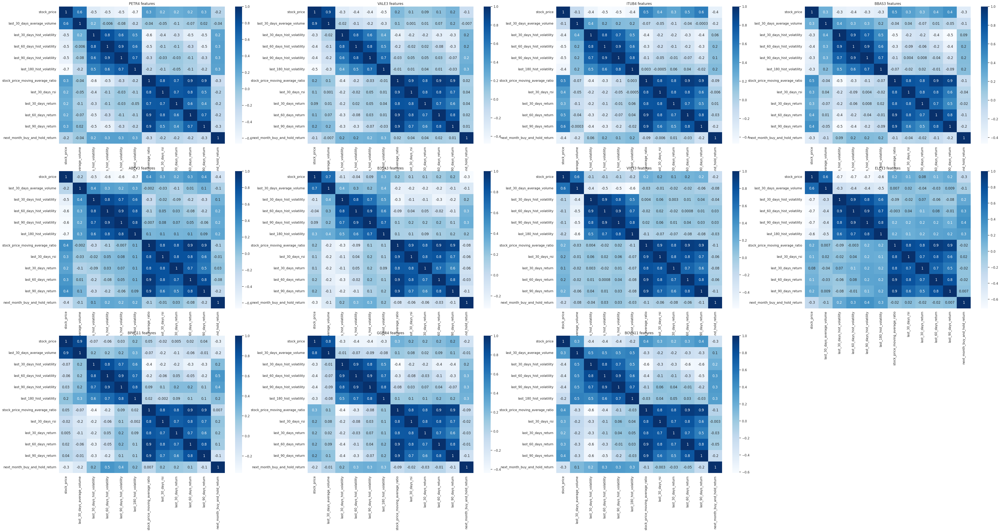

In [ ]:
# @title Correlation

plt.figure(figsize=(60,40))
sns.set_theme(style="white")

for idx, ticker in enumerate(feature_df_map.keys()):
    plt.subplot(4, 4, idx+1)
    plt.title(f"{ticker} features")
    corr = feature_df_map[ticker][[*features, NEXT_MONTH_BUY_AND_HOLD_RETURN_TARGET]].corr()
    heatmap = sns.heatmap(corr, annot=True, cmap="Blues", fmt='.1g')

In [ ]:
# @title Scatter Plot

ticker = "ITUB4"

plt.figure(figsize=(30,20))
n_sqrt = len(features)**(1/2)
n = math.floor(n_sqrt)
for idx, feature in enumerate(features):
    plt.subplot(n if n==n_sqrt else n+1, n, idx+1)
    sns.scatterplot(data=feature_df_map[ticker], x=feature, y=NEXT_MONTH_BUY_AND_HOLD_RETURN_TARGET)

## 3. Strategies

In [33]:
# @title Load Features

# @title Features and Targets

### Features ###
DATE_FEATURE = "date"
PREMIUM_FEATURE = "premium" # Call price
PREMIUM_PROTECTION_FEATURE = "premium_protection" # How much the stock can fall without profit loss
STOCK_PRICE_FEATURE = "stock_price"
STRIKE_DATE_FEATURE = "strike_date"
STRIKE_PRICE_FEATURE = "strike_price"
STRIKE_MARGIN_FEATURE = "strike_margin" # Strike price divided by the current stock price
TIME_TO_EXPIRE_DAYS_FEATURE = "time_to_expire_days"
VOLUME_TRADED_FEATURE = "volume_traded"
LAST_30_DAYS_AVERAGE_VOLUME_TRADED_FEATURE = "last_30_days_average_volume"
LAST_30_DAYS_HISTORICAL_VOLATILITY_FEATURE = "last_30_days_hist_volatility"
LAST_60_DAYS_HISTORICAL_VOLATILITY_FEATURE = "last_60_days_hist_volatility"
LAST_90_DAYS_HISTORICAL_VOLATILITY_FEATURE = "last_90_days_hist_volatility"
LAST_180_HISTORICAL_VOLATILITY_FEATURE = "last_180_hist_volatility"
LAST_180_DAYS_HISTORICAL_VOLATILITY_FEATURE = "last_180_hist_volatility"
IMPLIED_VOLATILITY_FEATURE = "implied_volatility"
LAST_100_DAYS_MOVING_AVERAGE_FEATURE = "last_100_days_moving_average"
LAST_100_DAYS_EXPONENTIAL_MOVING_AVERAGE_FEATURE = "last_100_days_exp_moving_average"
STOCK_PRICE__MOVING_AVERAGE__RATIO_FEATURE = "stock_price_moving_average_ratio"
STOCK_PRICE__EXPONENTIAL_MOVING_AVERAGE__RATIO_FEATURE = "stock_price_exp_moving_average_ratio"
LAST_30_DAYS_RSI = "last_30_days_rsi"
LAST_30_DAYS_BUY_AND_HOLD_RETURN_FEATURE = "last_30_days_return"
LAST_60_DAYS_BUY_AND_HOLD_RETURN_FEATURE = "last_60_days_return"
LAST_90_DAYS_BUY_AND_HOLD_RETURN_FEATURE = "last_90_days_return"

### Targets ###
CC_NEXT_MONTH_RETURN_TARGET = "cc_next_month_return"
NEXT_MONTH_BUY_AND_HOLD_RETURN_TARGET = "next_month_buy_and_hold_return"
CC_BETTER_THAN_BUY_AND_HOLD_TARGET = "cc_better_than_buy_and_hold"
CC_BETTER_THAN_BUY_AND_HOLD_AMOUNT_TARGET = "cc_better_than_buy_and_hold_amount"

stock_features_df_map = {}
call_features_df_map = {}

for ticker in TICKERS_LIST:
    stock_features_df_map[ticker] = pd.read_csv(
        DATA_FOLDER_PATH + f"final_data/{ticker.lower()}_stock_features.csv",
        parse_dates=[DATE_FEATURE], date_parser=lambda date_str: datetime.strptime(date_str, "%Y-%m-%d")
    )
    call_features_df_map[ticker] = pd.read_csv(
        DATA_FOLDER_PATH + f"final_data/{ticker.lower()}_call_features.csv",
        parse_dates=[DATE_FEATURE, STRIKE_DATE_FEATURE],
        date_parser=lambda date_str: datetime.strptime(date_str, "%Y-%m-%d")
    )
    print(f"{ticker}: Stock days: {stock_features_df_map[ticker].shape[0]} | Call samples: {call_features_df_map[ticker].shape[0]}")

PETR4: Stock days: 1242 | Call samples: 52342
VALE3: Stock days: 1242 | Call samples: 42712
ITUB4: Stock days: 1242 | Call samples: 18112
BBAS3: Stock days: 1242 | Call samples: 27489
ABEV3: Stock days: 1242 | Call samples: 13807
B3SA3: Stock days: 1186 | Call samples: 12660
VIVT3: Stock days: 1242 | Call samples: 9314
ELET3: Stock days: 1242 | Call samples: 30866
BPAC11: Stock days: 1242 | Call samples: 14760
GGBR4: Stock days: 1242 | Call samples: 12563
BOVA11: Stock days: 1242 | Call samples: 22215


### Covered Call Strategy
The strategies we're going to simulate here are based in the European Covered Call strategy.
The idea is to by the stock and sell a call option for this asset with strike price higher than the stock price.
Two cases can happen at the expiration date:
* The stock price will be lower than the strike price at the expiration date. In this case the call turns to dust and we keep the stock and the premium.
* The stock price will be higher than the strike price. This mean we have to sell the stock by the strike price which bounds our profit.

To avoid code duplication and to keep the code cleaner, we'll implement the **strategy pattern** for the different covered call strategies. For the time being, the only between them is the way we pick the call option. Then, we will encapsulate what changes.

In [34]:
# @title Shared

########## Exceptions ##########

class NoCompatibleCallOptionException(Exception):
    pass

class NoNegociationsOnDate(Exception):
    pass

########## Abstractions ##########
abstract_pick_call_strategy = Callable[
    [
        pd.DataFrame, # stock_df
        pd.DataFrame, # call_df
        datetime, # current_date
        datetime, # expiration_date
        bool, # enable_log
    ],
    pd.Series # call_option
] # Throws NoCompatibleCallOptionException

########## Schemas ##########

@dataclass
class CoveredCallResults:
  total_return: float
  strike_number: int # Number of times the stock price reached the strike price
  months_without_selling: int # Number of months where we couldn't find a proper call option
  strike_margins: List[float]
  stock_prices: List[float]
  call_options: List[pd.Series]

########## Utils ##########

def get_stock_price(
    stock_df: pd.DataFrame,
    date: datetime,
) -> float:
    return stock_df[stock_df[DATE_FEATURE] >= date][STOCK_PRICE_FEATURE].iloc[0]

def get_stock_features(
    stock_df: pd.DataFrame,
    date: datetime,
) -> pd.Series:
    return stock_df[stock_df[DATE_FEATURE] >= date].iloc[0]

def simulate_covered_call(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    initial_amount: float,
    dates: List[datetime],
    pick_call_strategy: abstract_pick_call_strategy,
    enable_log: bool = False,
) -> CoveredCallResults:

    amount_available = initial_amount
    n_stocks = 0
    strike_number = 0
    months_without_selling = 0
    strike_margins = []
    stock_prices = []
    call_options = []

    if enable_log: logging.debug(f"Starting simulation")
    for i in tqdm(range(len(dates)-1), leave=False):
        ### Beginning of the cycle ###

        if enable_log: logging.debug(f"Iteration {i}")
        price = get_stock_price(stock_df, dates[i])
        stock_prices.append(price)
        # Buy as many stocks as possible with the available amount
        n_new_stocks = math.floor(amount_available/price)
        n_stocks += n_new_stocks
        amount_available -= n_new_stocks * price
        if enable_log: logging.debug(f"Patrimony: {amount_available + (n_stocks * price)} R$")
        if enable_log: logging.debug(f"Holding {n_stocks} stocks")

        try:
            call_option = pick_call_strategy(
                stock_df,
                call_df,
                dates[i],
                dates[i+1],
                enable_log=enable_log
            )
        except NoCompatibleCallOptionException as e:
            if enable_log: logging.debug("No matching option found")
            call_options.append(None)
            months_without_selling += 1
            continue
        else:
            call_options.append(call_option)
            if enable_log: logging.debug(f"Option premium: {call_option[PREMIUM_FEATURE]} | Strike price: {call_option[STRIKE_PRICE_FEATURE]}")

        # Acumulate the strike margins
        strike_margins.append(100 * (call_option[STRIKE_PRICE_FEATURE] - price) / price)
        # Sell the call option
        amount_available += n_stocks * call_option[PREMIUM_FEATURE]

        ### End of the cycle ###
        price = get_stock_price(stock_df, dates[i+1])
        # If the stock price goes above the strike price, we are striked
        if price > call_option[STRIKE_PRICE_FEATURE]:
            if enable_log: logging.debug(f"Option was striked. Stock price: {price}")
            # We have to sell all stocks by the strike price
            amount_available += n_stocks * call_option[STRIKE_PRICE_FEATURE]
            n_stocks = 0
            strike_number += 1

    price = get_stock_price(stock_df, dates[-1])
    stock_prices.append(price)
    final_amount = amount_available + (n_stocks * price)
    return CoveredCallResults(
        total_return=(final_amount - initial_amount)/initial_amount,
        strike_number=strike_number,
        months_without_selling=months_without_selling,
        strike_margins=strike_margins,
        stock_prices=stock_prices,
        call_options=call_options,
    )

def get_initial_simulution_results_dict(
    start_date: datetime,
    end_date: datetime,
    tickers_list: List[str] = TICKERS_LIST
) -> Dict[
    str, # Stock ticker
    Dict[
        str, # Label (strike margin, volatility margin, ...)
        float # Return
    ]
]:
    cov_call_results_dict = {k: {} for k in tickers_list}

    for ticker in tickers_list:
        initial_price = get_stock_price(
            stock_df=stock_features_df_map[ticker],
            date=start_date
        )
        final_price = get_stock_price(
            stock_df=stock_features_df_map[ticker],
            date=end_date
        )
        cov_call_results_dict[ticker]["holding_stock"] = (
            final_price - initial_price
        )/initial_price

    return cov_call_results_dict

def calculate_results_metrics(
    cov_call_results_dict: Dict[
        str, # Stock ticker
        Dict[
            str, # Label (strike margin, volatility margin, ...)
            float # Return
        ]
    ]
) -> None:

    labels: List[str] = list(list(cov_call_results_dict.values())[0].keys())
    average_results = {}
    # average_stds = {}

    # cov_call_results_dict_copy = copy.deepcopy(cov_call_results_dict)
    # for ticker in cov_call_results_dict_copy.keys():
    #     for label in cov_call_results_dict_copy[ticker].keys():
    #         cov_call_results_dict_copy[ticker][label] = cov_call_results_dict_copy[ticker][label] - cov_call_results_dict_copy[ticker]["holding_stock"]

    for label in labels:
        results: List[float] = [result[label] for result in cov_call_results_dict.values()]
        average_results[label] = np.mean(
            [result[label] for result in cov_call_results_dict.values()]
        )
        # average_stds[label] = np.std(
        #     [result[label] for result in cov_call_results_dict_copy.values()]
        # )
    cov_call_results_dict["AVERAGE"] = average_results
    # cov_call_results_dict["STD"] = average_stds

def plot_heatmap_results(
    cov_call_results_dict: Dict[
        str, # Stock ticker
        Dict[
            str, # Label (strike margin, volatility margin, ...)
            float # Return
        ]
    ],
    title: str,
    x_label: str,
) -> None:

    calculate_results_metrics(cov_call_results_dict)

    clear_output(wait=False)
    plt.figure(figsize=(20, 15))

    plt.title(f"{title}\nFrom {pd.to_datetime(simulation_dates[0]).date()} to {pd.to_datetime(simulation_dates[-1]).date()}")

    sns.heatmap(
        pd.DataFrame(cov_call_results_dict).transpose()*100,
        annot=True,
        fmt='.2f',
        cbar_kws={'label': 'return in percentage'},
        cmap="YlGnBu",
    )
    plt.ylabel("stock")
    _ = plt.xlabel(x_label)

def plot_strike_margins_hist(
    results: Dict[str, List[CoveredCallResults]],
    title: str = ""
) -> None:

    plt.figure(figsize=(20, 14))
    plt.title(title)
    plt_idx = 1
    for ticker in results.keys():
        plt.subplot(3, 4, plt_idx)
        plt.title(ticker)
        sns.histplot(results[ticker].strike_margins, bins=5, color="b")
        plt_idx += 1

def plot_simulation_results(results: List[CoveredCallResults], title: str = "Simulation Results") -> None:

    plt.figure(figsize=(20, 5))
    ax = sns.lineplot(x = simulation_dates[1:], y = results.stock_prices[1:],
                      color="k", label="stock price")
    ax = sns.lineplot(x = simulation_dates[1:], y = [c[STRIKE_PRICE_FEATURE] if c is not None else np.nan for c in results.call_options],
                      color="royalblue", label="last month strike price")

    # Get the two lines from the axes to generate shading
    l1 = ax.lines[0]
    l2 = ax.lines[1]
    # Get the xy data from the lines so that we can shade
    x1 = l1.get_xydata()[:,0]
    y1 = l1.get_xydata()[:,1]
    x2 = l2.get_xydata()[:,0]
    y2 = l2.get_xydata()[:,1]
    ax.fill_between(x1,y1, color="black", alpha=0.3)
    ax.fill_between(x2,y2, color="royalblue", alpha=0.3)

    ax = sns.lineplot(x = simulation_dates[1:], y = [c[PREMIUM_FEATURE] + c[STRIKE_PRICE_FEATURE] if c is not None else np.nan for c in results.call_options],
                      color="c", label="last month premium + strike price")

    # recompute the ax.dataLim
    ax.relim()
    # update ax.viewLim using the new dataLim
    ax.autoscale_view()

    plt.xticks(rotation=45)
    plt.title(title)
    plt.xlabel("date")
    plt.ylabel("price (R$)")

    # plt.show()

########## Configuration ##########

initial_amount = 100_000.0
volume_threshold = 0
strike_margin_tolerance = np.inf
strike_margins = [-0.07, -0.05, -0.03, 0.0, 0.03, 0.05, 0.07]
volatility_margins = [0.03, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
last_n_working_days = 60
min_date = datetime(year=2022, month=1, day=1)
max_date = datetime(year=2022, month=12, day=30)
simulation_dates = call_features_df_map[PETR4_TICKER][
    (call_features_df_map[PETR4_TICKER][STRIKE_DATE_FEATURE] >= min_date)
    & (call_features_df_map[PETR4_TICKER][STRIKE_DATE_FEATURE] <= max_date)
][STRIKE_DATE_FEATURE].unique()
simulation_dates.sort()
print(simulation_dates)

['2022-01-21T00:00:00.000000000' '2022-02-18T00:00:00.000000000'
 '2022-03-18T00:00:00.000000000' '2022-04-14T00:00:00.000000000'
 '2022-05-20T00:00:00.000000000' '2022-06-17T00:00:00.000000000'
 '2022-07-15T00:00:00.000000000' '2022-08-19T00:00:00.000000000'
 '2022-09-16T00:00:00.000000000' '2022-10-21T00:00:00.000000000'
 '2022-11-18T00:00:00.000000000' '2022-12-16T00:00:00.000000000']


##### Covered Call with Fixed Strike Margins

In [35]:
# @title Functions

def pick_call_strike_margin_strategy(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    enable_log: bool,

    volume_threshold: int,
    strike_margin: float,
    strike_margin_tolerance: float
) -> pd.Series:
    stock_price = get_stock_price(stock_df=stock_df, date=current_date)
    target_strike_price = stock_price * (1+strike_margin)
    if enable_log: logging.debug(f"Stock price: {stock_price} | Strike price: {target_strike_price}")

    # Filter call options traded at the current data and expire the next date
    # that have enough negotiations
    filtered_call_df = call_df[
        # Traded at the current date
        (call_df[DATE_FEATURE] == current_date)
        # Expire at the right expiration date
        & (call_df[STRIKE_DATE_FEATURE] == expiration_date)
        # Have enough negotiations at the current date
        & (call_df[VOLUME_TRADED_FEATURE] >= volume_threshold)
        # Have strike price inside target_strike_price +- strike_margin_tolerance*stock_price
        & ((call_df[STRIKE_PRICE_FEATURE] - target_strike_price).abs() <= strike_margin_tolerance*stock_price)
    ]
    if(filtered_call_df.shape[0] == 0):
        raise NoCompatibleCallOptionException(
            f"No option found at: {current_date} that expires at: {expiration_date}"
        )

    distance_to_target_price_key = "distance_to_target_price"
    filtered_call_df[distance_to_target_price_key] = filtered_call_df.apply(
        lambda call_option: abs(call_option[STRIKE_PRICE_FEATURE] - target_strike_price),
        axis=1
    )

    # Pick the call with closest strike price
    return filtered_call_df.loc[filtered_call_df[distance_to_target_price_key].idxmin()]

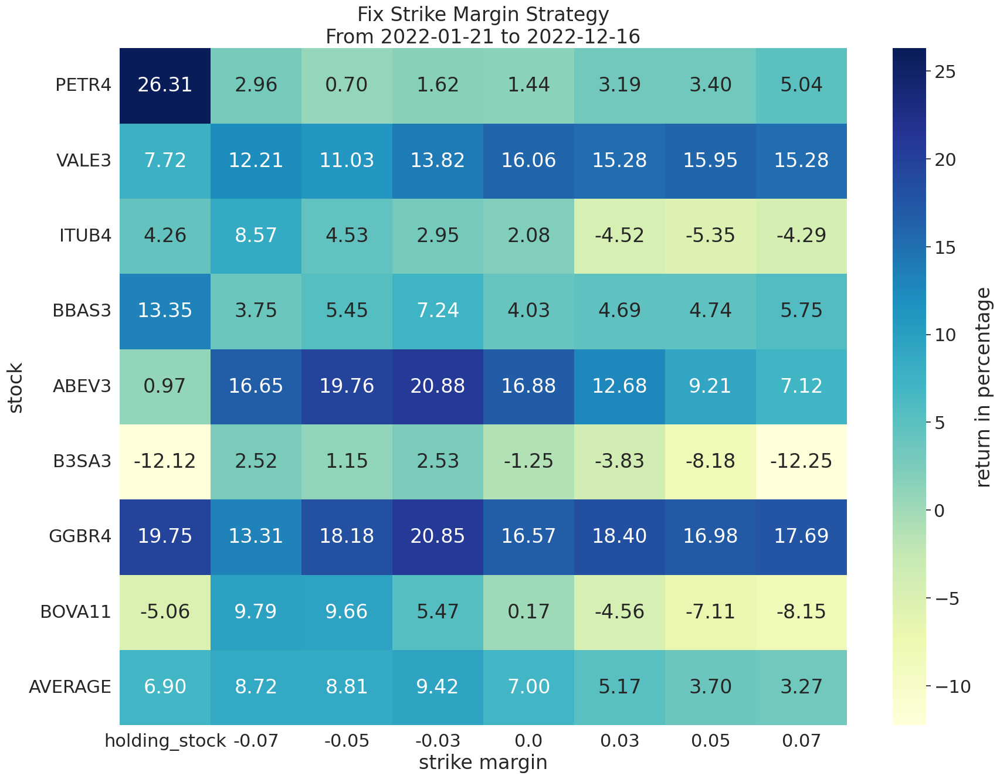

In [ ]:
# @title Simulation

fixed_strike_margins = {}
fixed_strike_results = {k: {} for k in LIQUID_TICKERS_LIST}
fixed_strike_cov_call_results_dict = get_initial_simulution_results_dict(
    start_date=simulation_dates.min(),
    end_date=simulation_dates.max(),
    tickers_list=LIQUID_TICKERS_LIST,
)

outer_progress_bar = tqdm(strike_margins, leave=False)
for strike_margin in outer_progress_bar:
    outer_progress_bar.set_description(f"Strike margin at {100*strike_margin:.2f}%")

    pick_call_strategy=partial(
        pick_call_strike_margin_strategy,
        volume_threshold=volume_threshold,
        strike_margin=strike_margin,
        strike_margin_tolerance=strike_margin_tolerance
    )

    inner_progress_bar = tqdm(LIQUID_TICKERS_LIST, leave=False)
    for ticker in inner_progress_bar:
        inner_progress_bar.set_description(ticker)

        results = simulate_covered_call(
            stock_df=stock_features_df_map[ticker],
            call_df=call_features_df_map[ticker],
            initial_amount=initial_amount,
            dates=simulation_dates,
            pick_call_strategy=pick_call_strategy
        )
        fixed_strike_cov_call_results_dict[ticker][strike_margin] = results.total_return
        fixed_strike_results[ticker][strike_margin] = results

##### Plot the results #####
plot_heatmap_results(
    cov_call_results_dict=fixed_strike_cov_call_results_dict,
    title="Fix Strike Margin Strategy",
    x_label="strike margin",
)

#### Covered Call with Fixed Volatility Margins

In [ ]:
# @title Functions
def pick_call_closest_volatility_margin_strategy(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    volatility_margin: float,
    last_n_working_days: int,
    strike_margin_threshold: float,
    enable_log: bool,
) -> pd.Series:

    stock = get_stock_features(stock_df=stock_df, date=current_date)

    # Filter call options traded at the current data and expire the next date
    filtered_call_df = call_df[
        (call_df[DATE_FEATURE] == current_date)
        & (call_df[STRIKE_DATE_FEATURE] == expiration_date)
        & (call_df[STRIKE_MARGIN_FEATURE] >= -strike_margin_threshold)
        & (call_df[STRIKE_MARGIN_FEATURE] <= strike_margin_threshold)
    ]
    if(filtered_call_df.shape[0] == 0):
        raise NoCompatibleCallOptionException(f"No option found at: {current_date} that expires at: {expiration_date}")

    call_volatility_margin_distances = (
        (filtered_call_df[IMPLIED_VOLATILITY_FEATURE]/stock[LAST_180_DAYS_HISTORICAL_VOLATILITY_FEATURE])
        - (1 + volatility_margin)
    ).abs()

    call_df = call_df.filter(items = call_volatility_margin_distances.index, axis=0)
    min_distance_idx = call_volatility_margin_distances.idxmin()

    return call_df.loc[min_distance_idx]

def pick_call_volatility_margin_strategy(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    volatility_margin: float,
    last_n_working_days: int,
    strike_margin_threshold: float,
    tolerance: float,
    enable_log: bool = False
) -> pd.Series:
    """
    Pick the call option in `call_df` that has implied volatility higher than the historical one
    by approximately `volatility_margin`%.
    We only consider call options that have volatility margin inside the range
    [volatility_margin - tolerance, volatility_margin + tolerance]. If more than one call is found,
    we take the one with highest premium.
    """
    stock = get_stock_features(stock_df=stock_df, date=current_date)

    # Filter call options traded at the current data and expire the next date
    filtered_call_df = call_df[
        (call_df[DATE_FEATURE] == current_date)
        & (call_df[STRIKE_DATE_FEATURE] == expiration_date)
        & (call_df[STRIKE_MARGIN_FEATURE] > strike_margin_threshold)
    ]
    if(filtered_call_df.shape[0] == 0):
        raise NoCompatibleCallOptionException(f"No option found at: {current_date} that expires at: {expiration_date}")


    call_volatility_margin_distances = (
        (filtered_call_df[IMPLIED_VOLATILITY_FEATURE]/stock[LAST_180_DAYS_HISTORICAL_VOLATILITY_FEATURE])
        - (1 + volatility_margin)
    ).abs()
    # Remove call options that have volatility margin too far from the target
    call_volatility_margin_distances = call_volatility_margin_distances[call_volatility_margin_distances < tolerance]

    if(call_volatility_margin_distances.size == 0):
      raise NoCompatibleCallOptionException(f"No call option found for the volatility margin: {volatility_margin}")

    call_df_ = call_df.filter(items = call_volatility_margin_distances.index, axis=0)
    max_premium_idx = call_df_[PREMIUM_FEATURE].idxmax()

    return call_df_.loc[max_premium_idx]


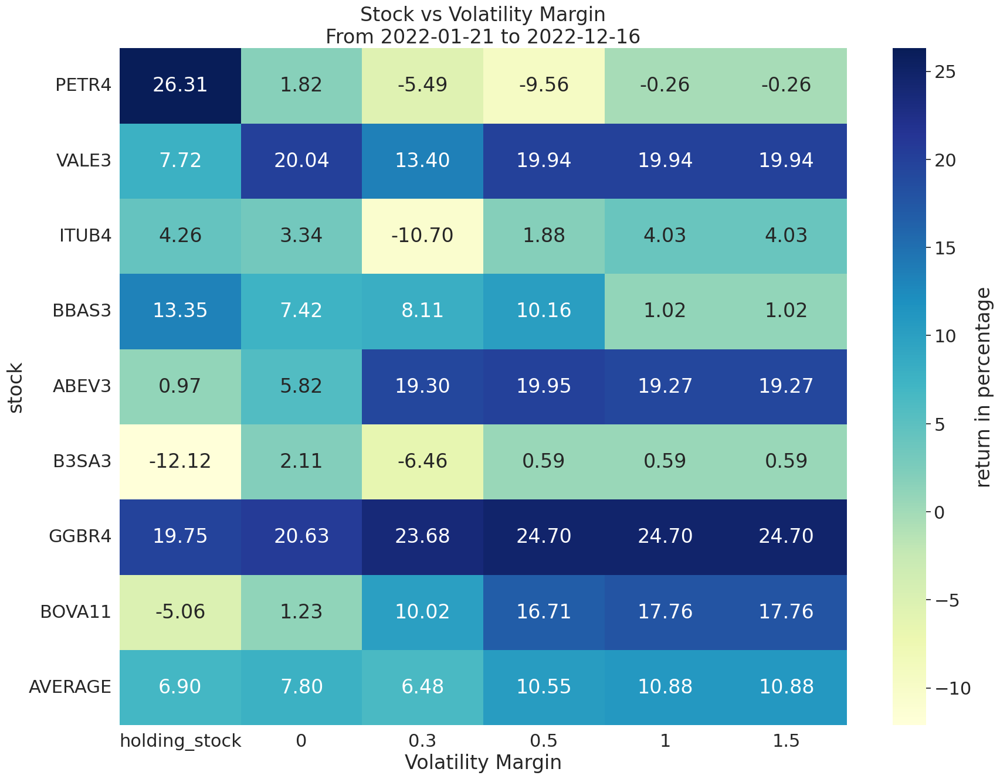

In [ ]:
# @title Simulation

strike_margin_threshold = 0.1
volatility_margins = [0, 0.3, 0.5, 1, 1.5]
print(f"From: {simulation_dates.min()} to {simulation_dates.max()}\n")

fixed_vol_results = {k: {} for k in LIQUID_TICKERS_LIST}
fixed_vol_margin_cov_call_results_dict = get_initial_simulution_results_dict(
    start_date=simulation_dates.min(),
    end_date=simulation_dates.max(),
    tickers_list=LIQUID_TICKERS_LIST,
)

outer_progress_bar = tqdm(volatility_margins, leave=False)
for vol_margin in outer_progress_bar:
    outer_progress_bar.set_description(f"Vol margin at {100*vol_margin:.2f}%")

    pick_call_vol_strategy = partial(
        pick_call_closest_volatility_margin_strategy,
        volatility_margin=vol_margin,
        last_n_working_days=last_n_working_days,
        strike_margin_threshold=strike_margin_threshold,
    )

    inner_progress_bar = tqdm(LIQUID_TICKERS_LIST, leave=False)
    for ticker in inner_progress_bar:
        inner_progress_bar.set_description(ticker)

        results = simulate_covered_call(
            stock_df=stock_features_df_map[ticker],
            call_df=call_features_df_map[ticker],
            initial_amount=initial_amount,
            dates=simulation_dates,
            pick_call_strategy=pick_call_vol_strategy
        )
        fixed_vol_margin_cov_call_results_dict[ticker][vol_margin] = results.total_return
        fixed_vol_results[ticker][vol_margin] = results


##### Plot the results #####
plot_heatmap_results(
    cov_call_results_dict=fixed_vol_margin_cov_call_results_dict,
    title="Stock vs Volatility Margin",
    x_label="Volatility Margin",
)

#### Covered Call with Lognormal Distribution

In [ ]:
# @title Functions

def strike_probability(
    stock_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    strike_margin: float,
    n_past_days: int,
) -> float:
    """
    Probability that the current stock price will be higher than the strike price
    at the expiration date
    """

    prices = stock_df[
        (stock_df[DATE_FEATURE] < current_date)
        & (stock_df[DATE_FEATURE] >= (current_date - np.timedelta64(n_past_days, "D")))
    ][STOCK_PRICE_FEATURE]

    days_to_expire = int(252*((expiration_date - current_date)/np.timedelta64(1, 'D'))/365)
    log_returns = np.log(prices/prices.shift(days_to_expire))
    log_std = log_returns.std()
    log_mean = log_returns.mean()

    return norm.cdf(
        - ( np.log(1+strike_margin) - log_mean ) / log_std
    )

def pick_lognormal_strike_margin_(
    stock_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    strike_margins: List[float],
    strike_proba_tolerance: float,
    n_past_days: int,
) -> float:

    best_strike_margin = max(strike_margins)
    for strike_margin in strike_margins:
        sp = strike_probability(
            stock_df=stock_df,
            current_date=current_date,
            expiration_date=expiration_date,
            strike_margin=strike_margin,
            n_past_days=n_past_days,
        )
        if sp < strike_proba_tolerance and strike_margin < best_strike_margin:
            best_strike_margin = strike_margin

    return best_strike_margin

def pick_lognormal_strike_margin(
    stock_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    strike_probability: float,
    n_past_days: int,
) -> float:

    prices = stock_df[
        (stock_df[DATE_FEATURE] < current_date)
        & (stock_df[DATE_FEATURE] >= (current_date - np.timedelta64(n_past_days, "D")))
    ][STOCK_PRICE_FEATURE]

    days_to_expire = int(252*((expiration_date - current_date)/np.timedelta64(1, 'D'))/365)
    log_returns = np.log(prices/prices.shift(days_to_expire))
    log_std = log_returns.std()
    log_mean = log_returns.mean()

    return np.exp((norm.ppf(1 - strike_probability) + log_mean) * log_std) - 1

def pick_call_lognormal_strategy(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    enable_log: bool,

    strike_margins: List[float],
    strike_proba_tolerance: float,
    n_past_days: int,
    volume_threshold: int,
    strike_margin_tolerance: float,
) -> pd.Series:

    strike_margin = pick_lognormal_strike_margin(
        stock_df=stock_df,
        current_date=current_date,
        expiration_date=expiration_date,
        strike_probability=strike_proba_tolerance,
        n_past_days=n_past_days,
    )

    return pick_call_strike_margin_strategy(
        stock_df=stock_df,
        call_df=call_df,
        current_date=current_date,
        expiration_date=expiration_date,
        enable_log=enable_log,
        volume_threshold=volume_threshold,
        strike_margin=strike_margin,
        strike_margin_tolerance=strike_margin_tolerance
    )

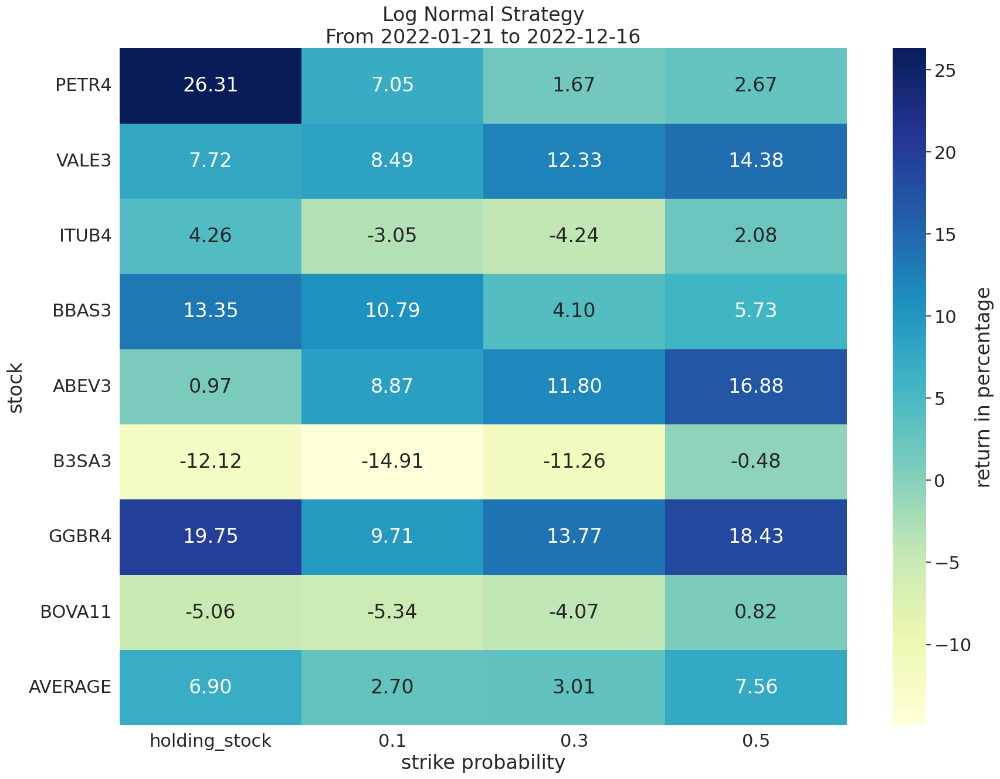

In [ ]:
 # @title Simulation

strike_proba_tolerances = [0.1, 0.3, 0.5]
n_past_days = 90
lognormal_results = {k: {} for k in strike_proba_tolerances}
lognormal_cov_call_results_dict = get_initial_simulution_results_dict(
    start_date=simulation_dates.min(),
    end_date=simulation_dates.max(),
    tickers_list=LIQUID_TICKERS_LIST
)

for strike_proba_tolerance in strike_proba_tolerances:
  progress_bar = tqdm(LIQUID_TICKERS_LIST, leave=False)
  for ticker in progress_bar:
      progress_bar.set_description(ticker)

      pick_call_strategy = partial(
          pick_call_lognormal_strategy,
          strike_margins=strike_margins,
          strike_proba_tolerance=strike_proba_tolerance,
          n_past_days=n_past_days,
          volume_threshold=volume_threshold,
          strike_margin_tolerance=strike_margin_tolerance,
      )

      results = simulate_covered_call(
          stock_df=stock_features_df_map[ticker],
          call_df=call_features_df_map[ticker],
          initial_amount=initial_amount,
          dates=simulation_dates,
          pick_call_strategy=pick_call_strategy
      )
      lognormal_cov_call_results_dict[ticker][str(strike_proba_tolerance)] = results.total_return
      lognormal_results[strike_proba_tolerance][ticker] = results

##### Plot the results #####
plot_heatmap_results(
    cov_call_results_dict=lognormal_cov_call_results_dict,
    title="Log Normal Strategy",
    x_label="strike probability",
)

#### Custom Covered Call

In [40]:
# @title Functions

def pick_call_sma_strategy(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    enable_log: bool,

    volume_threshold: int,
) -> pd.Series:

    stock_features = get_stock_features(stock_df=stock_df, date=current_date)
    strike_margin = 1 - stock_features[STOCK_PRICE__MOVING_AVERAGE__RATIO_FEATURE]
    if strike_margin > 0: raise NoCompatibleCallOptionException(
            f"No option found at: {current_date} that expires at: {expiration_date}"
        )
    strike_margin = 0.0

    target_strike_price = stock_features[STOCK_PRICE_FEATURE] * (1+strike_margin)
    if enable_log: logging.debug(f"Stock price: {stock_features[STOCK_PRICE_FEATURE]} | Strike price: {target_strike_price} | Strike margin: {strike_margin}")

    # Filter call options traded at the current data and expire the next date
    # that have enough negotiations
    filtered_call_df = call_df[
        # Traded at the current date
        (call_df[DATE_FEATURE] == current_date)
        # Expire at the right expiration date
        & (call_df[STRIKE_DATE_FEATURE] == expiration_date)
        # Have enough negotiations at the current date
        & (call_df[VOLUME_TRADED_FEATURE] >= volume_threshold)
    ]
    if(filtered_call_df.shape[0] == 0):
        raise NoCompatibleCallOptionException(
            f"No option found at: {current_date} that expires at: {expiration_date}"
        )

    distance_to_target_price_key = "distance_to_target_price"
    filtered_call_df[distance_to_target_price_key] = filtered_call_df.apply(
        lambda call_option: abs(call_option[STRIKE_PRICE_FEATURE] - target_strike_price),
        axis=1
    )

    # Pick the call with closest strike price
    return filtered_call_df.loc[filtered_call_df[distance_to_target_price_key].idxmin()]

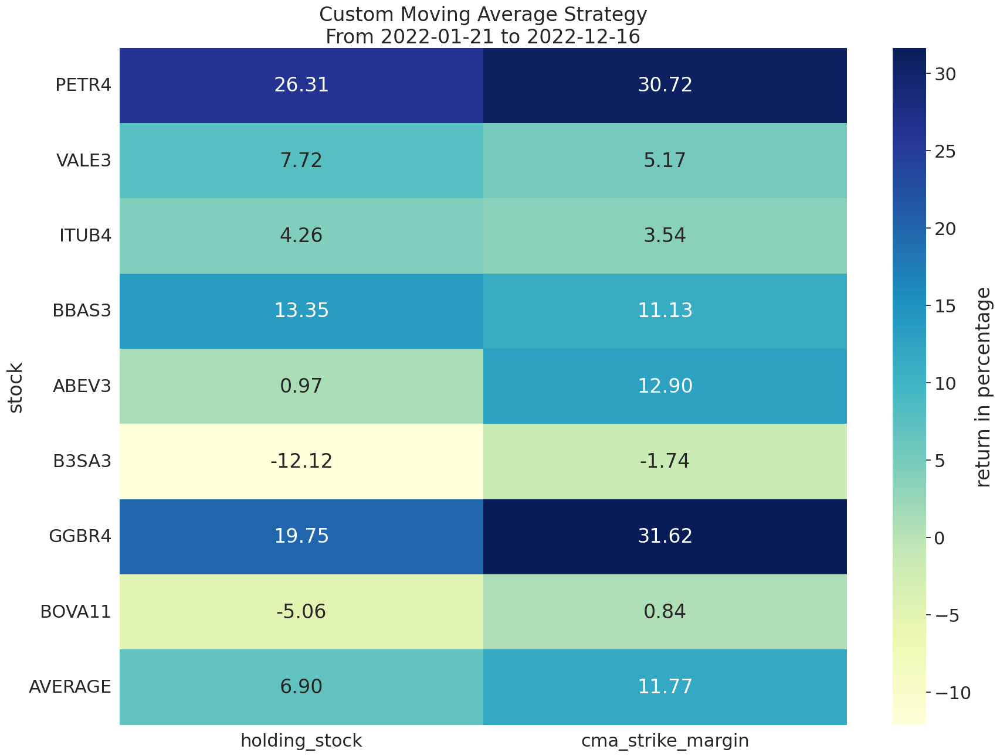

In [41]:
# @title Simulation

sma_strike_margins = {}
sma_strike_results = {}
sma_cov_call_results_dict = get_initial_simulution_results_dict(
    start_date=simulation_dates.min(),
    end_date=simulation_dates.max(),
    tickers_list=LIQUID_TICKERS_LIST,
)

pick_call_strategy=partial(
    pick_call_sma_strategy,
    volume_threshold=volume_threshold,
)

inner_progress_bar = tqdm(LIQUID_TICKERS_LIST, leave=False)
for ticker in inner_progress_bar:
    inner_progress_bar.set_description(ticker)

    results = simulate_covered_call(
        stock_df=stock_features_df_map[ticker],
        call_df=call_features_df_map[ticker],
        initial_amount=initial_amount,
        dates=simulation_dates,
        pick_call_strategy=pick_call_strategy,
        enable_log=False
    )
    sma_cov_call_results_dict[ticker]["cma_strike_margin"] = results.total_return
    sma_strike_results[ticker] = results

##### Plot the results #####
plot_heatmap_results(
    cov_call_results_dict=sma_cov_call_results_dict,
    title="Custom Moving Average Strategy",
    x_label="",
)

#### Machine Learning

In [ ]:
# @title Shared

##### Constants #####
STOCK_NEXT_30_DAYS_RETURN_CLASS = "stock_next_30_days_return_class"
ranges = [-0.03, 0.03]

##### Functions #####

def discretize(f: float, ranges: List[float]) -> int:

    global_ranges = [-np.inf, *sorted(ranges), np.inf]
    c = len(ranges)
    for i in range(len(ranges)):
        if f > global_ranges[i] and f <= global_ranges[i+1]:
            c = i

    return c

def build_stock_features_df(
    stock_df: pd.DataFrame,
    start_date: datetime,
    end_date: datetime,
    ranges: List[float]
) -> pd.DataFrame:

    filtered_stock_df = stock_df[
        (stock_df[DATE_FEATURE] >= start_date)
        & (stock_df[DATE_FEATURE] <= end_date)
    ]
    filtered_stock_df[STOCK_NEXT_30_DAYS_RETURN_CLASS] = filtered_stock_df.apply(
        lambda stock_features: discretize(
            f=stock_features[NEXT_MONTH_BUY_AND_HOLD_RETURN_TARGET],
            ranges=ranges
        ),
        axis=1
    )

    return filtered_stock_df

def pick_call_adaptative_strike_strategy(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    enable_log: bool,

    pipeline: Pipeline,
    features: List[str],
    ranges: List[float],
    volume_threshold: int,
    strike_margin_tolerance: float,
    max_range_strike_margin: float,
) -> pd.Series:

    stock_features = stock_df[
        stock_df[DATE_FEATURE] == current_date
    ][features].iloc[0]

    range_class = int(pipeline.predict([stock_features])[0])
    if enable_log: logging.debug(f"Predicted class: {range_class}")
    # strike_margin = ranges[range_class] if range_class < len(ranges) else ranges[-1]

    # If the model predicts a great rise of the stock price, we sell with the default max margin
    strike_margin = ranges[range_class] if range_class < len(ranges) else max_range_strike_margin

    # If the model predicts a great rise of the stock price, we don't sell any call
    # strike_margin = ranges[range_class] if range_class < len(ranges) else np.inf

    return pick_call_strike_margin_strategy(
        stock_df=stock_df,
        call_df=call_df,
        current_date=current_date,
        expiration_date=expiration_date,
        enable_log=enable_log,
        volume_threshold=volume_threshold,
        strike_margin=strike_margin,
        strike_margin_tolerance=strike_margin_tolerance
    )

##### Variables #####

features = [
    STOCK_PRICE_FEATURE,
    LAST_180_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    STOCK_PRICE__MOVING_AVERAGE__RATIO_FEATURE,
    LAST_30_DAYS_BUY_AND_HOLD_RETURN_FEATURE,
    LAST_60_DAYS_BUY_AND_HOLD_RETURN_FEATURE,
    LAST_90_DAYS_BUY_AND_HOLD_RETURN_FEATURE,

    # STOCK_PRICE__EXPONENTIAL_MOVING_AVERAGE__RATIO_FEATURE,
    # LAST_30_DAYS_RSI,
    # LAST_90_DAYS_STOCHASTIC,
    # LAST_30_DAYS_AVERAGE_VOLUME_TRADED_FEATURE,
    # LAST_30_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    # LAST_60_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    # LAST_90_DAYS_HISTORICAL_VOLATILITY_FEATURE,
]
target = [
    STOCK_NEXT_30_DAYS_RETURN_CLASS
]

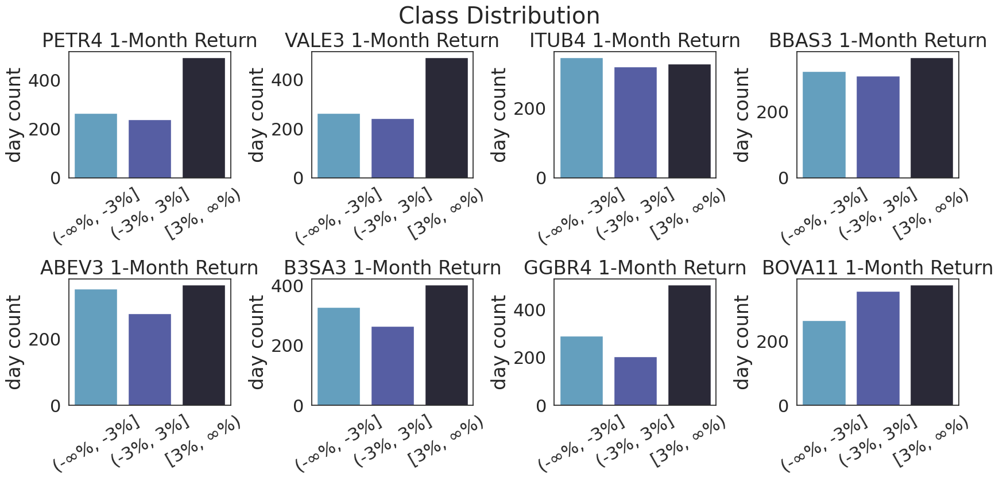

In [ ]:
# @title Build Features
stock_multi_class_features_df_map = {}
for ticker in TICKERS_LIST:
    stock_multi_class_features_df_map[ticker] = build_stock_features_df(
        stock_df=stock_features_df_map[ticker],
        start_date=datetime(year=2019, month=1, day=1),
        end_date=datetime(year=2022, month=12, day=31),
        ranges=ranges
    )

fig = plt.figure(figsize=(20, 8))
fig.suptitle("Class Distribution")
plt.subplots_adjust(hspace=0.8, wspace=0.5)
plt_idx = 1
for ticker in LIQUID_TICKERS_LIST:
    plt.subplot(2, 4, plt_idx)
    plt.title(f"{ticker} 1-Month Return")
    data = stock_multi_class_features_df_map[ticker][STOCK_NEXT_30_DAYS_RETURN_CLASS]
    sns.barplot(
        x=["(-∞%, -3%]", "(-3%, 3%]", "[3%, ∞%)"],
        y=[
            sum(stock_multi_class_features_df_map[ticker][STOCK_NEXT_30_DAYS_RETURN_CLASS] == 0),
            sum(stock_multi_class_features_df_map[ticker][STOCK_NEXT_30_DAYS_RETURN_CLASS] == 1),
            sum(stock_multi_class_features_df_map[ticker][STOCK_NEXT_30_DAYS_RETURN_CLASS] == 2)
        ]
    )
    plt.ylabel("day count")
    plt.xticks(rotation = 30)
    plt_idx += 1

##### Logistic Regression

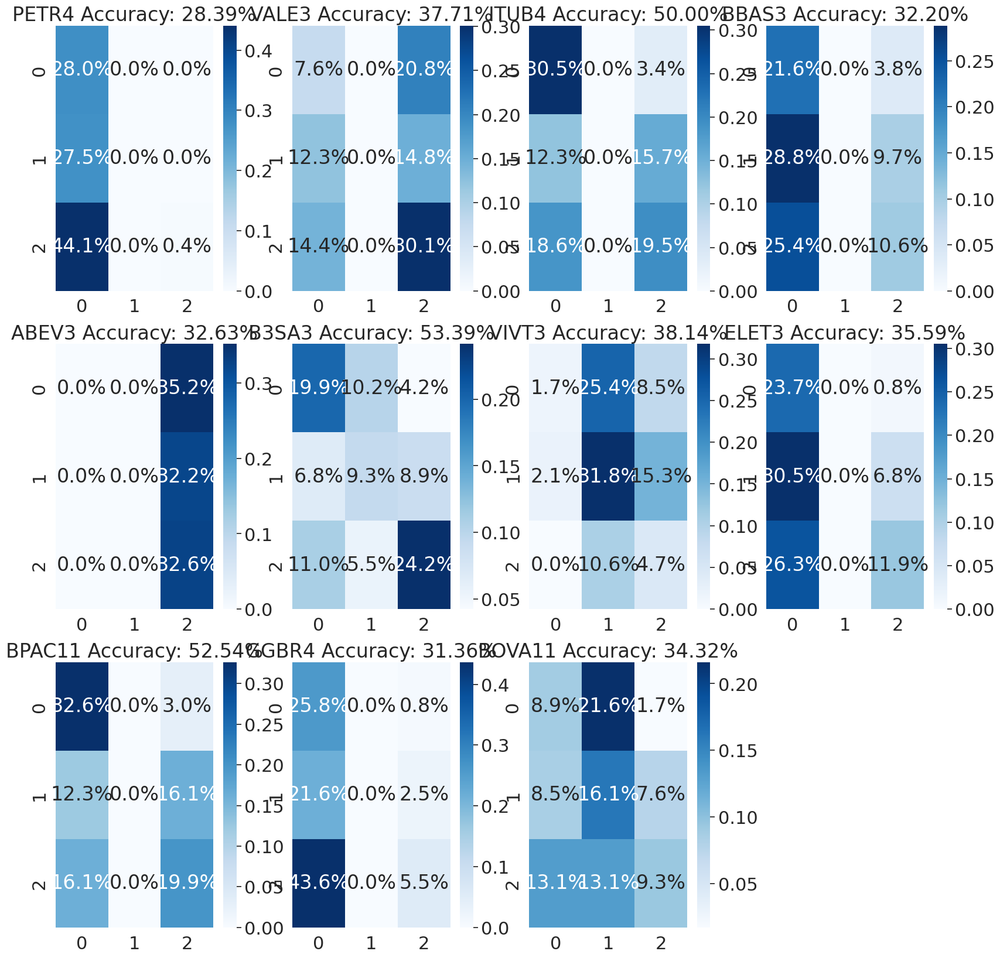

In [ ]:
# @title Model

multi_log_reg_models = {}
plt.figure(figsize=(20, 20))
plt_idx = 1

for ticker in TICKERS_LIST:

    ml_df = stock_multi_class_features_df_map[ticker]
    test_size = 1 - (
        ml_df[ml_df[DATE_FEATURE] < simulation_dates[0]].size/ml_df.size
    )
    X_train, X_test, y_train, y_test = train_test_split(
        ml_df[features],
        ml_df[target],
        test_size=test_size,
        shuffle=False
    )

    ### Build and train the model ###
    pipeline = Pipeline([
        ("scale", StandardScaler()),
        ("logistic_regression", LogisticRegression(random_state=42))
    ])
    pipeline.fit(X_train, y_train)
    multi_log_reg_models[ticker] = pipeline

    ### Display the results ###
    y_pred = pipeline.predict(X_test)
    cf_matrix = confusion_matrix(y_test, y_pred)
    plt.subplot(3, 4, plt_idx)
    plt_idx += 1
    sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.1%', cmap='Blues')
    # sns.heatmap(cf_matrix, annot=True,  cmap='Blues')
    plt.title(f"{ticker} Accuracy: {100*accuracy_score(y_test, y_pred):.2f}%")

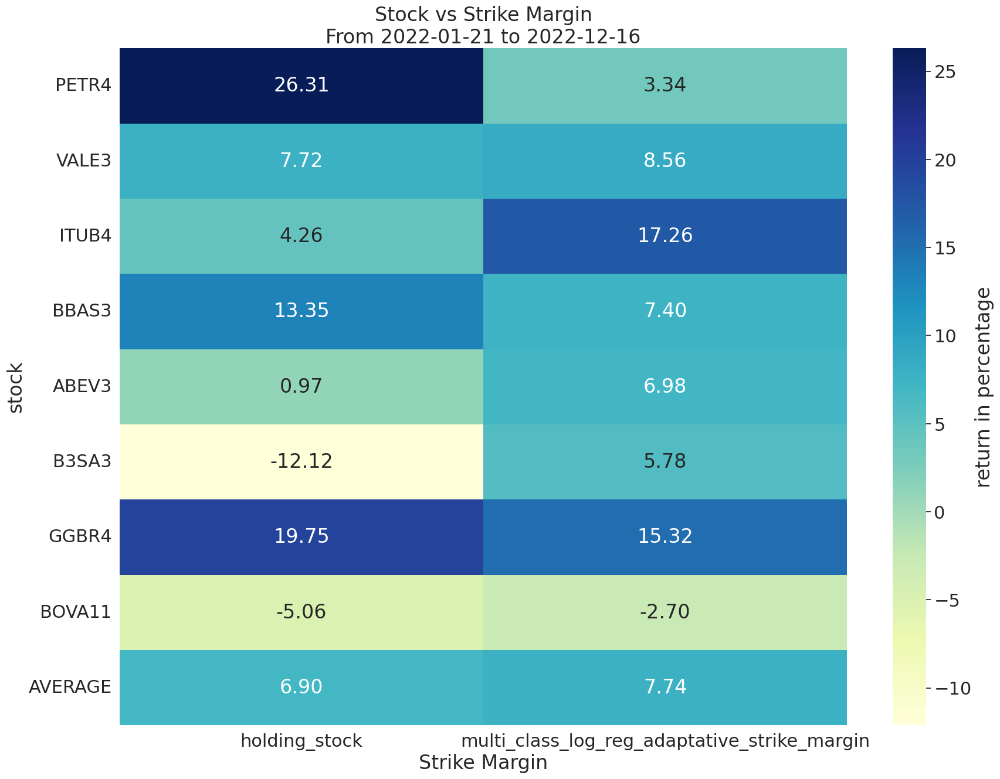

In [ ]:
 # @title Simulation

print(f"From: {simulation_dates.min()} to {simulation_dates.max()} / {len(simulation_dates)}\n")

multi_log_reg_results = {}
multi_log_reg_cov_call_results_dict = get_initial_simulution_results_dict(
    start_date=simulation_dates.min(),
    end_date=simulation_dates.max(),
    tickers_list=LIQUID_TICKERS_LIST,
)
max_range_strike_margin = 0.08

progress_bar = tqdm(LIQUID_TICKERS_LIST, leave=False)
for ticker in progress_bar:
    progress_bar.set_description(ticker)

    pick_call_strategy = partial(
        pick_call_adaptative_strike_strategy,
        volume_threshold=volume_threshold,
        strike_margin_tolerance=strike_margin_tolerance,
        features=features,
        pipeline=multi_log_reg_models[ticker],
        max_range_strike_margin=max_range_strike_margin,
        ranges=ranges
    )

    results = simulate_covered_call(
        stock_df=stock_multi_class_features_df_map[ticker],
        call_df=call_features_df_map[ticker],
        initial_amount=initial_amount,
        dates=simulation_dates,
        pick_call_strategy=pick_call_strategy
    )
    multi_log_reg_cov_call_results_dict[ticker]["multi_class_log_reg_adaptative_strike_margin"] = results.total_return
    multi_log_reg_results[ticker] = results

##### Plot the results #####
plot_heatmap_results(
    cov_call_results_dict=multi_log_reg_cov_call_results_dict,
    title="Stock vs Strike Margin",
    x_label="Strike Margin",
)

##### Random Forest

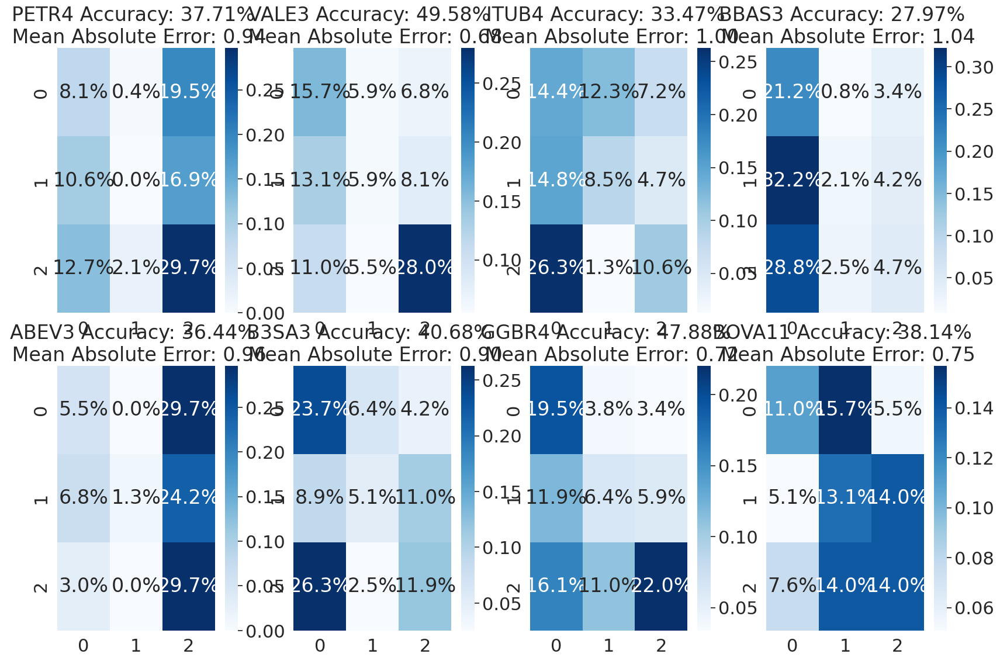

In [ ]:
# @title Model

multi_rand_forest_strike_models = {}
multi_rand_forest_accuracies = {}
plt.figure(figsize=(20, 20))
plt_idx = 1

for ticker in LIQUID_TICKERS_LIST:

    ml_df = stock_multi_class_features_df_map[ticker]
    test_size = 1 - (
        ml_df[ml_df[DATE_FEATURE] < simulation_dates[0]].size/ml_df.size
    )
    X_train, X_test, y_train, y_test = train_test_split(
        ml_df[features],
        ml_df[target],
        test_size=test_size,
        shuffle=False
    )

    ### Build and train the model ###
    pipeline = Pipeline([
        ("scale", StandardScaler()),
        ("rand_forest", RandomForestClassifier(n_estimators=100, random_state=42, max_depth=None))
    ])
    pipeline.fit(X_train, y_train)
    multi_rand_forest_strike_models[ticker] = pipeline

    ### Display the results ###
    y_pred = pipeline.predict(X_test)
    cf_matrix = confusion_matrix(y_test, y_pred)
    score = accuracy_score(y_test, y_pred)
    multi_rand_forest_accuracies[ticker] = score
    plt.subplot(3, 4, plt_idx)
    plt_idx += 1
    sns.heatmap(cf_matrix/np.sum(cf_matrix), fmt='.1%', annot=True, cmap='Blues')
    plt.title(f"{ticker} Accuracy: {100*score:.2f}% \n Mean Absolute Error: {mean_absolute_error(y_test, y_pred):.2f}")

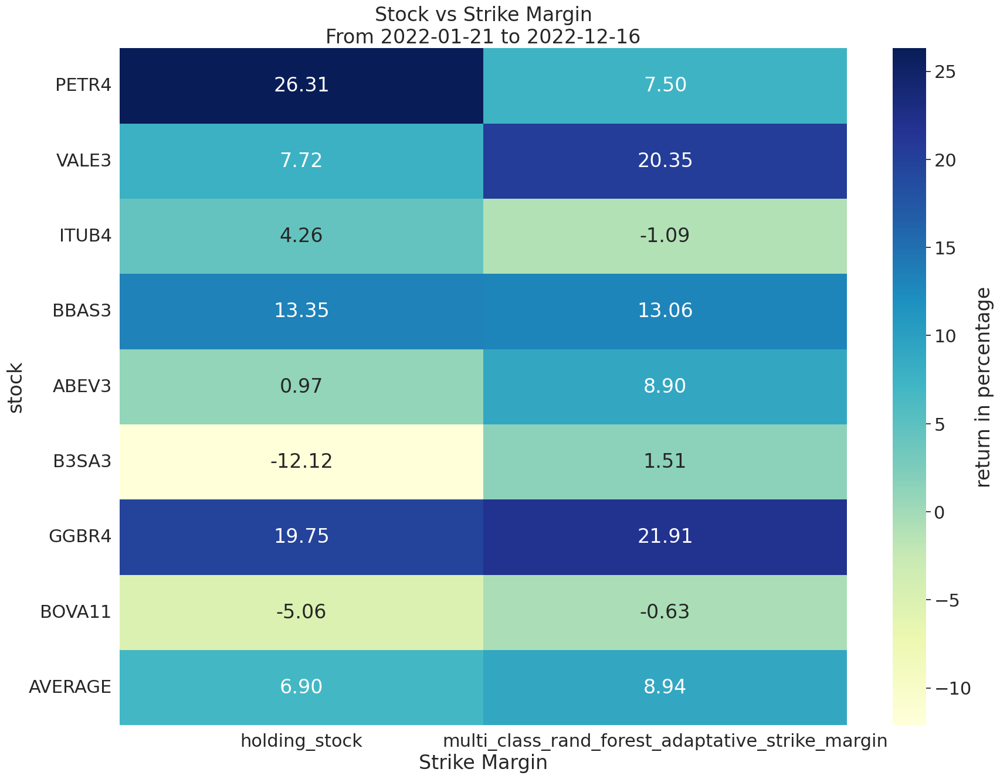

In [ ]:
 # @title Simulation

multi_rand_forest_results = {}
multi_rand_forest_cov_call_results_dict = get_initial_simulution_results_dict(
    start_date=simulation_dates.min(),
    end_date=simulation_dates.max(),
    tickers_list=LIQUID_TICKERS_LIST,
)
max_range_strike_margin = 0.07

progress_bar = tqdm(LIQUID_TICKERS_LIST, leave=False)
for ticker in progress_bar:
    progress_bar.set_description(ticker)

    pick_call_strategy = partial(
        pick_call_adaptative_strike_strategy,
        volume_threshold=0,
        strike_margin_tolerance=strike_margin_tolerance,
        features=features,
        pipeline=multi_rand_forest_strike_models[ticker],
        ranges=ranges,
        max_range_strike_margin=max_range_strike_margin,
    )

    results = simulate_covered_call(
        stock_df=stock_multi_class_features_df_map[ticker],
        call_df=call_features_df_map[ticker],
        initial_amount=initial_amount,
        dates=simulation_dates,
        enable_log=False,
        pick_call_strategy=pick_call_strategy
    )
    multi_rand_forest_cov_call_results_dict[ticker]["multi_class_rand_forest_adaptative_strike_margin"] = results.total_return
    multi_rand_forest_results[ticker] = results

##### Plot the results #####
plot_heatmap_results(
    cov_call_results_dict=multi_rand_forest_cov_call_results_dict,
    title="Stock vs Strike Margin",
    x_label="Strike Margin",
)

##### Random

In [ ]:
# @title Functions

def pick_call_random_strategy(
    stock_df: pd.DataFrame,
    call_df: pd.DataFrame,
    current_date: datetime,
    expiration_date: datetime,
    enable_log: bool,

    ranges: List[float],
    volume_threshold: int,
    strike_margin_tolerance: float,
    max_range_strike_margin: float,
) -> pd.Series:

    stock_features = stock_df[
        stock_df[DATE_FEATURE] == current_date
    ][features].iloc[0]

    range_class = random.randint(0, len(ranges) - 1)
    if enable_log: logging.debug(f"Predicted class: {range_class}")

    # If the model predicts a great rise of the stock price, we sell with the default max margin
    strike_margin = ranges[range_class] if range_class < len(ranges) else max_range_strike_margin

    return pick_call_strike_margin_strategy(
        stock_df=stock_df,
        call_df=call_df,
        current_date=current_date,
        expiration_date=expiration_date,
        enable_log=enable_log,
        volume_threshold=volume_threshold,
        strike_margin=strike_margin,
        strike_margin_tolerance=strike_margin_tolerance
    )

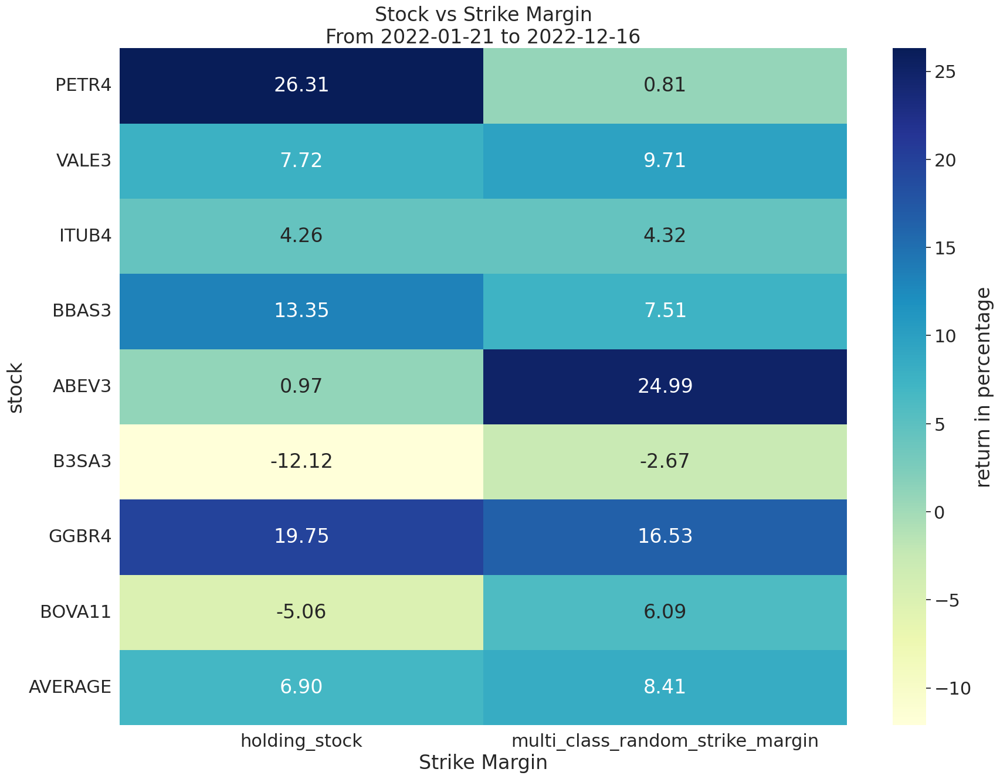

In [ ]:
 # @title Simulation

multi_class_random_results = {}
multi_class_random_cov_call_results_dict = get_initial_simulution_results_dict(
    start_date=simulation_dates.min(),
    end_date=simulation_dates.max(),
    tickers_list=LIQUID_TICKERS_LIST
)
max_range_strike_margin = 0.07
random.seed(54)

progress_bar = tqdm(LIQUID_TICKERS_LIST, leave=False)
for ticker in progress_bar:
    progress_bar.set_description(ticker)

    pick_call_strategy = partial(
        pick_call_random_strategy,
        volume_threshold=volume_threshold,
        strike_margin_tolerance=strike_margin_tolerance,
        ranges=ranges,
        max_range_strike_margin=max_range_strike_margin,
    )

    results = simulate_covered_call(
        stock_df=stock_multi_class_features_df_map[ticker],
        call_df=call_features_df_map[ticker],
        initial_amount=initial_amount,
        dates=simulation_dates,
        pick_call_strategy=pick_call_strategy
    )
    multi_class_random_cov_call_results_dict[ticker]["multi_class_random_strike_margin"] = results.total_return
    multi_class_random_results[ticker] = results

##### Plot the results #####
plot_heatmap_results(
    cov_call_results_dict=multi_class_random_cov_call_results_dict,
    title="Stock vs Strike Margin",
    x_label="Strike Margin",
)

##### Comparison

In [ ]:
results_dict = fixed_strike_cov_call_results_dict
for ticker in [*LIQUID_TICKERS_LIST, "AVERAGE"]:
    results_dict[ticker]["sma_strike_margin"] = sma_cov_call_results_dict[ticker]["sma_strike_margin"]
    # results_dict[ticker]["lognormal_strike_margin"] = lognormal_cov_call_results_dict[ticker]["lognormal_strike_margin"]
    # results_dict[ticker]["multi_class_log_reg_adaptative_strike_margin"] = multi_log_reg_cov_call_results_dict[ticker]["multi_class_log_reg_adaptative_strike_margin"]
    results_dict[ticker]["multi_class_rand_forest_adaptative_strike_margin"] = multi_rand_forest_cov_call_results_dict[ticker]["multi_class_rand_forest_adaptative_strike_margin"]
    # results_dict[ticker]["multi_class_reg_rand_forest_adaptative_strike_margin"] = multi_reg_rand_forest_cov_call_results_dict[ticker]["multi_class_reg_rand_forest_adaptative_strike_margin"]
    results_dict[ticker]["multi_class_random_strike_margin"] = multi_class_random_cov_call_results_dict[ticker]["multi_class_random_strike_margin"]

##### Plot the results #####
plot_heatmap_results(
    cov_call_results_dict=results_dict,
    title="Results",
    x_label="Strategies",
)

##### Sliding Windown Comparison

In [ ]:
# @title Functions

def slice_simulation_dates(simulation_dates: List[datetime], window_interval_months: int) -> List[List[datetime]]:

    _window_interval_months = window_interval_months + 1
    if _window_interval_months > len(simulation_dates): return []

    sliced_simulation_dates = []
    for i in range(0, 1 + len(simulation_dates) - _window_interval_months):
        sliced_simulation_dates.append(simulation_dates[i: i + _window_interval_months])

    return sliced_simulation_dates

In [ ]:
# @title Simulation

window_interval_months = 6
sliced_simulation_dates = [
    *slice_simulation_dates(simulation_dates=simulation_dates, window_interval_months=window_interval_months),
    simulation_dates
]
sliced_simulation_average_results = {}

progress_bar = tqdm(sliced_simulation_dates, leave=False)
for _simulation_dates in progress_bar:

    period_key = f"{_simulation_dates[0].astype('datetime64[D]')}_{_simulation_dates[-1].astype('datetime64[D]')}"
    logging.debug(f"########## {period_key} ##########")
    progress_bar.set_description(period_key)
    sliced_simulation_average_results[period_key] = {}

    ### Buy and Hold ###
    avg_return = 0
    for ticker in LIQUID_TICKERS_LIST:
        initial_price = get_stock_price(
            stock_df=stock_features_df_map[ticker],
            date=_simulation_dates[0]
        )
        final_price = get_stock_price(
            stock_df=stock_features_df_map[ticker],
            date=_simulation_dates[-1]
        )
        total_return = (final_price - initial_price)/initial_price
        avg_return += total_return/len(LIQUID_TICKERS_LIST)

    sliced_simulation_average_results[period_key][f"holding_stock"] = avg_return

    ### Fixed Covered Call ###
    logging.debug(f"########## Fixed Strike Margin Strategies ##########")
    for strike_margin in strike_margins:

        avg_return = 0
        for ticker in LIQUID_TICKERS_LIST:

            pick_call_strategy=partial(
                pick_call_strike_margin_strategy,
                volume_threshold=volume_threshold,
                strike_margin=strike_margin,
                strike_margin_tolerance=strike_margin_tolerance
            )
            results = simulate_covered_call(
                stock_df=stock_features_df_map[ticker],
                call_df=call_features_df_map[ticker],
                initial_amount=initial_amount,
                dates=_simulation_dates,
                pick_call_strategy=pick_call_strategy
            )
            logging.debug({"strike_margin": strike_margin, "ticker": ticker, "return": results.total_return, "number_of_strikes": results.strike_number})
            avg_return += results.total_return/len(LIQUID_TICKERS_LIST)

        sliced_simulation_average_results[period_key][f"fixed_cov_call_{strike_margin}"] = avg_return

    ### Fixed Covered Call ###
    logging.debug(f"########## SMA Strategies ##########")
    avg_return = 0
    for ticker in LIQUID_TICKERS_LIST:
        pick_call_strategy = partial(
            pick_call_sma_strategy,
            volume_threshold=volume_threshold,
        )
        results = simulate_covered_call(
            stock_df=stock_features_df_map[ticker],
            call_df=call_features_df_map[ticker],
            initial_amount=initial_amount,
            dates=_simulation_dates,
            pick_call_strategy=pick_call_strategy
        )
        logging.debug({"ticker": ticker, "return": results.total_return, "number_of_strikes": results.strike_number})
        avg_return += results.total_return/len(LIQUID_TICKERS_LIST)

    sliced_simulation_average_results[period_key][f"sma_cov_call"] = avg_return

    ### Lognormal Distribution Covered Call ###
    logging.debug(f"########## Lognormal Strategies ##########")
    avg_return = 0
    for ticker in LIQUID_TICKERS_LIST:
        pick_call_strategy = partial(
            pick_call_lognormal_strategy,
            strike_margins=strike_margins,
            strike_proba_tolerance=strike_proba_tolerance,
            n_past_days=n_past_days,
            volume_threshold=volume_threshold,
            strike_margin_tolerance=strike_margin_tolerance,
        )
        results = simulate_covered_call(
            stock_df=stock_features_df_map[ticker],
            call_df=call_features_df_map[ticker],
            initial_amount=initial_amount,
            dates=_simulation_dates,
            pick_call_strategy=pick_call_strategy
        )
        logging.debug({"ticker": ticker, "return": results.total_return, "number_of_strikes": results.strike_number})
        avg_return += results.total_return/len(LIQUID_TICKERS_LIST)

    sliced_simulation_average_results[period_key][f"lognormal_cov_call"] = avg_return

    ### Logistic Regression Covered Call ###
    logging.debug(f"########## Logistic Regression Strategies ##########")
    avg_return = 0
    for ticker in LIQUID_TICKERS_LIST:
        pick_call_strategy = partial(
            pick_call_adaptative_strike_strategy,
            volume_threshold=volume_threshold,
            strike_margin_tolerance=strike_margin_tolerance,
            features=features,
            pipeline=multi_log_reg_models[ticker],
            ranges=ranges
        )

        results = simulate_covered_call(
            stock_df=stock_multi_class_features_df_map[ticker],
            call_df=call_features_df_map[ticker],
            initial_amount=initial_amount,
            dates=_simulation_dates,
            pick_call_strategy=pick_call_strategy
        )
        logging.debug({"ticker": ticker, "return": results.total_return, "number_of_strikes": results.strike_number})
        avg_return += results.total_return/len(LIQUID_TICKERS_LIST)

    sliced_simulation_average_results[period_key][f"log_reg_cov_call"] = avg_return

    ### Multi Class Random Forest Classification Covered Call ###
    logging.debug(f"########## Multi Class Random Forest Classification Strategies ##########")
    avg_return = 0
    for ticker in LIQUID_TICKERS_LIST:
        pick_call_strategy = partial(
            pick_call_adaptative_strike_strategy,
            volume_threshold=volume_threshold,
            strike_margin_tolerance=strike_margin_tolerance,
            features=features,
            pipeline=multi_rand_forest_strike_models[ticker],
            ranges=ranges
        )

        results = simulate_covered_call(
            stock_df=stock_multi_class_features_df_map[ticker],
            call_df=call_features_df_map[ticker],
            initial_amount=initial_amount,
            dates=_simulation_dates,
            pick_call_strategy=pick_call_strategy
        )
        logging.debug({"ticker": ticker, "return": results.total_return, "number_of_strikes": results.strike_number})
        avg_return += results.total_return/len(LIQUID_TICKERS_LIST)

    sliced_simulation_average_results[period_key][f"rand_for_class_cov_call"] = avg_return

    ### Multi Class Random Forest Regression Covered Call ###
    logging.debug(f"########## Multi Class Random Forest Regression Strategies ##########")
    avg_return = 0
    for ticker in LIQUID_TICKERS_LIST:
        pick_call_strategy = partial(
            pick_call_adaptative_strike_strategy,
            volume_threshold=volume_threshold,
            strike_margin_tolerance=strike_margin_tolerance,
            features=features,
            pipeline=multi_reg_rand_forest_strike_models[ticker],
            ranges=ranges
        )

        results = simulate_covered_call(
            stock_df=stock_multi_class_features_df_map[ticker],
            call_df=call_features_df_map[ticker],
            initial_amount=initial_amount,
            dates=_simulation_dates,
            pick_call_strategy=pick_call_strategy
        )
        logging.debug({"ticker": ticker, "return": results.total_return, "number_of_strikes": results.strike_number})
        avg_return += results.total_return/len(LIQUID_TICKERS_LIST)

    sliced_simulation_average_results[period_key][f"rand_for_class_reg_cov_call"] = avg_return

# clear_output(wait=False)
plt.figure(figsize=(14, 10))

plt.title("Average Returns per Strategy in Different Time Ranges")
sns.heatmap(
    pd.DataFrame(sliced_simulation_average_results)*100,
    annot=True,
    fmt="g",
    cbar_kws={'label': 'Return in Percentage'},
    cmap="YlGnBu",
)
plt.ylabel("Strategy")
plt.xticks(rotation = 45)
_ = plt.xlabel("time range")

## 4. Additional Visualizations

In [ ]:
# @title The Impact of Dividends on PETR4

stock_df=petr4_stock_df_
call_df=petr4_call_df_
call_code="PETRH374"
start_date=datetime(year=2022, month=7, day=27)
ex_dividend_date=datetime(year=2022, month=8, day=12)

end_date = ex_dividend_date + (ex_dividend_date - start_date)

stock_filtered_df = stock_df[
    stock_df["data_pregao"].between(start_date, end_date)
]

plt.figure(figsize=(10,3))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")
# Plot the graph
_ = sns.lineplot(
    data=stock_filtered_df,
    x="data_pregao",
    y="preco_ultimo_negocio",
    label="Stock price",
    color="k"
)
plt.xlabel("date")
plt.ylabel("stock price")
plt.axvline(
    ex_dividend_date, 0, 40, linestyle='--',
    linewidth=0.9, color="black", label="Ex-dividend date"
) # type: ignore
plt.legend()
plt.xticks(rotation = 45)
# _ = plt.xticks(rotation="vertical")
_ = plt.title("PETR4. Impact of Dividends on Price")

In [ ]:
# @title B3 ITUB4

plt.figure(figsize=(10,5))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")
plt.title("ITUB4")
plt.xlabel("date")
plt.ylabel("price (R$)")
ax = sns.lineplot(
    data=itub4_stock_df_,
    x="data_pregao",
    y="preco_ultimo_negocio",
    # label="stock price",
    color="b"
)

In [ ]:
# @title ITUB4 Rectification

plt.figure(figsize=(10,5))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")
plt.title("ITUB4 Price Before and After Rectification")
plt.xlabel("date")
plt.ylabel("price (R$)")
_ = sns.lineplot(
    data=itub4_stock_df_, y="preco_ultimo_negocio", x="data_pregao",
    label="price", color='b'
)
_ = sns.lineplot(
    data=itub4_stock_df, y="preco_ultimo_negocio", x="data_pregao",
    label="rectified price", color='k'
)
_ = plt.xticks(rotation='vertical')

In [ ]:
# @title PETR4 Historical vs Implied Volatilities

plt.figure(figsize=(20,14))
plt.figure(figsize=(10,5))
sns.set(font_scale=1.5)
sns.set_style("white")
_ = sns.lineplot(
    y=petr4_annualized_hist_vols, x=dates[:-1],
    label="Annualized Historical Volatility", color="b"
)
_ = sns.lineplot(
    y=petr4_annualized_implied_vols, x=dates[:-1],
    label="Annualized Implied Volatility", color="k"
)
plt.title("PETR4 Annualized Volatility. Historical VS Implied")
plt.ylabel(f"annualized volatility")
_ = plt.xlabel("date")
_ = plt.xticks(rotation=45)

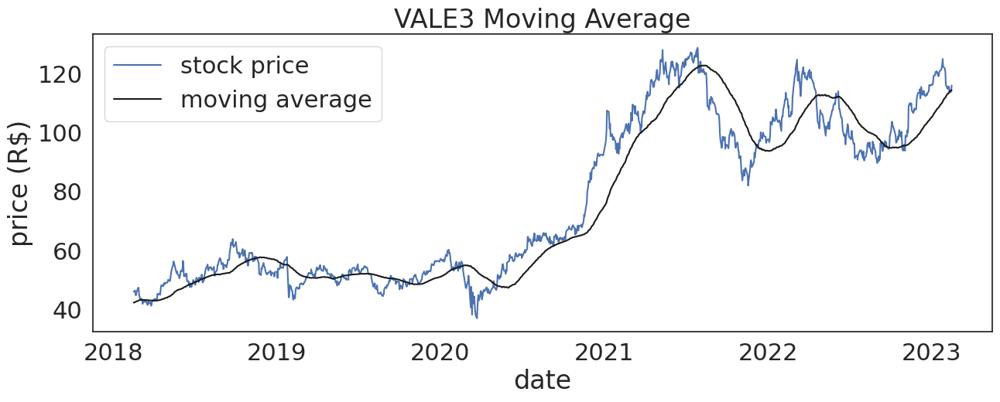

In [ ]:
# @title VALE3 Moving Average

plt.figure(figsize=(15,5))
plt.title("VALE3 Moving Average")
plt.xlabel("date")
plt.ylabel("price (R$)")
ax = sns.lineplot(
    data=stock_features_df_map[VALE3_TICKER],
    x=DATE_FEATURE,
    y=STOCK_PRICE_FEATURE,
    label="stock price",
    color="b"
)
ax = sns.lineplot(
    data=stock_features_df_map[VALE3_TICKER],
    x=DATE_FEATURE,
    y=LAST_100_DAYS_MOVING_AVERAGE_FEATURE,
    label="moving average",
    color="k"
)
_ = plt.legend()

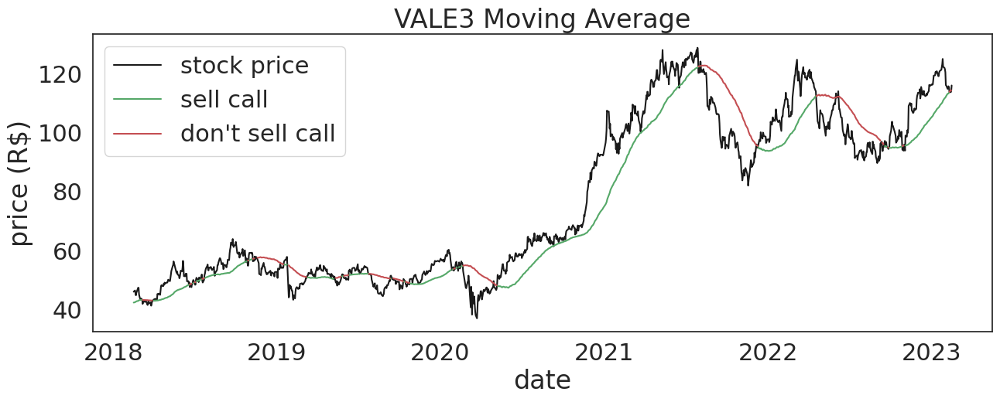

In [32]:
# @title VALE3 Moving Average

stock = stock_features_df_map[VALE3_TICKER]
price_above_avg_mask = stock.copy()
price_below_avg_mask = stock.copy()

price_above_avg_mask[stock[STOCK_PRICE_FEATURE] < stock[LAST_100_DAYS_MOVING_AVERAGE_FEATURE]] = np.nan
price_below_avg_mask[stock[STOCK_PRICE_FEATURE] >= stock[LAST_100_DAYS_MOVING_AVERAGE_FEATURE]] = np.nan

plt.figure(figsize=(15,5))
plt.title("VALE3 Moving Average")
plt.xlabel("date")
plt.ylabel("price (R$)")
ax = sns.lineplot(
    data=stock_features_df_map[VALE3_TICKER],
    x=DATE_FEATURE,
    y=STOCK_PRICE_FEATURE,
    label="stock price",
    color="k"
)
ax = plt.plot(
    stock[DATE_FEATURE],
    price_above_avg_mask[LAST_100_DAYS_MOVING_AVERAGE_FEATURE],
    label="sell call",
    color="g",
)
ax = plt.plot(
    stock[DATE_FEATURE],
    price_below_avg_mask[LAST_100_DAYS_MOVING_AVERAGE_FEATURE],
    label="don't sell call",
    color="r",
)
_ = plt.legend()

In [ ]:
# @title PETR4 RSI

plt.figure(figsize=(10,10))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")

plt.subplot(2, 1, 1)
plt.title("PETR4 RSI")
plt.xlabel("date")
plt.ylabel("price (R$)")
ax = sns.lineplot(
    data=stock_features_df_map[PETR4_TICKER],
    x=DATE_FEATURE,
    y=STOCK_PRICE_FEATURE,
    label="stock price",
    color="b"
)

plt.subplot(2, 1, 2)
plt.xlabel("date")
plt.ylabel("rsi")
ax = sns.lineplot(
    data=stock_features_df_map[PETR4_TICKER],
    x=DATE_FEATURE,
    y=LAST_30_DAYS_RSI,
    label="30 days rsi",
    color="b"
)
_ = ax.axline(xy1=(18000, 70), slope=.0, color="darkgray")
_ = ax.axline(xy1=(18000, 30), slope=.0, color="darkgray")
_ = plt.legend()

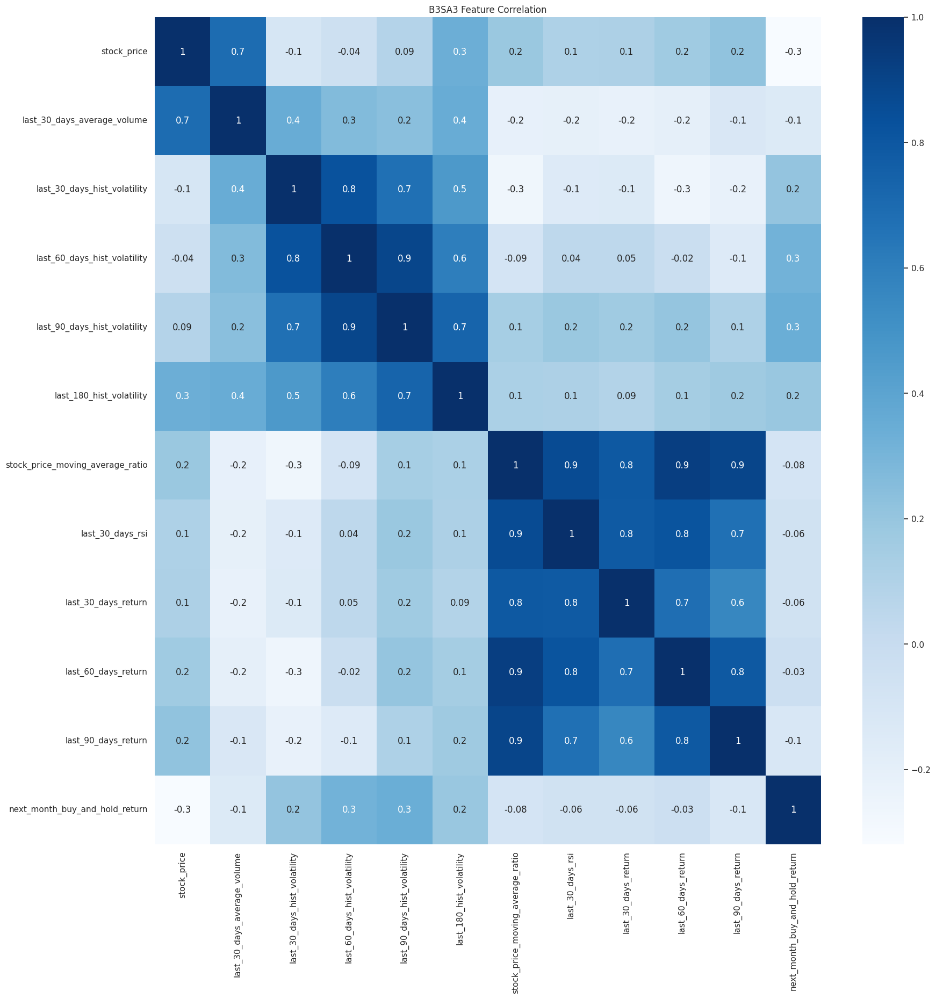

In [ ]:
# @title B3SA3 Correlation

features = [
    STOCK_PRICE_FEATURE,
    LAST_30_DAYS_AVERAGE_VOLUME_TRADED_FEATURE,
    LAST_30_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    LAST_60_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    LAST_90_DAYS_HISTORICAL_VOLATILITY_FEATURE,
    LAST_180_HISTORICAL_VOLATILITY_FEATURE,
    STOCK_PRICE__MOVING_AVERAGE__RATIO_FEATURE,
    LAST_30_DAYS_RSI,
    LAST_30_DAYS_BUY_AND_HOLD_RETURN_FEATURE,
    LAST_60_DAYS_BUY_AND_HOLD_RETURN_FEATURE,
    LAST_90_DAYS_BUY_AND_HOLD_RETURN_FEATURE,
]
corr = feature_df_map[B3SA3_TICKER][[*features, NEXT_MONTH_BUY_AND_HOLD_RETURN_TARGET]].corr()

plt.figure(figsize=(20,20))
plt.title("B3SA3 Feature Correlation")
heatmap = sns.heatmap(corr, annot=True, cmap="Blues", fmt='.1g')

In [ ]:
# @title Put Option Example

stock_price = 30
strike_price = 27
premium = 5
max_loss = - premium - (stock_price - strike_price)

breakeven_point = (strike_price, max_loss)
profit_point = (stock_price + premium + 10, 10)
total_loss_point = (0, max_loss)

plt.figure(figsize=(15,5))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")
plt.title("Put Option Price Dynamic")
plt.xlabel("stock price at expiration (R$)")
plt.ylabel("profit / loss (R$)")
ax = sns.lineplot(
    x=[breakeven_point[0], profit_point[0], total_loss_point[0]],
    y=[breakeven_point[1], profit_point[1], total_loss_point[1]],
    label="buying option",
    color="b"
)
_ = ax.axline(xy1=(30, 0), slope=1, color="k", label="holding stock")
_ = ax.axline(xy1=(0, 0), slope=.0, color="darkgray")
_ = ax.axline(xy1=(0, 0), slope=10**10, color="darkgray")
_ = plt.legend()

In [ ]:
# @title Covered Call Example

stock_price = 30
strike_price = 33
premium = 5
max_gain = premium + (strike_price - stock_price)

x = (0, premium - stock_price)
y = (strike_price, max_gain)
z = (strike_price + 60, max_gain)

plt.figure(figsize=(15,5))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")
plt.title("Covered Call Profit Dynamic")
plt.xlabel("stock price at expiration (R$)")
plt.ylabel("profit / loss (R$)")
ax = sns.lineplot(
    x=[x[0], y[0], z[0]],
    y=[x[1], y[1], z[1]],
    label="covered call",
    color="b"
)
_ = ax.axline(xy1=(30, 0), slope=1, color="k", label="holding stock")
_ = ax.axline(xy1=(0, 0), slope=.0, color="darkgray")
_ = ax.axline(xy1=(0, 0), slope=10**10, color="darkgray")
_ = plt.legend()

In [ ]:
# @title VALE3 Moving Average

plt.figure(figsize=(10,5))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")
plt.title("VALE3 Moving Average")
plt.xlabel("date")
plt.ylabel("price (R$)")
ax = sns.lineplot(
    data=stock_features_df_map[VALE3_TICKER],
    x=DATE_FEATURE,
    y=STOCK_PRICE_FEATURE,
    label="stock price",
    color="b"
)
ax = sns.lineplot(
    data=stock_features_df_map[VALE3_TICKER],
    x=DATE_FEATURE,
    y="last_100_days_moving_average",
    label="stock price",
    color="b"
)
_ = ax.axline(xy1=(30, 0), slope=1, color="k", label="holding stock")
_ = ax.axline(xy1=(0, 0), slope=.0, color="darkgray")
_ = ax.axline(xy1=(0, 0), slope=10**10, color="darkgray")
_ = plt.legend()

In [ ]:
# @title Logistic Function

import seaborn as sns
import matplotlib.pyplot as plt
import math

def logistic_function(x: float) -> float:
    return 1/(1 + (math.e ** -x))

step_size = 0.01
x = [step_size*i for i in range(-1000, 1001)]
y = [logistic_function(x_) for x_ in x]

plt.figure(figsize=(15,5))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")
plt.title("Logistic Function")
ax = sns.lineplot(
    x=x,
    y=y,
    color="b"
)
_ = ax.axline(xy1=(0, 0), slope=.0, color="black")
_ = ax.axline(xy1=(0, 0), slope=10**10, color="black")
_ = plt.legend()

In [ ]:
# @title Decision Tree

from sklearn import datasets
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# Prepare the data data
iris = datasets.load_iris()
X = iris.data
y = iris.target

clf = DecisionTreeClassifier(random_state=42, max_depth=3)
model = clf.fit(X, y)

fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(
    clf,
    feature_names=iris.feature_names,
    class_names=iris.target_names,
    filled=True
)

In [ ]:
# @title The Gaussian Distribution of Returns

current_date = datetime(day=31, month=12, year=2022)
n_past_days = 720

stock_df = stock_features_df_map[BOVA11_TICKER]
prices = stock_df[
    ( stock_df[DATE_FEATURE] <= datetime(day=31, month=12, year=2022) )
    & ( stock_df[DATE_FEATURE] >= datetime(day=1, month=1, year=2020) )
][STOCK_PRICE_FEATURE]
logs = np.log(prices/prices.shift(1))

plt.figure(figsize=(15,5))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")
plt.title("BOVA11. Density Histogram of Log Returns")
plt.xlabel("log returns")
plt.ylabel("probability")
ax = sns.histplot(logs, bins=50, color="b", stat = "probability", kde = True)

l1 = ax.lines[0]
x1 = l1.get_xydata()[:,0]
y1 = l1.get_xydata()[:,1]
ax.fill_between(x1[:120],y1[:120], color="k", alpha=0.3)

_ = plt.xlim([-0.075, 0.075])

In [ ]:
# @title Buy and Hold Results

buy_n_hold_results_dict = get_initial_simulution_results_dict(
    start_date=simulation_dates.min(),
    end_date=simulation_dates.max(),
    tickers_list=LIQUID_TICKERS_LIST,
)
calculate_results_metrics(buy_n_hold_results_dict)

plt.figure(figsize=(20,3))
sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")
plt.title(f"Buy and Hold Strategy\nFrom {pd.to_datetime(simulation_dates[0]).date()} to {pd.to_datetime(simulation_dates[-1]).date()}")
sns.heatmap(
    pd.DataFrame(buy_n_hold_results_dict)*100,
    annot=True,
    fmt='.2f',
    cbar_kws={'label': 'return in percentage'},
    cmap="YlGnBu",
)
_ = plt.xlabel("stocks")

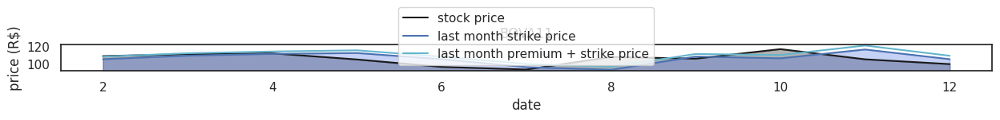

In [ ]:
# @title Fix Strike Margin Results with Details

reduced_simulation_dates = pd.DatetimeIndex(simulation_dates).month
sns.set_palette("icefire")
sns.set_style("white")
sns.set(font_scale=1)
strike_margin = 0.0
plt.figure(figsize=(15, 5))
plt.subplots_adjust(hspace=0.5,)
plt_idx = 0

results = fixed_strike_results[ticker][strike_margin]
plt_idx += 1
sns.set_palette("icefire")
sns.set_style("white")
plt.subplot(len(LIQUID_TICKERS_LIST), 1, plt_idx)
ax = sns.lineplot(x = reduced_simulation_dates[1:], y = results.stock_prices[1:],
                  color="k", label="stock price")
ax = sns.lineplot(x = reduced_simulation_dates[1:], y = [c[STRIKE_PRICE_FEATURE] if c is not None else np.nan for c in results.call_options],
                  color="b", label="last month strike price")

# Get the two lines from the axes to generate shading
l1 = ax.lines[0]
l2 = ax.lines[1]
# Get the xy data from the lines so that we can shade
x1 = l1.get_xydata()[:,0]
y1 = l1.get_xydata()[:,1]
x2 = l2.get_xydata()[:,0]
y2 = l2.get_xydata()[:,1]
ax.fill_between(x1,y1, color="black", alpha=0.3)
ax.fill_between(x2,y2, color="royalblue", alpha=0.3)

ax = sns.lineplot(
    x = reduced_simulation_dates[1:],
    y = [c[PREMIUM_FEATURE] + c[STRIKE_PRICE_FEATURE] if c is not None else np.nan for c in results.call_options],
    color="c",
    label="last month premium + strike price",
)

# recompute the ax.dataLim
ax.relim()
# update ax.viewLim using the new dataLim
ax.autoscale_view()

plt.xlabel("date")
plt.ylabel("price (R$)")
plt.title(ticker)

plt.show()

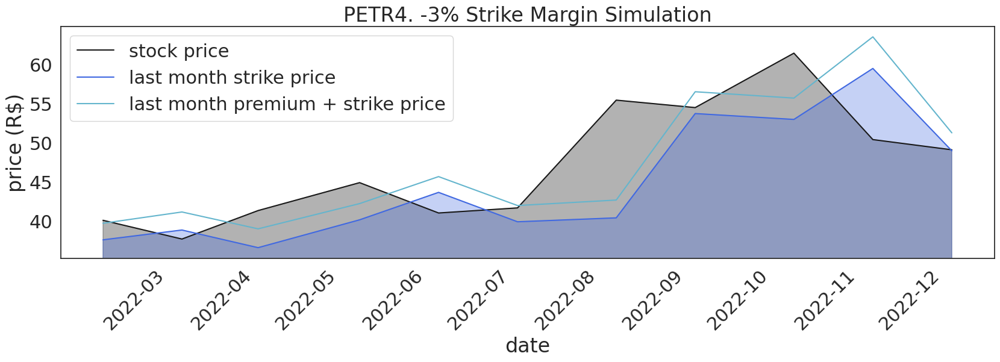

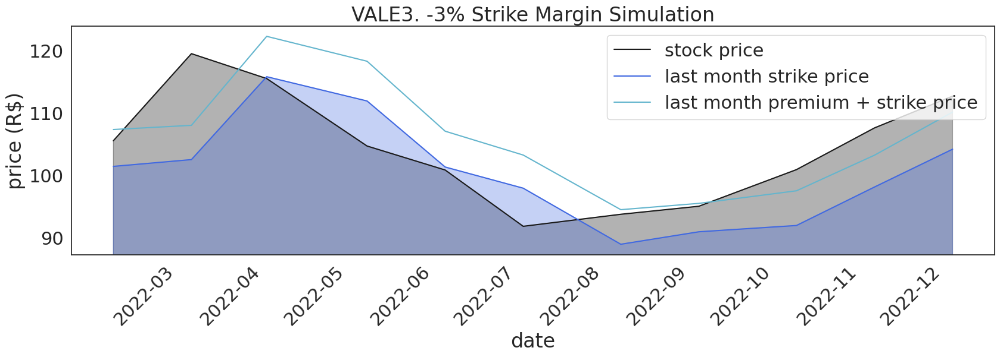

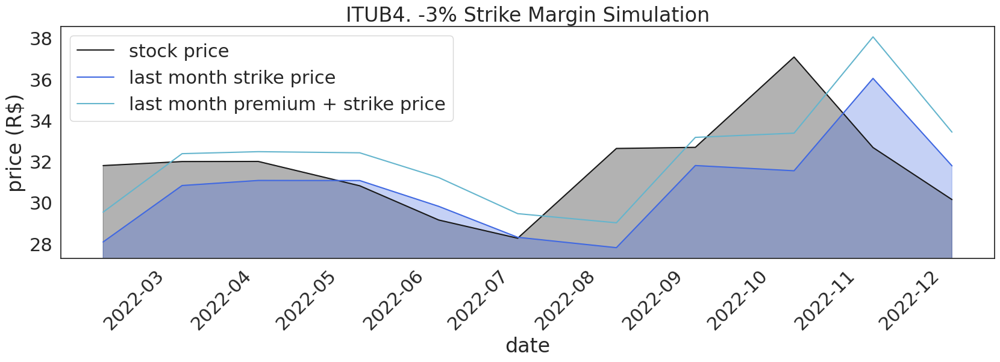

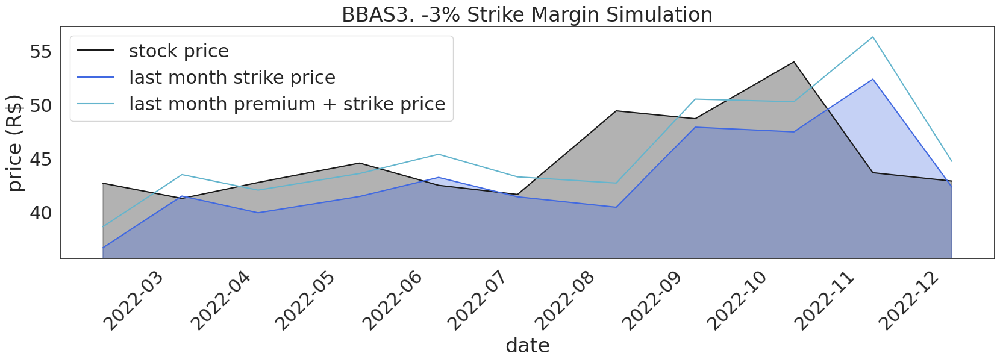

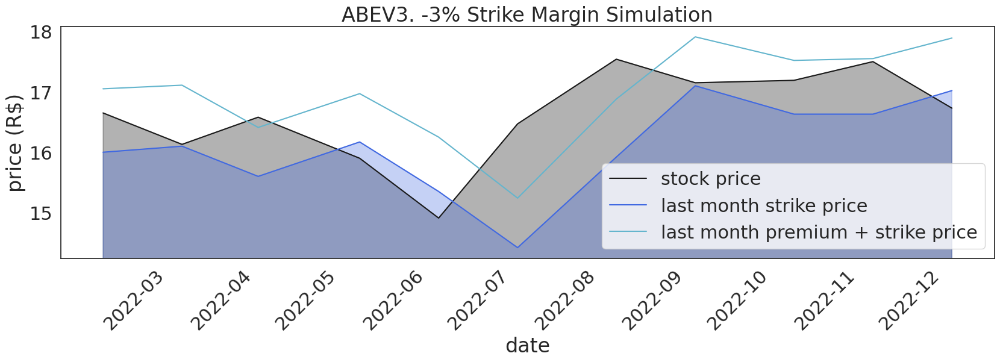

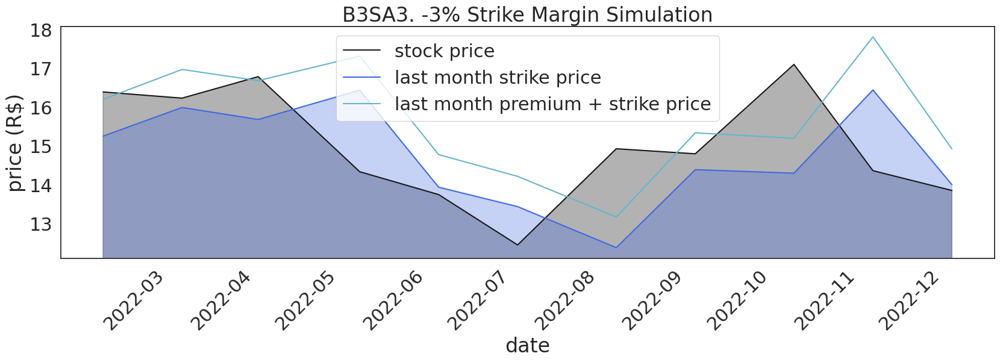

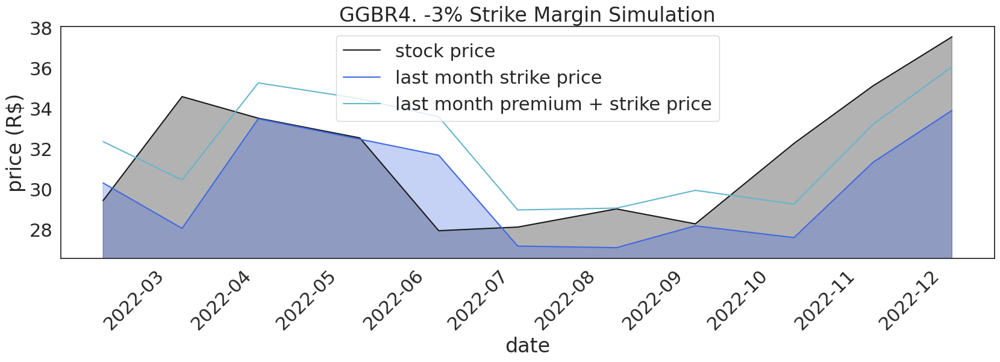

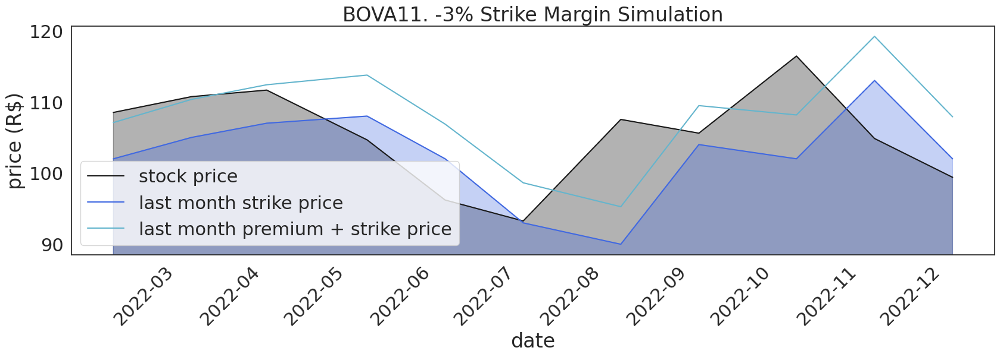

In [ ]:
# @title Fix Strike Margin Results with Details
# strike_margin = 0.0
# ticker = LIQUID_TICKERS_LIST[3]

for strike_margin in [-0.03]:
    for ticker in LIQUID_TICKERS_LIST:
        plot_simulation_results(results=fixed_strike_results[ticker][strike_margin], title=f"{ticker}. {strike_margin*100:.0f}% Strike Margin Simulation")
        plt.savefig(DATA_FOLDER_PATH + f"images/fixed_strike_{strike_margin*100:.0f}_{ticker.lower()}_results.png", bbox_inches='tight')

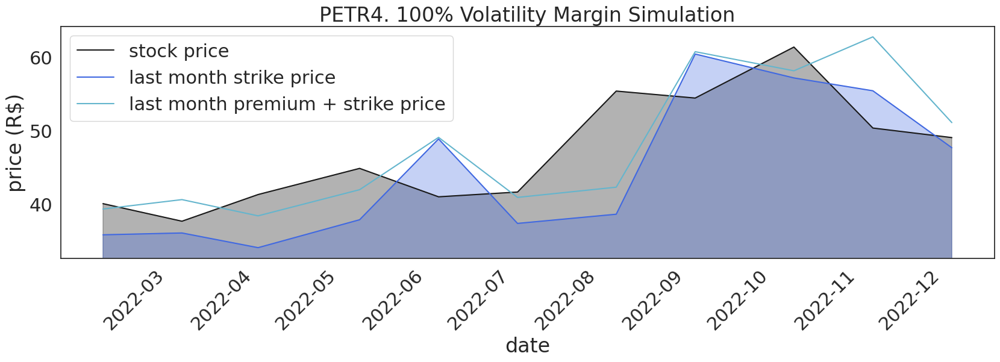

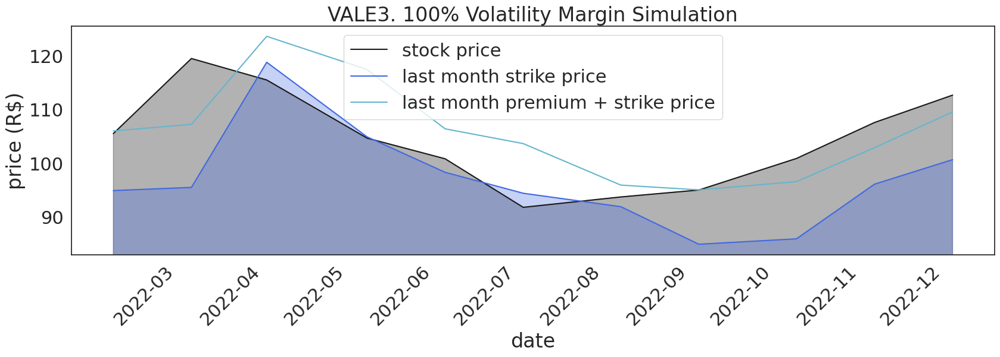

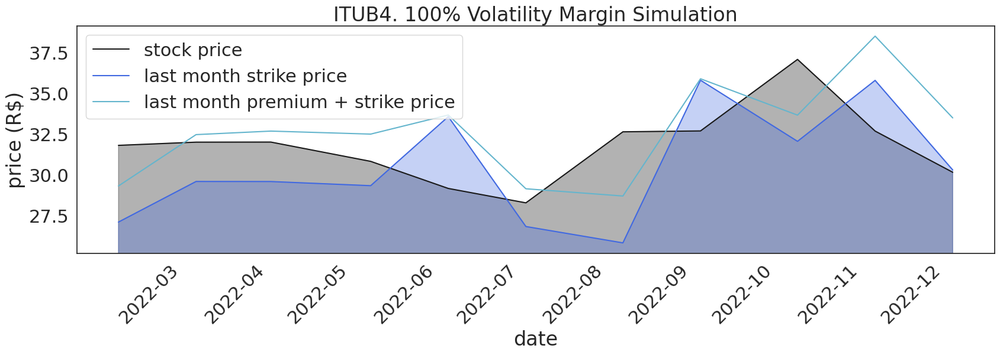

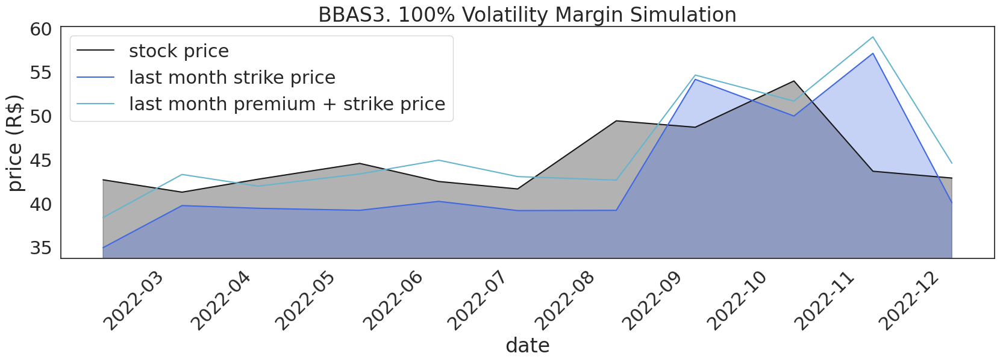

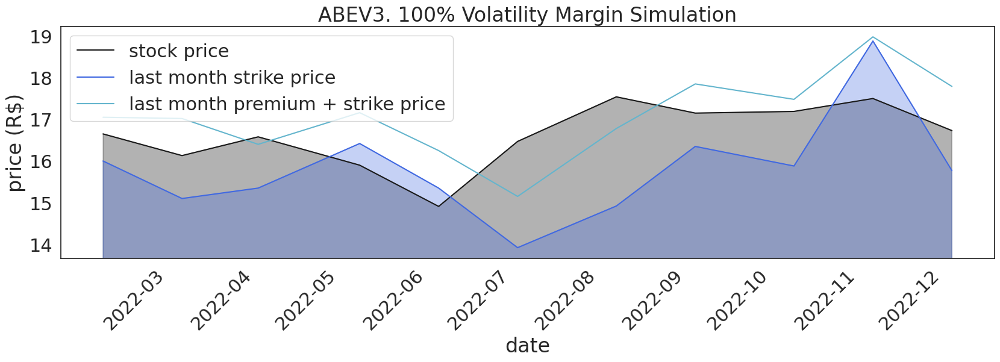

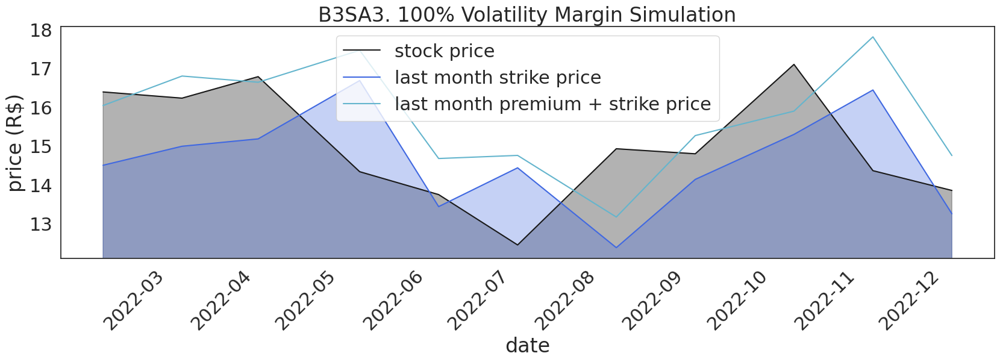

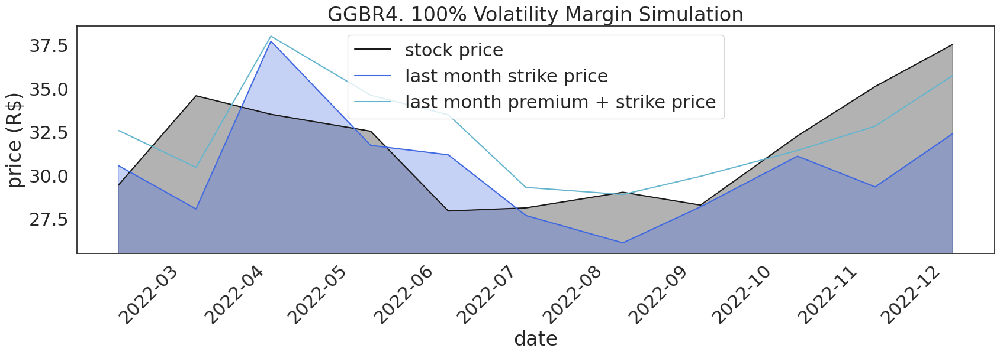

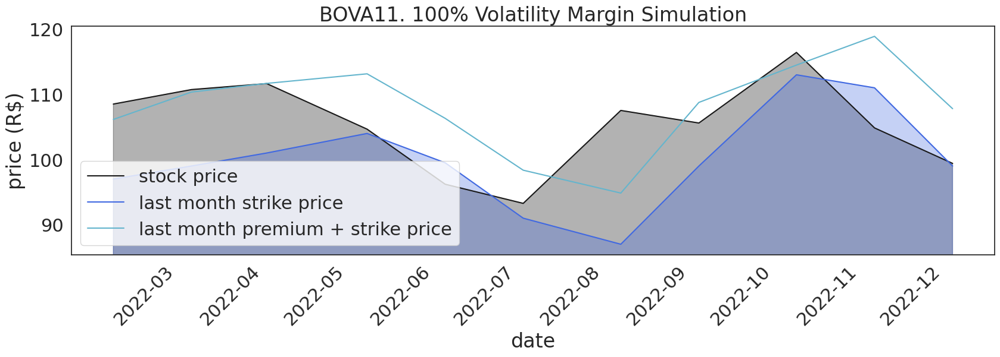

In [ ]:
# @title Fix Volatility Margin Results with Details

for vol_margin in [1]:
    for ticker in LIQUID_TICKERS_LIST:
        plot_simulation_results(results=fixed_vol_results[ticker][vol_margin], title=f"{ticker}. {vol_margin*100:.0f}% Volatility Margin Simulation")
        plt.savefig(DATA_FOLDER_PATH + f"images/fixed_vol_{vol_margin*100:.0f}_{ticker.lower()}_results.png", bbox_inches='tight')

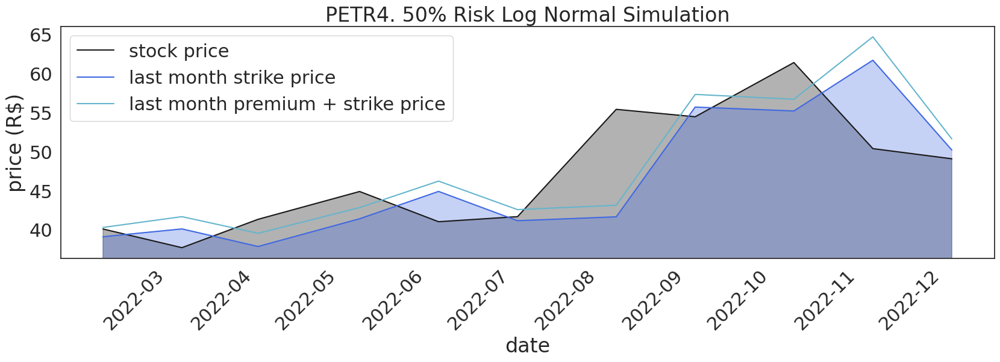

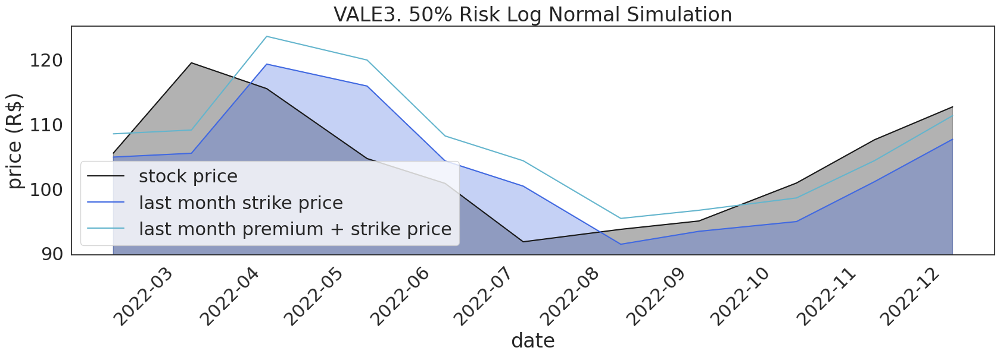

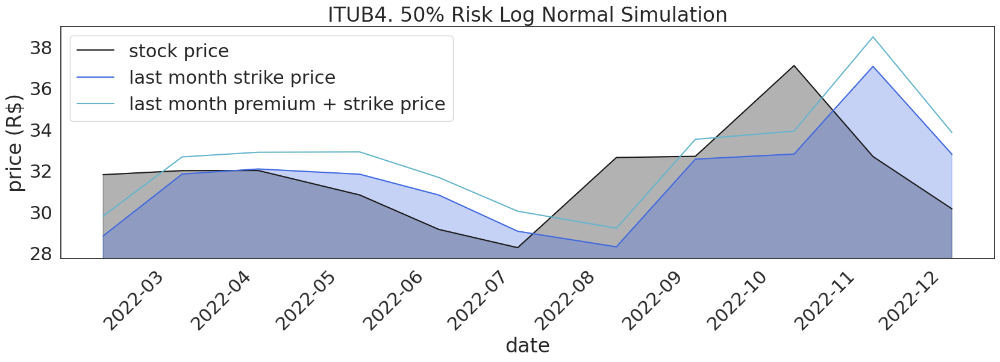

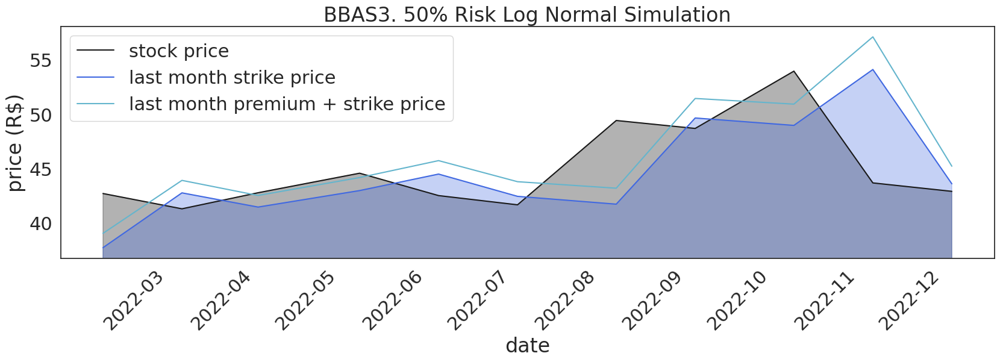

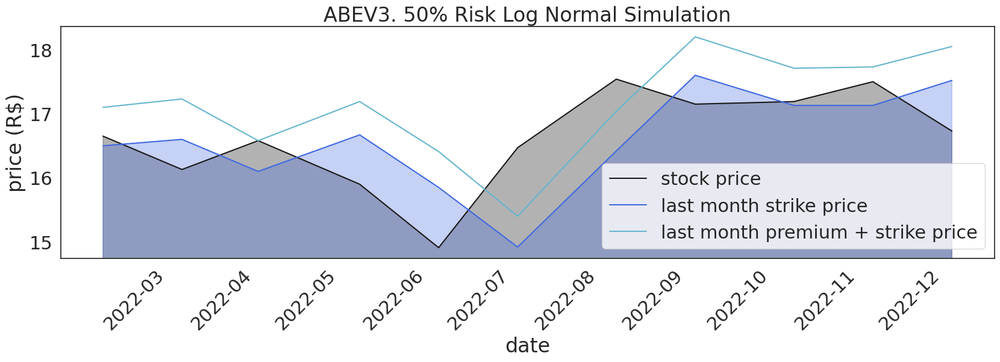

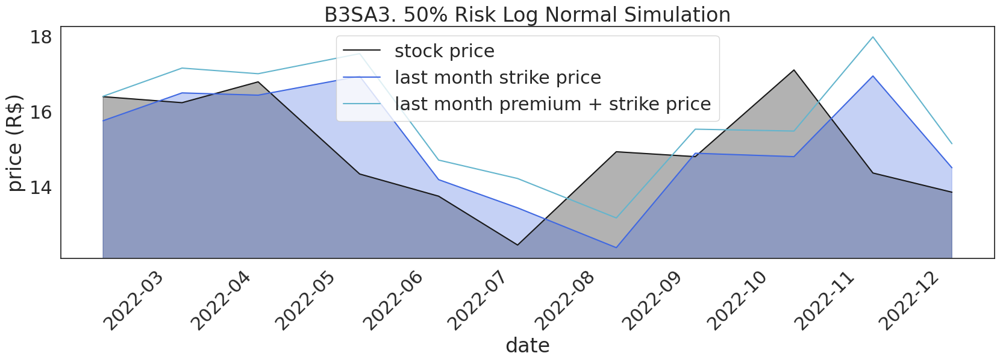

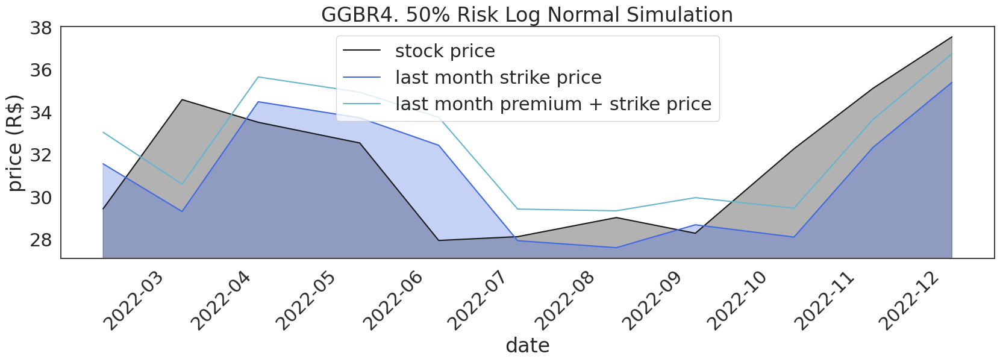

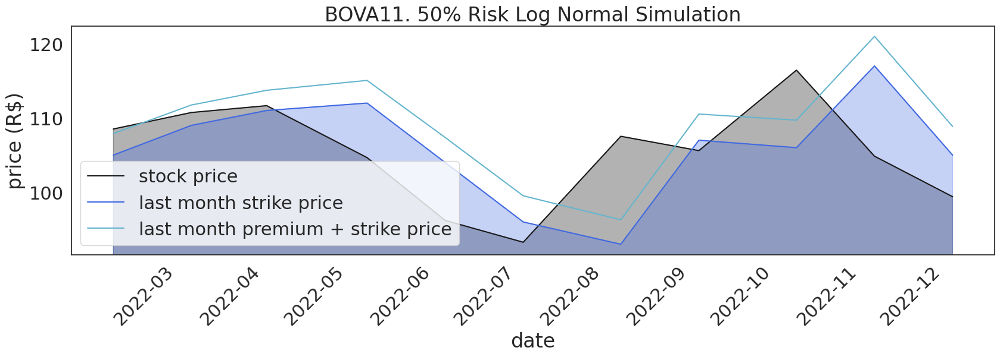

In [ ]:
# @title Fix Log Normal Results with Details

for strike_prob in [0.5]:
    for ticker in LIQUID_TICKERS_LIST:
        plot_simulation_results(results=lognormal_results[strike_prob][ticker], title=f"{ticker}. {strike_prob*100:.0f}% Risk Log Normal Simulation")
        plt.savefig(DATA_FOLDER_PATH + f"images/lognormal_{strike_prob*100:.0f}_{ticker.lower()}_results.png", bbox_inches="tight")

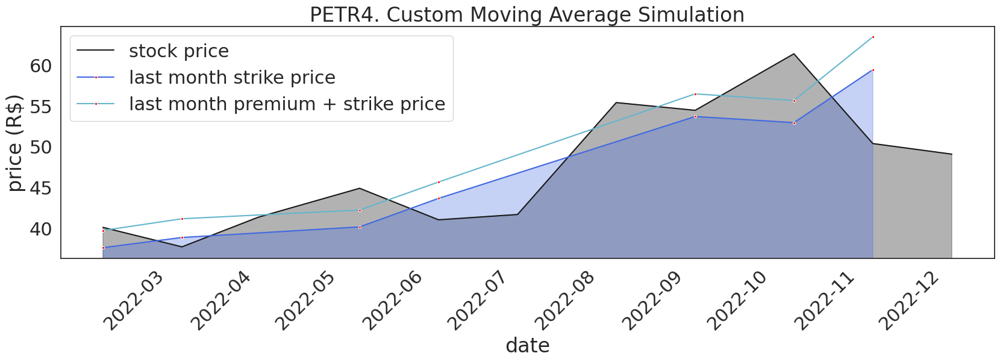

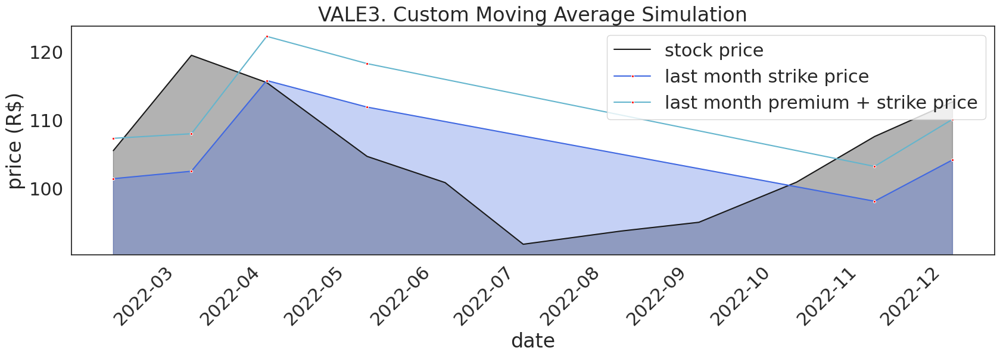

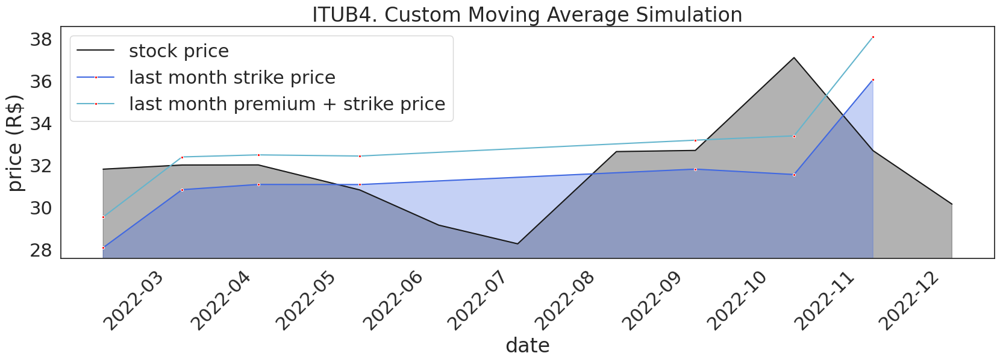

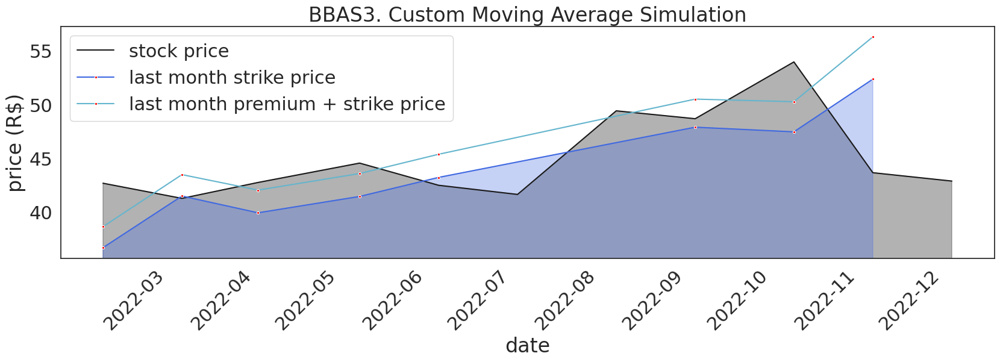

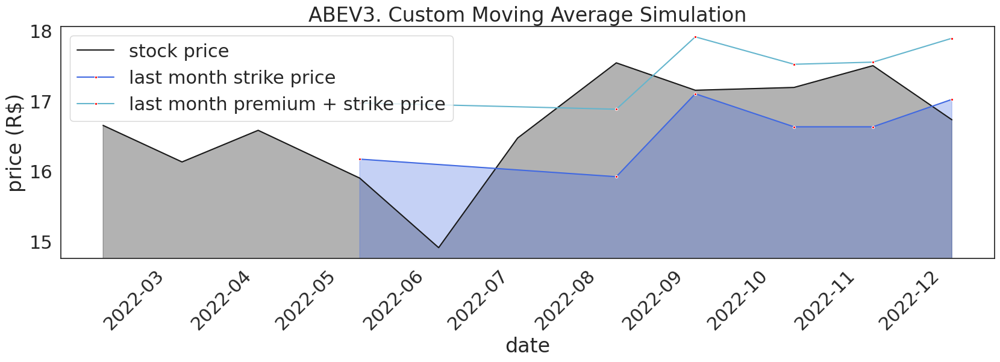

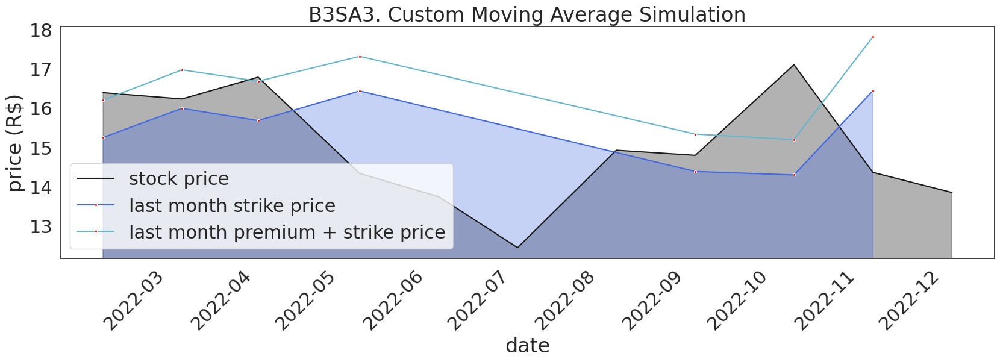

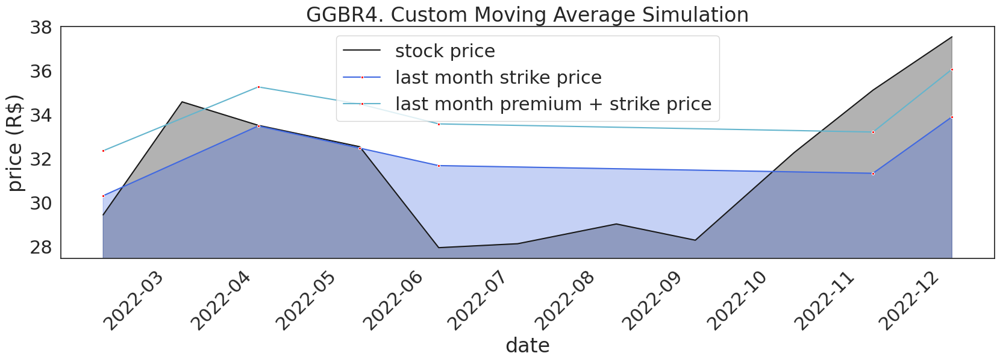

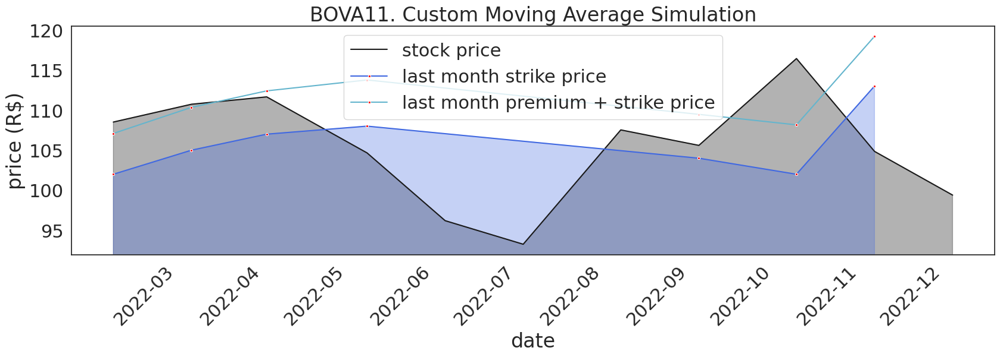

In [ ]:
# @title Custom Moving Average Results with Details

for ticker in LIQUID_TICKERS_LIST:
    plot_simulation_results(results=sma_strike_results[ticker], title=f"{ticker}. Custom Moving Average Simulation")
    plt.savefig(DATA_FOLDER_PATH + f"images/cma_{ticker.lower()}_results.png", bbox_inches="tight")

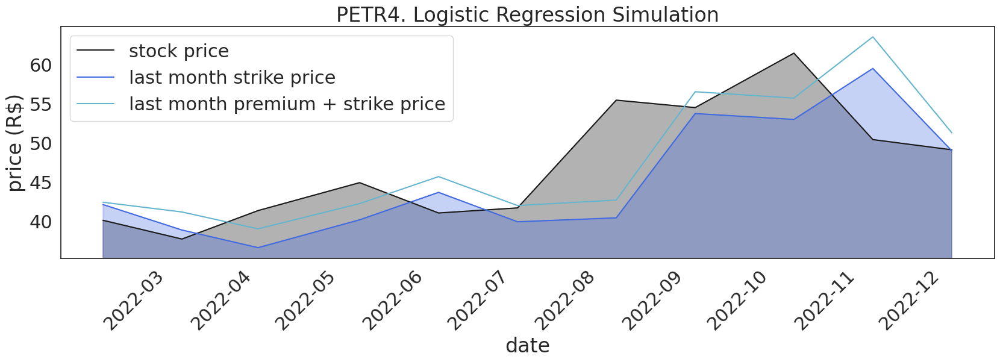

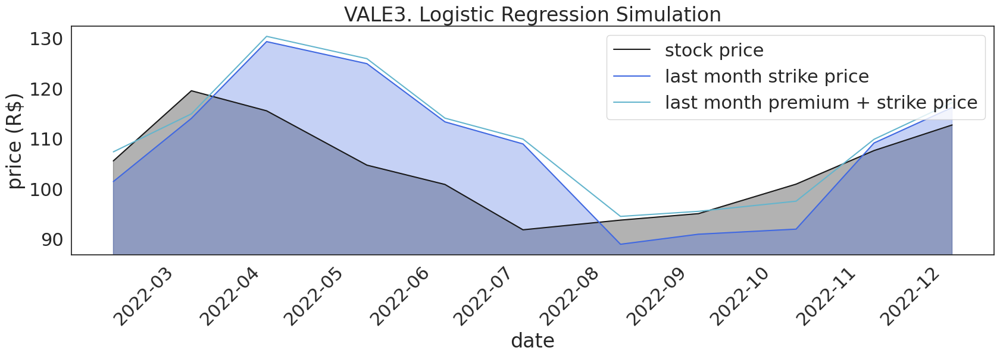

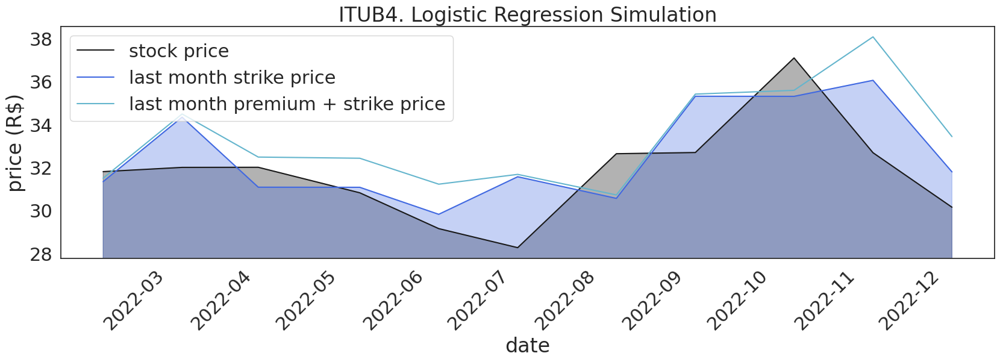

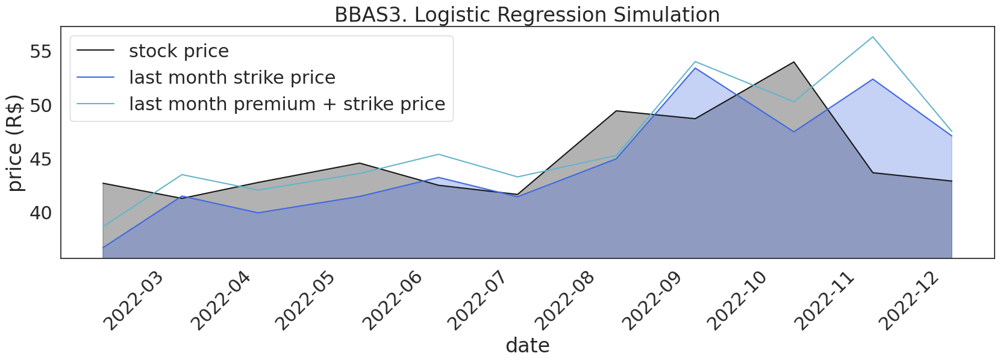

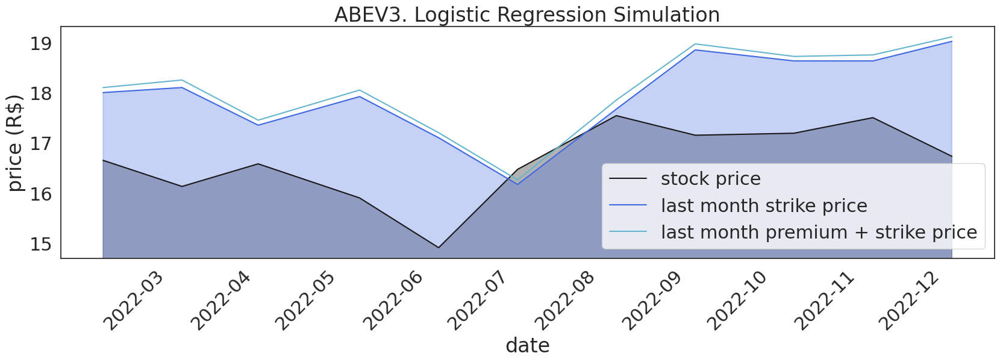

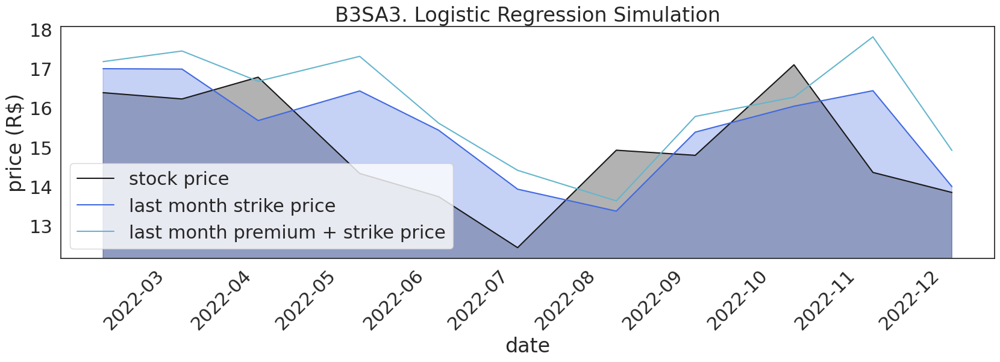

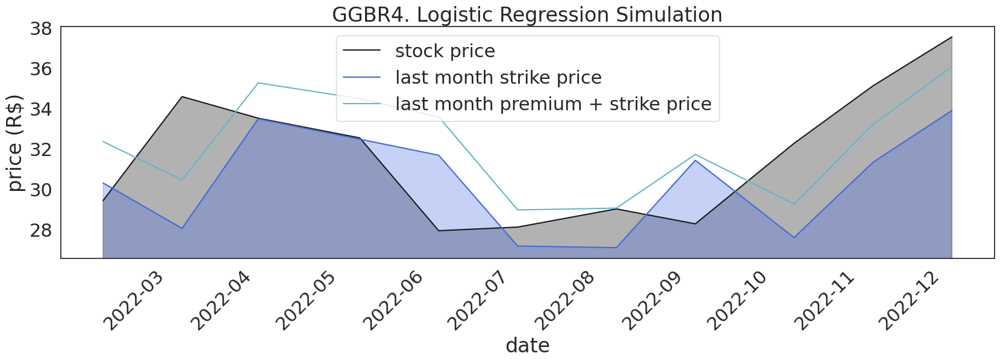

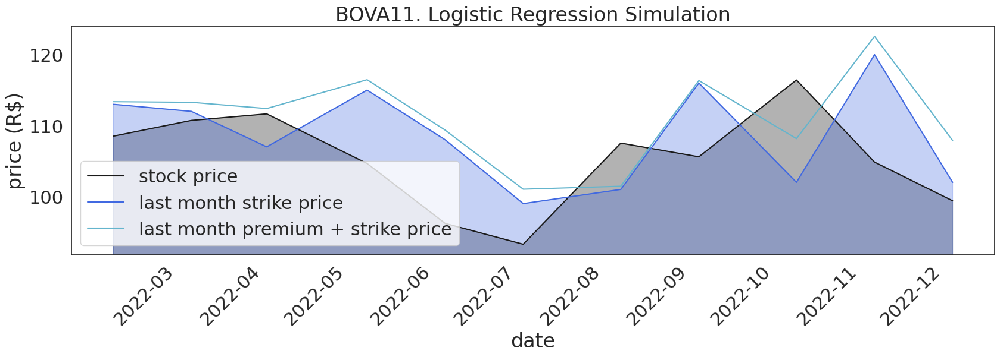

In [ ]:
# @title Logistic Regression Results with Details

for ticker in LIQUID_TICKERS_LIST:
    plot_simulation_results(results=multi_log_reg_results[ticker], title=f"{ticker}. Logistic Regression Simulation")
    plt.savefig(DATA_FOLDER_PATH + f"images/log_reg_{ticker.lower()}_results.png", bbox_inches="tight")

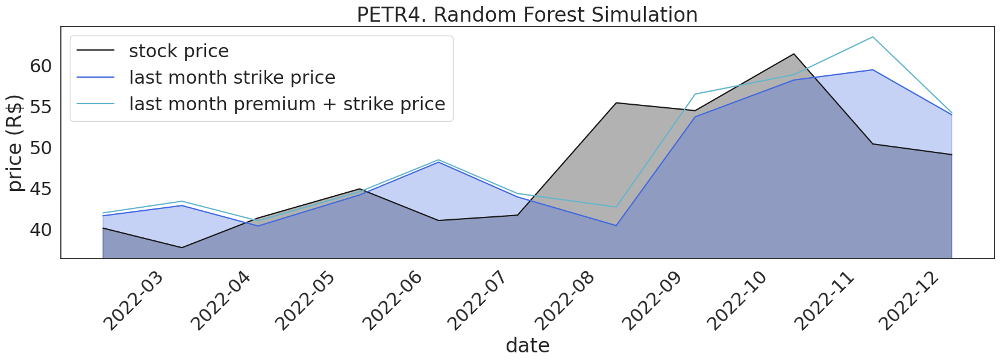

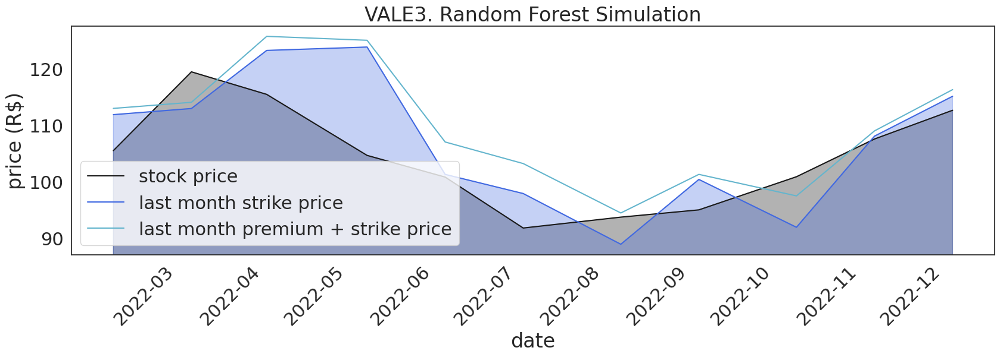

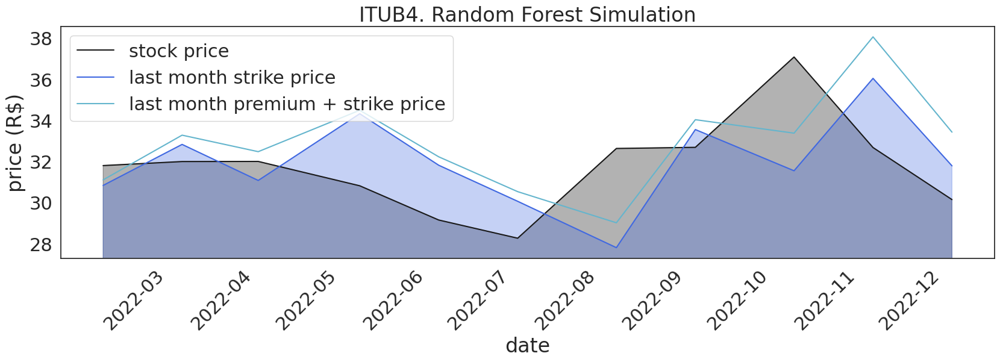

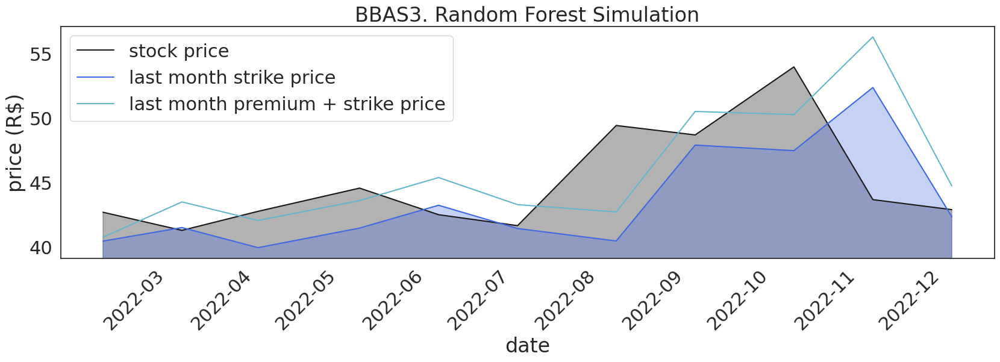

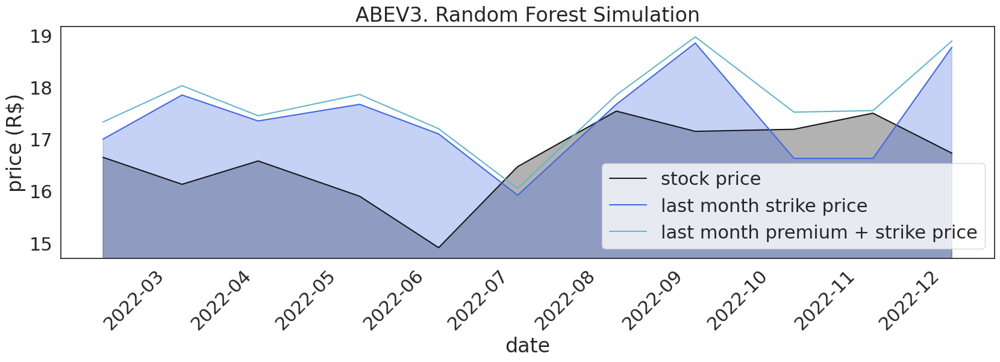

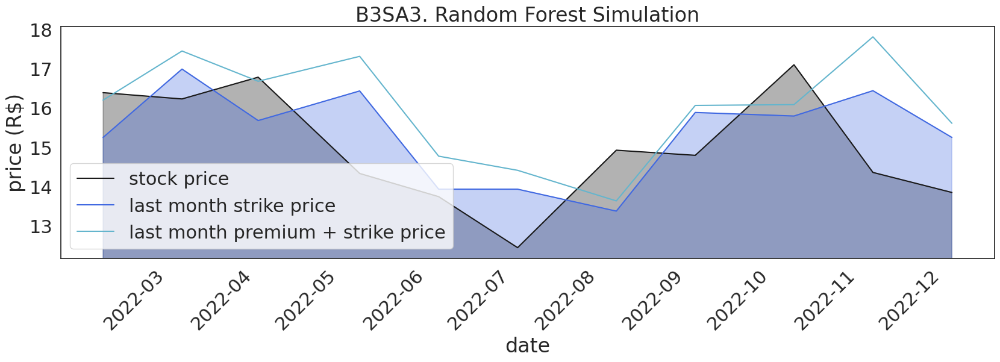

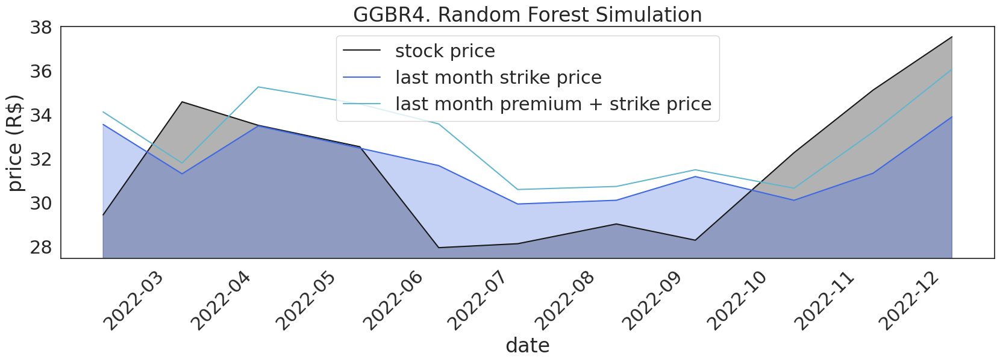

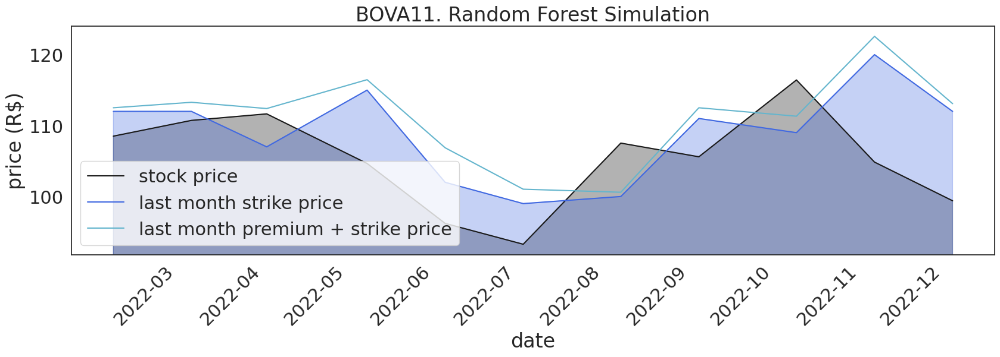

In [ ]:
# @title Random Forest Results with Details

for ticker in LIQUID_TICKERS_LIST:
    plot_simulation_results(results=multi_rand_forest_results[ticker], title=f"{ticker}. Random Forest Simulation")
    plt.savefig(DATA_FOLDER_PATH + f"images/rand_for_{ticker.lower()}_results.png", bbox_inches="tight")

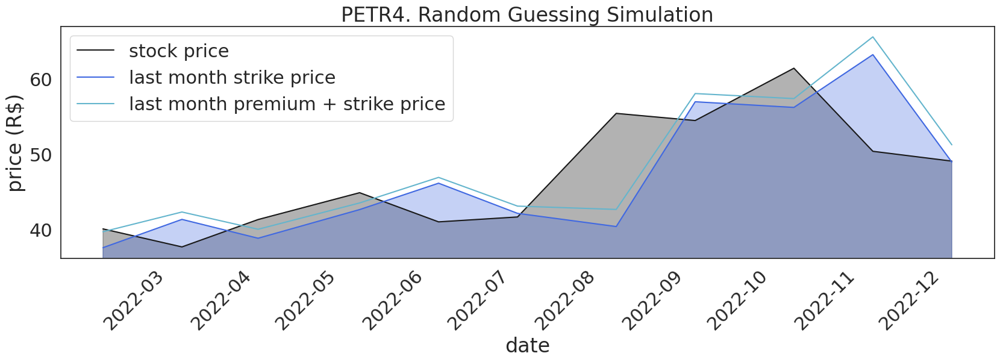

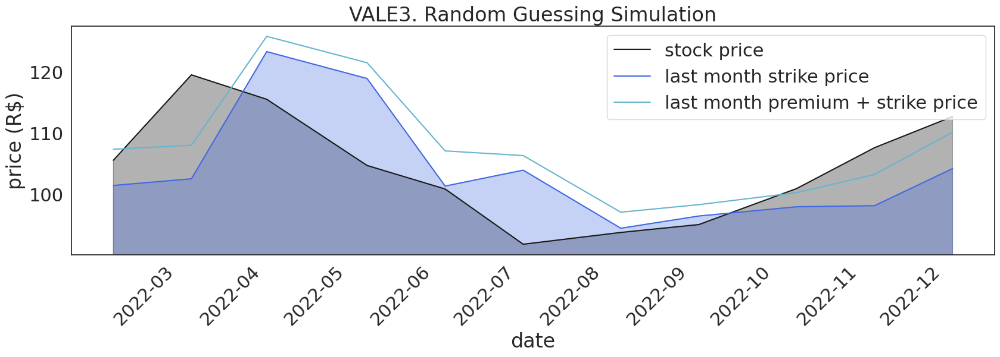

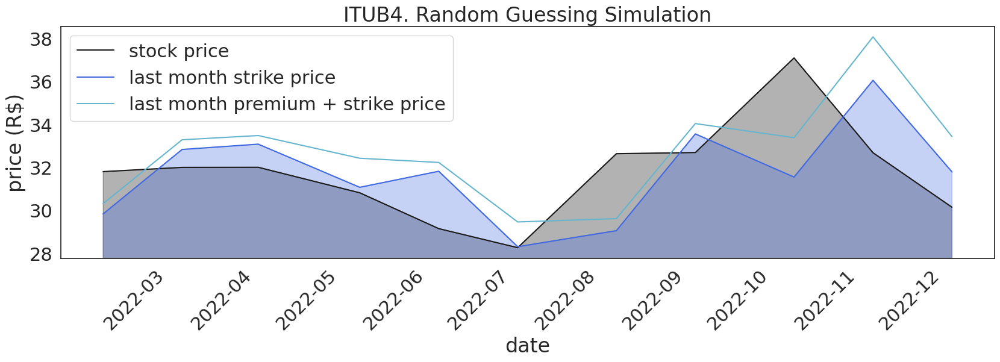

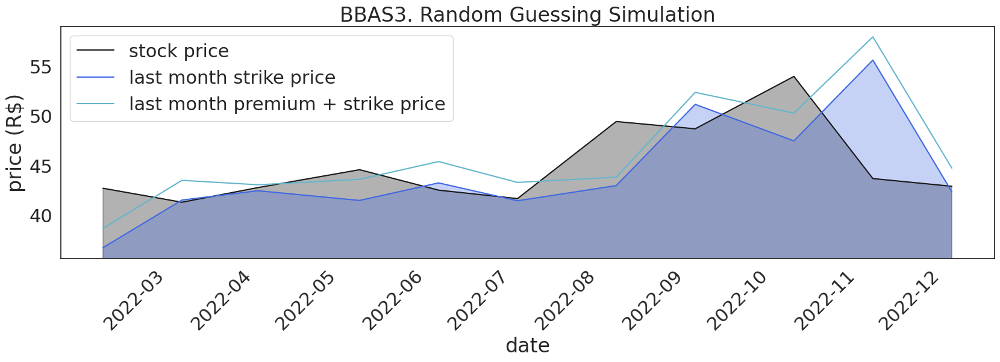

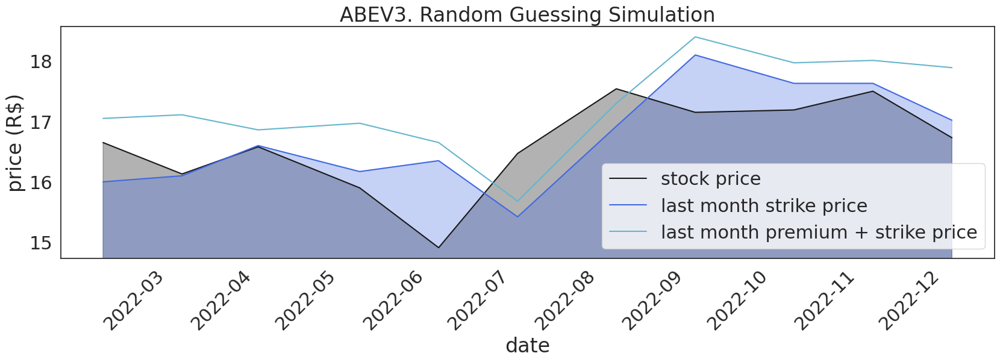

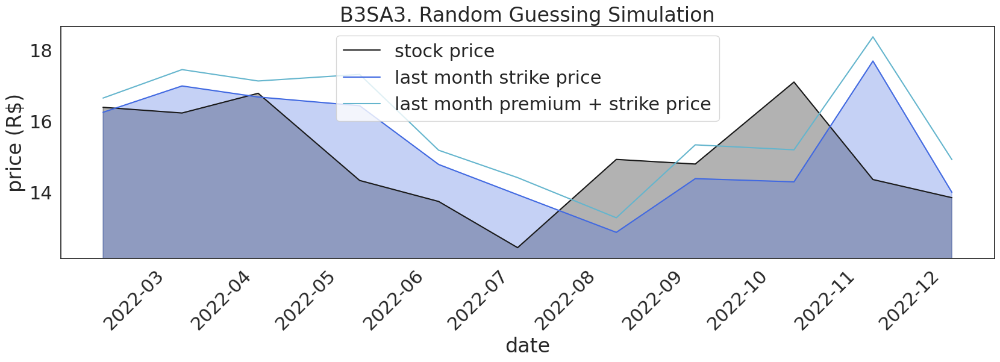

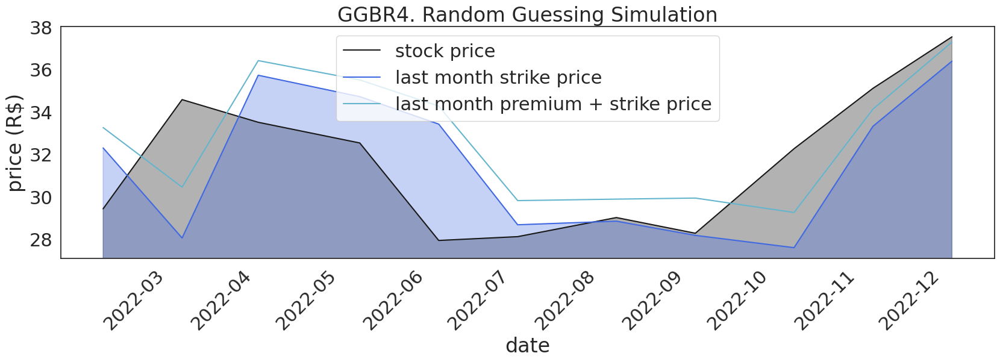

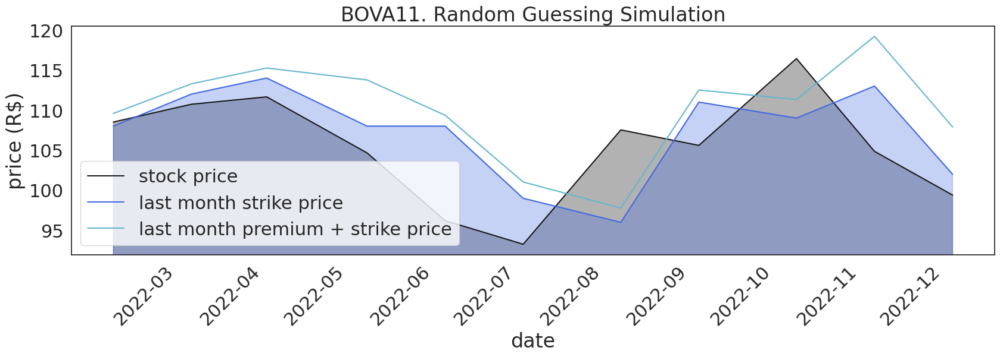

In [ ]:
# @title Random Guessing Results with Details

for ticker in LIQUID_TICKERS_LIST:
    plot_simulation_results(results=multi_class_random_results[ticker], title=f"{ticker}. Random Guessing Simulation")
    plt.savefig(DATA_FOLDER_PATH + f"images/rand_guess_{ticker.lower()}_results.png", bbox_inches="tight")

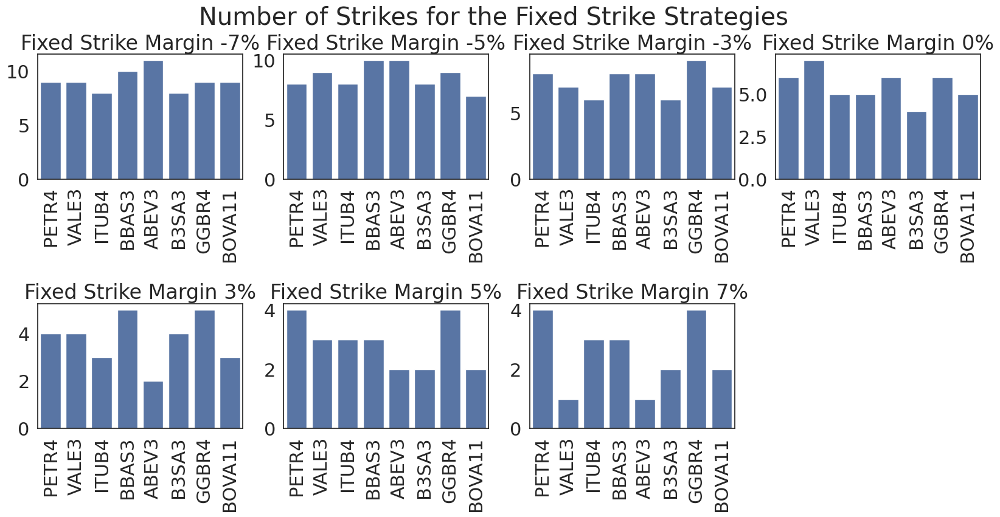

In [ ]:
# @title Fix Strike Margin Strike Number

fixed_strike_results

fig = plt.figure(figsize=(20, 8))
fig.suptitle("Number of Strikes for the Fixed Strike Strategies")
plt.subplots_adjust(hspace=1,)
plt_idx = 1
for strike_margin in strike_margins:
    plt.subplot(2, 4, plt_idx)
    plt.title(f"Fixed Strike Margin {100*strike_margin:.0f}%")
    sns.barplot(
        x=LIQUID_TICKERS_LIST,
        y=[fixed_strike_results[ticker][strike_margin].strike_number for ticker in LIQUID_TICKERS_LIST],
        color="b"
    )
    plt.xticks(rotation = 90)
    plt_idx += 1

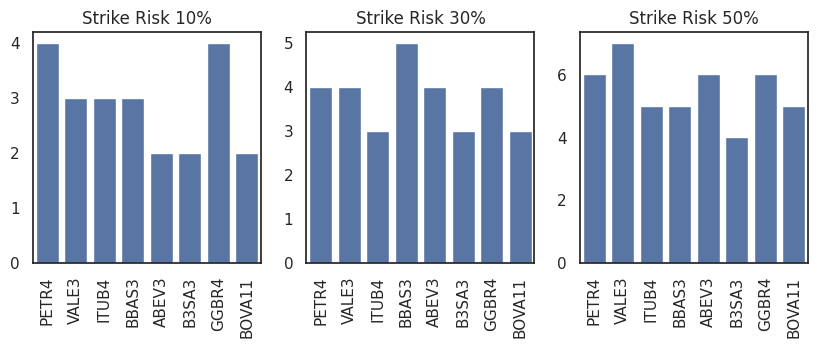

In [ ]:
# @title Log Normal Strike Number

fig = plt.figure(figsize=(10, 3))
plt_idx = 1
for strike_probability in strike_proba_tolerances:
    plt.subplot(1, 3, plt_idx)
    plt.title(f"Strike Risk {100*strike_probability:.0f}%")
    sns.barplot(
        x=LIQUID_TICKERS_LIST,
        y=[lognormal_results[strike_probability][ticker].strike_number for ticker in LIQUID_TICKERS_LIST],
        color="b"
    )
    plt.xticks(rotation = 90)
    plt_idx += 1

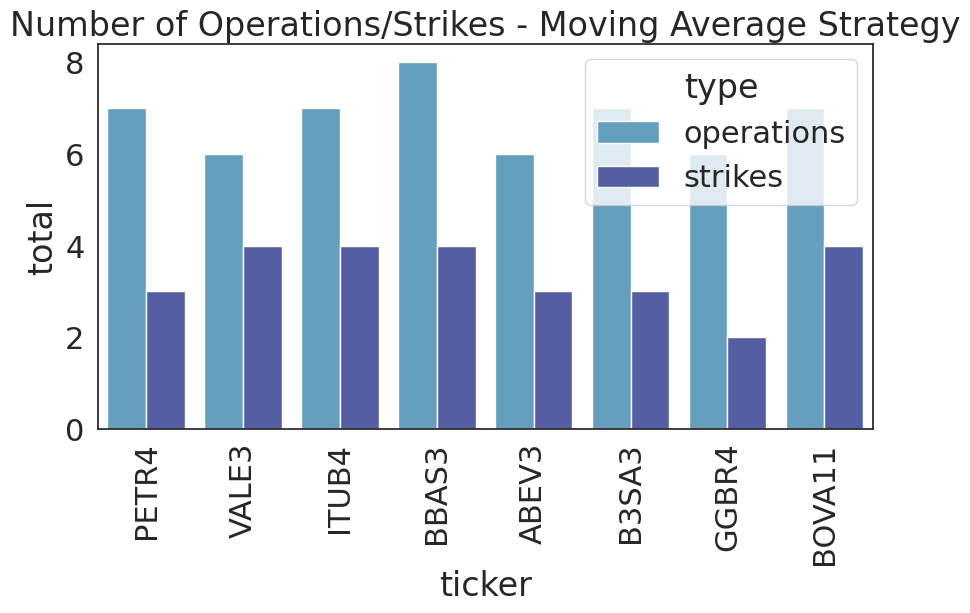

In [62]:
# @title Custom Moving Average Strike Number

data = [[ticker, len(simulation_dates) - results.months_without_selling - 1, "operations"] for ticker, results in sma_strike_results.items()]
data += [[ticker, results.strike_number, "strikes"] for ticker, results in sma_strike_results.items()]

fig = plt.figure(figsize=(10, 5))
plt.title(f"Number of Operations/Strikes - Moving Average Strategy")
sns.barplot(
    x="ticker",
    y="total",
    hue="type",
    data=pd.DataFrame(data, columns=["ticker", "total", "type"]),
    ci=None
)
_ = plt.xticks(rotation = 90)

In [50]:
df

,ticker,number,type
0,PETR4,8,operations
1,VALE3,7,operations
2,ITUB4,8,operations
3,BBAS3,9,operations
4,ABEV3,7,operations
5,B3SA3,8,operations
6,GGBR4,7,operations
7,BOVA11,8,operations
8,PETR4,3,strikes
9,VALE3,4,strikes


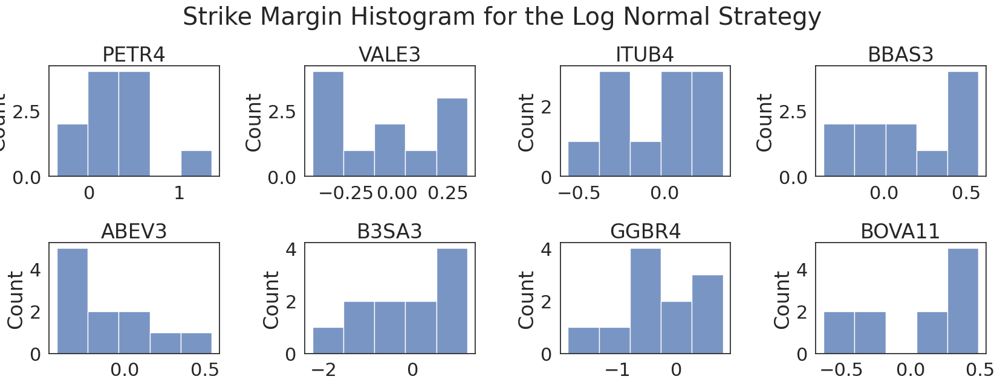

In [ ]:
# @title Log Normal Strike Margin

fig = plt.figure(figsize=(20, 10))
fig.suptitle("Strike Margin Histogram for the Log Normal Strategy")
plt.subplots_adjust(hspace=0.6, wspace=0.5)
plt_idx = 1
for ticker in lognormal_results[0.5].keys():
    plt.subplot(3, 4, plt_idx)
    plt.title(ticker)
    sns.histplot(lognormal_results[0.5][ticker].strike_margins, bins=5, color="b")
    plt_idx += 1

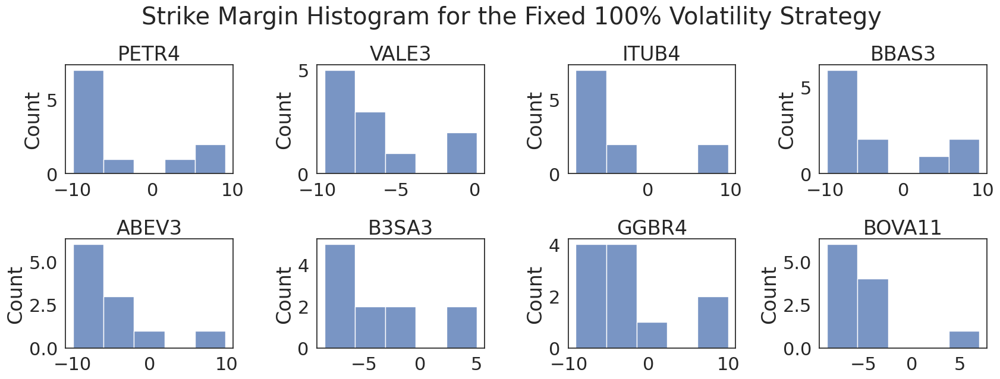

In [ ]:
# @title Fixed Vol Strike Margin

fig = plt.figure(figsize=(20, 10))
fig.suptitle("Strike Margin Histogram for the Fixed 100% Volatility Strategy")
plt.subplots_adjust(hspace=0.6, wspace=0.5)
plt_idx = 1
for ticker in fixed_vol_results.keys():
    plt.subplot(3, 4, plt_idx)
    plt.title(ticker)
    sns.histplot(fixed_vol_results[ticker][1].strike_margins, bins=5, color="b")
    plt_idx += 1

In [ ]:
# @title Custom Moving Average Strike Margin

sns.set(font_scale=1.5)
sns.set_palette("icefire")
sns.set_style("white")

plot_strike_margins_hist(results=sma_strike_results)

## References

* https://playinvest.com.br/

* Dividends PETR4: https://www.investidorpetrobras.com.br/acoes-dividendos-e-dividas/dividendos-e-jcp/

* Dividends VALE3: https://playinvest.com.br/dividendos/vale3

* Dividends ITUB4: https://www.itau.com.br/relacoes-com-investidores/itau-unibanco/nossas-acoes/acoes-dividendos-e-jcp/

* The link to the historical data can be found at: https://www.b3.com.br/en_us/market-data-and-indices/data-services/market-data/historical-data/equities/historical-quotes/

* Volatility smile: https://www.investopedia.com/terms/v/volatilitysmile.asp

* A helpful site to understand how to parse the data: https://github.com/tumenas/PythonFinancas/blob/main/leitura_b3.ipynb

* For more information about how the data is formatted, check out the file data/SeriesHistoricas_Layout.pdf

* Stock options strategies: https://www.researchgate.net/publication/313238749

* Volatility: https://www.codearmo.com/blog/implied-volatility-european-call-python; https://riconnect.rico.com.vc/blog/volatilidade; https://www.b3.com.br/pt_br/market-data-e-indices/servicos-de-dados/market-data/consultas/mercado-a-vista/volatilidades-dos-ativos/desvio-padrao/

* Black-Scholes Model: https://en.wikipedia.org/wiki/Black%E2%80%93Scholes_model

* Selic rate: https://www.bcb.gov.br/controleinflacao/historicotaxasjuros

* https://medium.com/analytics-vidhya/how-to-use-google-colab-with-github-via-google-drive-68efb23a42d

* https://medium.com/luca-chuangs-bapm-notes/build-a-neural-network-in-python-binary-classification-49596d7dcabf